In [1]:
# @title --=== RUN TO START ===-- (Imports and Definitions)
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from tqdm.keras import TqdmCallback

SHEET_ID = '1OdllC9j05ka_adHvipTn58XPqmLt5f1VLBzHFd9aRJQ'
SHEET_NAME = 'GoL'
SLEEP = 1.5

def get_filter_coords(point_coords):
  """
  x0y0 xiy0 x2y0
  x0yi xiyi x2yi
  x0y2 xiy2 x2y2
  """
  xi, yi = point_coords

  x0 = xi - 1
  x2 = xi + 1
  y0 = yi - 1
  y2 = yi + 1

  ul = (x0, y0)  # upper left
  uc = (xi, y0)  # upper center
  ur = (x2, y0)  # upper right
  ml = (x0, yi)  # middle left
  #mc = (xi, yi)  # middle center
  mr = (x2, yi)  # middle right
  ll = (x0, y2)  # lower left
  lc = (xi, y2)  # lower center
  lr = (x2, y2)  # lower right

  filter_coords = ul, uc, ur, ml, mr, ll, lc, lr
  
  return filter_coords


def read_coord(board, coord):
  shape_y, shape_x = board.shape
  xi, yi = coord
  if (xi < 0) or (yi < 0):
    return 0
  if (xi >= shape_x) or (yi >= shape_y):
    return 0
  return board[xi][yi]


def read_filter(board, filter_coords):
  for coord in filter_coords:
    yield read_coord(board, coord)


def play_a_cell(board, cell_coords):  
  initial_state = read_coord(board, cell_coords)
  filter_coords = get_filter_coords(cell_coords)
  sum_neighbours = sum(read_filter(board, filter_coords))
  if sum_neighbours == 3:
    return 1
  if sum_neighbours == 2:
    return initial_state
  return 0


def play(board, padding=0, show=False) -> pd.DataFrame:
  shape_y, shape_x = board.shape
  result  = pd.DataFrame(
      np.zeros((shape_y-2*padding, shape_x-2*padding), dtype=int)
      )
  for xi in range(padding, shape_x-padding):
    for yi in range(padding, shape_y-padding):
      result[xi-padding][yi-padding] = play_a_cell(board, [xi, yi])
  if show:
    plt.imshow(result)
    plt.title(f'Board {np.array(board.shape)-2*padding}, {padding=}.')
    plt.show()
  return result


def play_n_steps(board, steps, padding=0, show=False):
    result = play(board, padding=padding, show=show)
    for i in range(steps - 1):
        result = play(result, padding=padding, show=show)
    return result


def load_board(sheet_id=SHEET_ID, sheet_name=SHEET_NAME, show=False):
  google_sheets_url = 'https://docs.google.com/spreadsheets/d/'
  google_sheets_url += f'{sheet_id}/gviz/tq?tqx=out:csv&sheet={sheet_name}'
  board = pd.read_csv(google_sheets_url, header=None)
  if show:
    plt.imshow(board)
    plt.title(f'Game of Life Board. {board.shape=}')
    plt.show()
  return board


def generate_board(
    shape,
    padding=False,
    pad_value=0,
    levels=5,
    regulate_extreme_cases=False,
    show=False):
  """
  'outer' padding surrounds the array with zeros explicitly
  the shape of the board changes (+2 to each dimension)
  padding at conv2d layer is meant to be set to 'valid'
  """
  if levels:
    choice_ = np.random.randint(0, 1+1, levels)
    if regulate_extreme_cases:
      choice_ = np.concatenate([[0, 1], choice_])
    rand_array = np.random.choice(choice_, shape)
  else:
    rand_array = np.random.randint(0, 1+1, shape)
  if padding:
    assert padding == 'outer', 'padding must be either "outer" or None'
  if padding == 'outer':
    rand_array = np.pad(
        rand_array, 1, mode='constant', constant_values=pad_value)
  rand_board = pd.DataFrame(rand_array)
  if show:
    plt.imshow(rand_board)
    plt.title(f'Randomized board {shape}, {levels=}, {regulate_extreme_cases=}.')
    plt.show()
  return rand_board

# The Model That Works (Predefined conv weights)

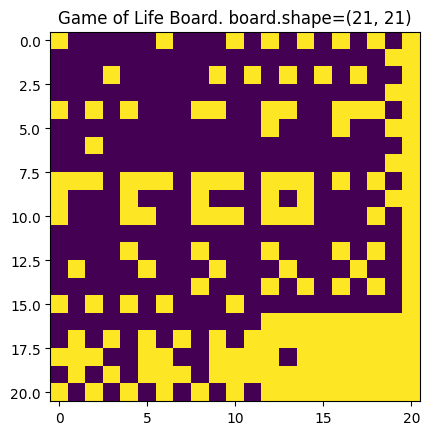

In [ ]:
X_train = load_board(sheet_name='Training_Board', show=True)

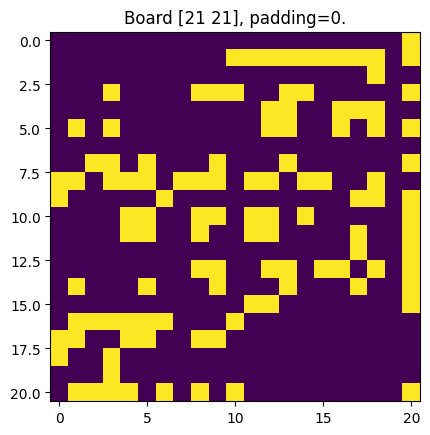

In [ ]:
y_train = play(X_train, padding=0, show=True)

In [ ]:
class ProperReshape(tf.keras.layers.Reshape):
  
  def compute_output_shape(self, input_shape):
        input_shape = tf.TensorShape(input_shape).as_list()
        if None in input_shape[1:]:
            output_shape = [input_shape[0]]
            output_shape += tuple(
                s if s != -1 else None for s in self.target_shape
            )
        else:
            output_shape = [input_shape[0]]
            output_shape += self._fix_unknown_dimension(
                input_shape[1:], self.target_shape
            )
        return tf.TensorShape(output_shape)[1:]
  
  def call(self, inputs):
        result = tf.reshape(inputs, self.target_shape)
        if not tf.executing_eagerly():
            result.set_shape(self.compute_output_shape(inputs.shape))
        return result

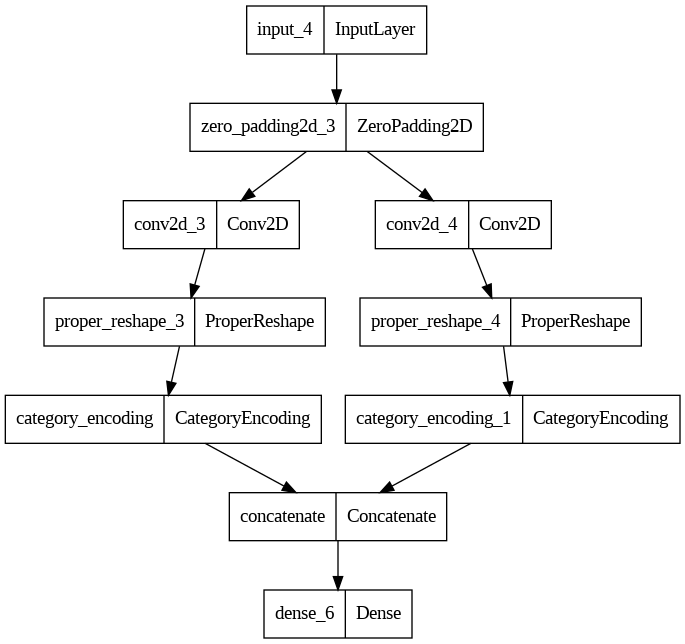

In [ ]:
weights_center = [
    np.array(
    [
        [[[0]],[[0]],[[0]]],
        [[[0]],[[1]],[[0]]],
        [[[0]],[[0]],[[0]]]
    ])
]
weights_perimeter = [
    np.array(
    [
        [[[1]],[[1]],[[1]]],
        [[[1]],[[0]],[[1]]],
        [[[1]],[[1]],[[1]]]
    ])
]

input_shape = (X_train.shape[0], X_train.shape[1], 1)
input_layer = tf.keras.layers.Input(shape=input_shape)
zero_padding_layer = tf.keras.layers.ZeroPadding2D()(input_layer)

conv2d_center_layer = tf.keras.layers.Conv2D(
    filters=1,
    kernel_size=(3, 3),
    use_bias=False,
    weights=weights_center,
    trainable=False
    )(zero_padding_layer)
reshape_center_layer = ProperReshape([X_train.shape[0]*X_train.shape[1], 1])(conv2d_center_layer)
cat_center_layer = tf.keras.layers.CategoryEncoding(num_tokens=2, output_mode='multi_hot')(reshape_center_layer)

conv2d_perimeter_layer = tf.keras.layers.Conv2D(
    filters=1,
    kernel_size=(3, 3),
    use_bias=False,
    weights=weights_perimeter,
    trainable=False
    )(zero_padding_layer)
reshape_perimeter_layer = ProperReshape([X_train.shape[0]*X_train.shape[1], 1])(conv2d_perimeter_layer)
cat_perimeter_layer = tf.keras.layers.CategoryEncoding(num_tokens=9, output_mode='multi_hot')(reshape_perimeter_layer)

concat_layer = tf.keras.layers.Concatenate(axis=1)([cat_center_layer, cat_perimeter_layer])
output_layer = tf.keras.layers.Dense(
    2,
    activation='sigmoid'
    )(concat_layer)
model = tf.keras.models.Model(inputs=input_layer, outputs=output_layer)

adam = tf.keras.optimizers.Adam(learning_rate=0.1)
model.compile(optimizer=adam, loss='mse')
tf.keras.utils.plot_model(model)

In [ ]:
X_train_ready = np.array(X_train)[None, ..., None]
y_train_ready = tf.keras.utils.to_categorical(
    ProperReshape(
        [y_train.shape[0]*y_train.shape[1], 1])(y_train))[None, ...]

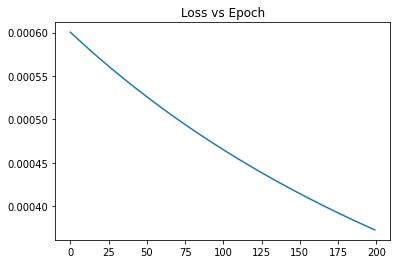

In [ ]:
history = model.fit(
    X_train_ready,
    y_train_ready,
    epochs=200,
    verbose=False
)
plt.title('Loss vs Epoch')
plt.plot(history.history['loss'])
plt.show()

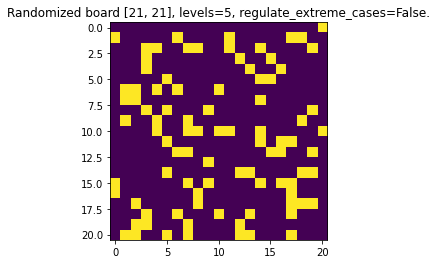

In [ ]:
X_test = generate_board([21,21], show=True)

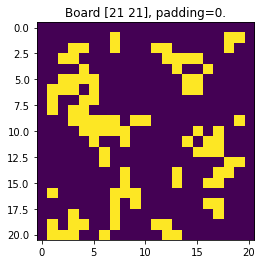

In [ ]:
y_test = play(X_test, show=True)

1/1 [==============================] - 0s 126ms/step


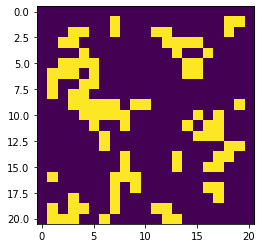

In [ ]:
y_pred = model.predict(np.array(X_test)[None, ..., None])
plt.imshow(np.argmax(y_pred, axis=1).reshape(X_test.shape[0], X_test.shape[1]))
plt.show()

# Predefined Conv Weights Test

## categorical output

### extra layer, adam

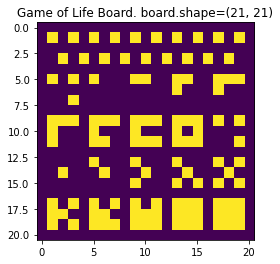

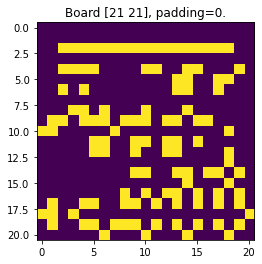

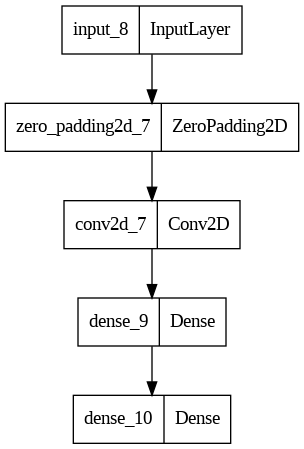

In [ ]:
X_train = load_board(sheet_name='Training_Board', show=True)
y_train = play(X_train, padding=0, show=True)
input_shape = (X_train.shape[0], X_train.shape[1], 1)

conv2d_weights = [np.array([
    [[[0, 1]], [[0, 1]], [[0, 1]]],
    [[[0, 1]], [[1, 0]], [[0, 1]]],
    [[[0, 1]], [[0, 1]], [[0, 1]]]
    ])]

input_layer = tf.keras.layers.Input(shape=input_shape)
zero_padding_layer = tf.keras.layers.ZeroPadding2D()(input_layer)

conv2d = tf.keras.layers.Conv2D(
    filters=2,
    kernel_size=(3, 3),
    use_bias=False,
    weights=conv2d_weights,
    trainable=False
    )(zero_padding_layer)

# output_layer = tf.keras.layers.Conv2D(
#     filters=2,
#     kernel_size=(2, 1),
#     padding='same',
#     activation='sigmoid'
#     )(conv2d)

dense_layer = tf.keras.layers.Dense(
    32,
    activation='sigmoid'
    )(conv2d)
output_layer = tf.keras.layers.Dense(
    2,
    activation='sigmoid'
    )(dense_layer)

model = tf.keras.models.Model(inputs=input_layer, outputs=output_layer)

adam = tf.keras.optimizers.Adam(learning_rate=0.1)
model.compile(optimizer=adam, loss='mse')
tf.keras.utils.plot_model(model)

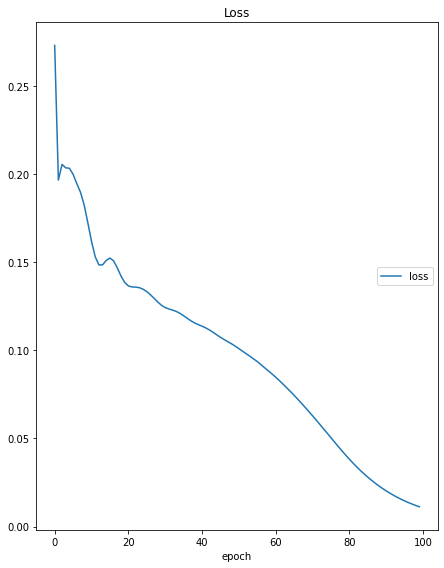

Loss
	loss             	 (min:    0.011, max:    0.273, cur:    0.011)
1/1 [==============================] - 0s 313ms/step - loss: 0.0112


In [ ]:
X_train_ready = np.array(X_train)[None, ..., None]
y_train_ready = tf.keras.utils.to_categorical(
    ProperReshape(
        [y_train.shape[0], y_train.shape[1], 1])(y_train))[None, ...]

model.fit(
    X_train_ready,
    y_train_ready,
    epochs=100,
    verbose=True,
    callbacks=PlotLossesKeras()
)

1/1 [==============================] - 0s 126ms/step


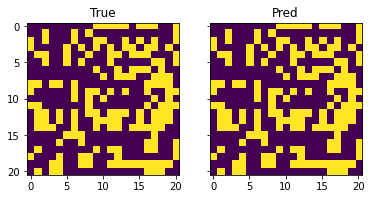

In [ ]:
y_pred = model.predict(np.array(X_test)[None, ..., None])
fig, axes = plt.subplots(1,2, sharey=True)

axes[0].set_title('True')
axes[0].imshow(y_test)

axes[1].set_title('Pred')
axes[1].imshow(
    np.argmax(
        y_pred\
        .reshape(
            X_test.shape[0] * X_test.shape[1], 2
            ), axis=1
        )\
        .reshape(X_test.shape[0], X_test.shape[1]))

plt.show()

### no extra, sgd

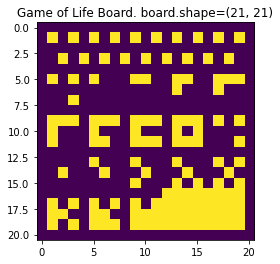

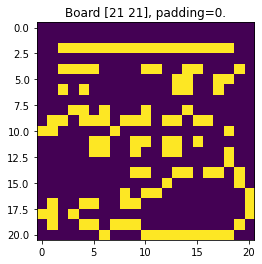

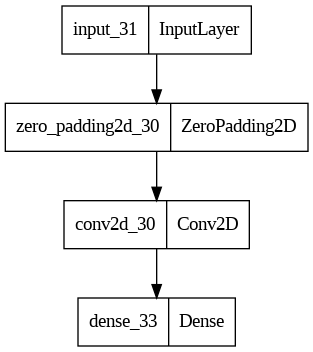

In [ ]:
X_train = load_board(sheet_name='Training_Board', show=True)
y_train = play(X_train, padding=0, show=True)
input_shape = (X_train.shape[0], X_train.shape[1], 1)

conv2d_weights = [np.array([
    [[[0, 1]], [[0, 1]], [[0, 1]]],
    [[[0, 1]], [[1, 0]], [[0, 1]]],
    [[[0, 1]], [[0, 1]], [[0, 1]]]
    ])]

input_layer = tf.keras.layers.Input(shape=input_shape)
zero_padding_layer = tf.keras.layers.ZeroPadding2D()(input_layer)

conv2d = tf.keras.layers.Conv2D(
    filters=2,
    kernel_size=(3, 3),
    use_bias=False,
    weights=conv2d_weights,
    trainable=False,
    activation='sigmoid'
    )(zero_padding_layer)

output_layer = tf.keras.layers.Dense(
    2,
    activation='sigmoid'
    )(conv2d )

model = tf.keras.models.Model(inputs=input_layer, outputs=output_layer)

sgd = tf.keras.optimizers.SGD(
    learning_rate=7,
    momentum=0.0,
    nesterov=False,
    amsgrad=False,
    weight_decay=None,
    clipnorm=None,
    clipvalue=None,
    global_clipnorm=None,
    use_ema=False,
    ema_momentum=0.99,
    ema_overwrite_frequency=None,
    jit_compile=True,
    name="SGD"
)
model.compile(optimizer=sgd, loss='mse')
tf.keras.utils.plot_model(model)

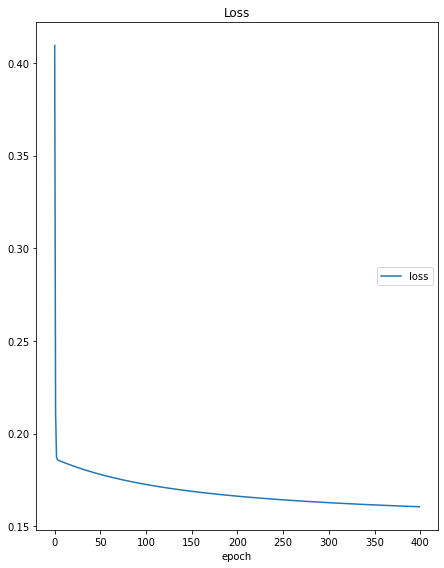

Loss
	loss             	 (min:    0.161, max:    0.409, cur:    0.161)
1/1 [==============================] - 1s 573ms/step - loss: 0.1606


In [ ]:
X_train_ready = np.array(X_train)[None, ..., None]
y_train_ready = tf.keras.utils.to_categorical(
    ProperReshape(
        [y_train.shape[0], y_train.shape[1], 1])(y_train))[None, ...]

model.fit(
    X_train_ready,
    y_train_ready,
    epochs=400,
    verbose=True,
    callbacks=PlotLossesKeras()
)

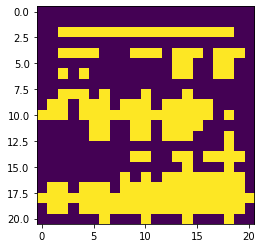

In [ ]:
plt.imshow(model(np.array(X_train)[None, ..., None]).numpy().reshape(441, 2).argmax(axis=1).reshape(21, 21))

1/1 [==============================] - 0s 109ms/step


ValueError: ignored

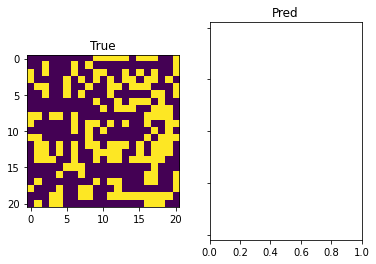

In [ ]:
y_pred = model.predict(np.array(X_test)[None, ..., None])
fig, axes = plt.subplots(1,2, sharey=True)

axes[0].set_title('True')
axes[0].imshow(y_test)

axes[1].set_title('Pred')
axes[1].imshow(
    np.argmax(
        y_pred\
        .reshape(
            X_test.shape[0] * X_test.shape[1], 2
            ), axis=1
        )\
        .reshape(X_test.shape[0], X_test.shape[1]))

plt.show()

## pixel single number output

### extra dense layer

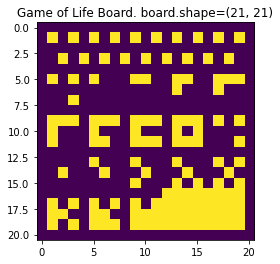

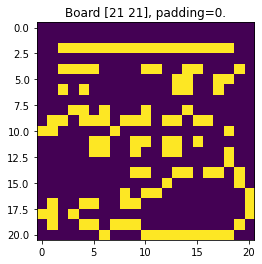

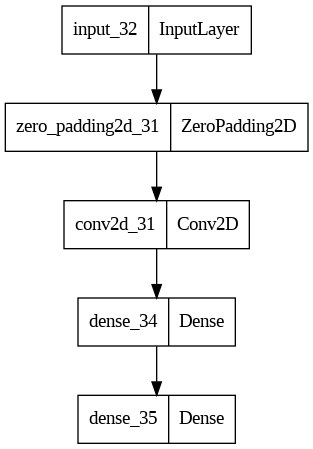

In [ ]:
conv2d_weights = [np.array([
    [[[0, 1]], [[0, 1]], [[0, 1]]],
    [[[0, 1]], [[1, 0]], [[0, 1]]],
    [[[0, 1]], [[0, 1]], [[0, 1]]]
    ])]

X_train = load_board(sheet_name='Training_Board', show=True)
y_train = play(X_train, padding=0, show=True)
input_shape = (X_train.shape[0], X_train.shape[1], 1)

input_layer = tf.keras.layers.Input(shape=input_shape)
zero_padding_layer = tf.keras.layers.ZeroPadding2D()(input_layer)

conv2d = tf.keras.layers.Conv2D(
    filters=2,
    kernel_size=(3, 3),
    use_bias=False,
    weights=conv2d_weights,
    trainable=False
    )(zero_padding_layer)

dense_layer = tf.keras.layers.Dense(
    32,
    activation='sigmoid'
    )(conv2d)

output_layer = tf.keras.layers.Dense(
    1,
    activation='sigmoid'
    )(dense_layer)

model = tf.keras.models.Model(inputs=input_layer, outputs=output_layer)

adam = tf.keras.optimizers.Adam(learning_rate=0.001)
model.compile(optimizer=adam, loss='mse')
tf.keras.utils.plot_model(model)

In [ ]:
X_train_ready = np.array(X_train)[None, ..., None]
y_train_ready = ProperReshape(
        [y_train.shape[0], y_train.shape[1], 1])(y_train)[None, ...]

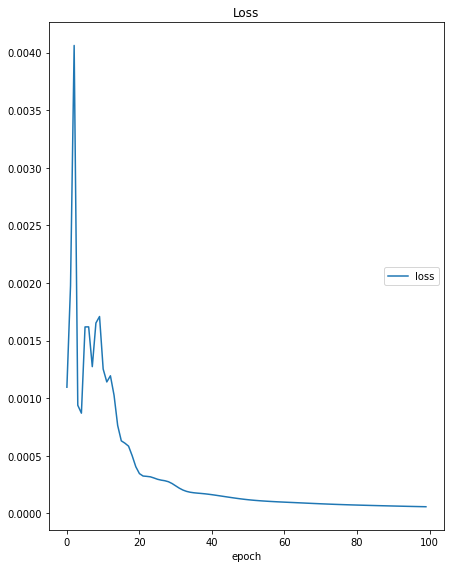

Loss
	loss             	 (min:    0.000, max:    0.004, cur:    0.000)
1/1 [==============================] - 0s 353ms/step - loss: 5.7317e-05


In [ ]:
adam = tf.keras.optimizers.Adam(learning_rate=0.1)
model.compile(optimizer=adam, loss='mse')
model.fit(
    X_train_ready,
    y_train_ready,
    epochs=100,
    verbose=True,
    callbacks=PlotLossesKeras()
)

1/1 [==============================] - 0s 67ms/step


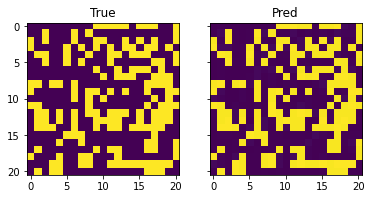

In [ ]:
y_pred = model.predict(np.array(X_test)[None, ..., None])
fig, axes = plt.subplots(1,2, sharey=True)

axes[0].set_title('True')
axes[0].imshow(y_test)

axes[1].set_title('Pred')
axes[1].imshow(
    y_pred.reshape(X_test.shape[0], X_test.shape[1]))

plt.show()

### no extra

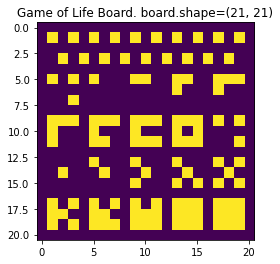

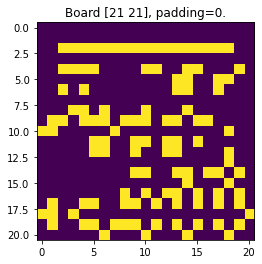

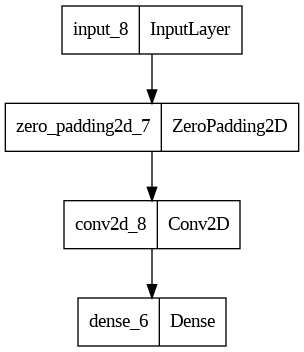

In [ ]:
conv2d_weights = [np.array([
    [[[0, 1]], [[0, 1]], [[0, 1]]],
    [[[0, 1]], [[1, 0]], [[0, 1]]],
    [[[0, 1]], [[0, 1]], [[0, 1]]]
    ])]

X_train = load_board(sheet_name='Training_Board', show=True)
y_train = play(X_train, padding=0, show=True)
input_shape = (X_train.shape[0], X_train.shape[1], 1)

input_layer = tf.keras.layers.Input(shape=input_shape)
zero_padding_layer = tf.keras.layers.ZeroPadding2D()(input_layer)

conv2d = tf.keras.layers.Conv2D(
    filters=2,
    kernel_size=(3, 3),
    use_bias=False,
    weights=conv2d_weights,
    trainable=False
    )(zero_padding_layer)

# output_layer = tf.keras.layers.Conv2D(
#     filters=2,
#     kernel_size=(2, 1),
#     padding='same',
#     activation='sigmoid'
#     )(conv2d)

output_layer = tf.keras.layers.Dense(
    1,
    activation='sigmoid'
    )(conv2d)

model = tf.keras.models.Model(inputs=input_layer, outputs=output_layer)

adam = tf.keras.optimizers.Adam(learning_rate=0.001)
model.compile(optimizer=adam, loss='mse')
tf.keras.utils.plot_model(model)

In [ ]:
X_train_ready = np.array(X_train)[None, ..., None]
y_train_ready = ProperReshape(
        [y_train.shape[0], y_train.shape[1], 1])(y_train)[None, ...]

In [ ]:
adam = tf.keras.optimizers.Adam(learning_rate=0.1)
model.compile(optimizer=adam, loss='mse')
model.fit(
    X_train_ready,
    y_train_ready,
    epochs=1000,
    verbose=True
)

Epoch 1/1000
1/1 [==============================] - 1s 863ms/step - loss: 0.1783
Epoch 2/1000
1/1 [==============================] - 0s 14ms/step - loss: 0.1783
Epoch 3/1000
1/1 [==============================] - 0s 15ms/step - loss: 0.1803
Epoch 4/1000
1/1 [==============================] - 0s 21ms/step - loss: 0.1783
Epoch 5/1000
1/1 [==============================] - 0s 10ms/step - loss: 0.1793
Epoch 6/1000
1/1 [==============================] - 0s 10ms/step - loss: 0.1796
Epoch 7/1000
1/1 [==============================] - 0s 14ms/step - loss: 0.1788
Epoch 8/1000
1/1 [==============================] - 0s 12ms/step - loss: 0.1783
Epoch 9/1000
1/1 [==============================] - 0s 13ms/step - loss: 0.1787
Epoch 10/1000
1/1 [==============================] - 0s 9ms/step - loss: 0.1791
Epoch 11/1000
1/1 [==============================] - 0s 19ms/step - loss: 0.1789
Epoch 12/1000
1/1 [==============================] - 0s 12ms/step - loss: 0.1785
Epoch 13/1000
1/1 [==================

1/1 [==============================] - 0s 35ms/step


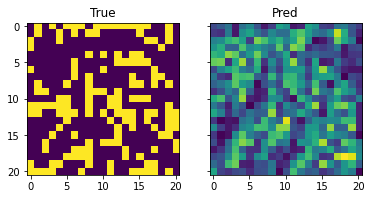

In [ ]:
y_pred = model.predict(np.array(X_test)[None, ..., None])
fig, axes = plt.subplots(1,2, sharey=True)

axes[0].set_title('True')
axes[0].imshow(y_test)

axes[1].set_title('Pred')
axes[1].imshow(
    y_pred.reshape(X_test.shape[0], X_test.shape[1]))

plt.show()

# No Predefined Conv Weights

## categorical output

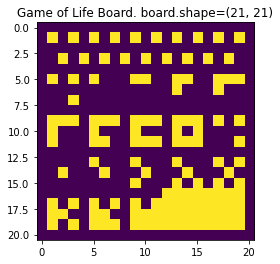

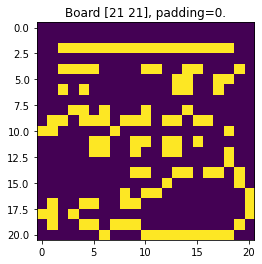

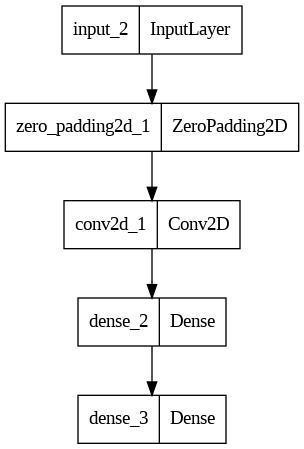

In [ ]:
X_train = load_board(sheet_name='Training_Board', show=True)
y_train = play(X_train, padding=0, show=True)
input_shape = (X_train.shape[0], X_train.shape[1], 1)

input_layer = tf.keras.layers.Input(shape=input_shape)
zero_padding_layer = tf.keras.layers.ZeroPadding2D()(input_layer)

conv2d = tf.keras.layers.Conv2D(
    filters=2,
    kernel_size=(3, 3),
    use_bias=False,
    )(zero_padding_layer)

dense_layer = tf.keras.layers.Dense(
    32,
    activation='sigmoid'
    )(conv2d)
output_layer = tf.keras.layers.Dense(
    2,
    activation='sigmoid'
    )(dense_layer)

model = tf.keras.models.Model(inputs=input_layer, outputs=output_layer)

adam = tf.keras.optimizers.Adam(learning_rate=0.1)
model.compile(optimizer=adam, loss='mse')
tf.keras.utils.plot_model(model)

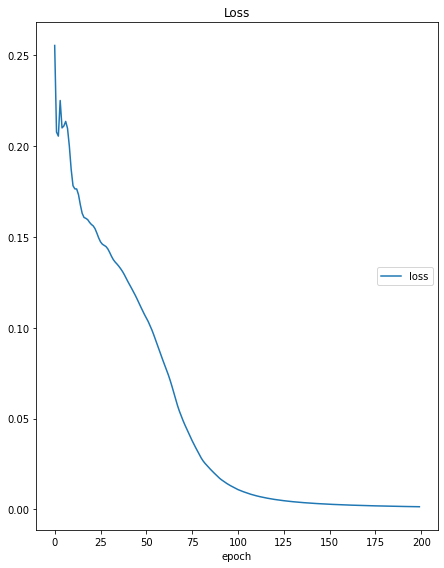

Loss
	loss             	 (min:    0.001, max:    0.255, cur:    0.001)
1/1 [==============================] - 0s 366ms/step - loss: 0.0014


In [ ]:
X_train_ready = np.array(X_train)[None, ..., None]
y_train_ready = tf.keras.utils.to_categorical(
    ProperReshape(
        [y_train.shape[0], y_train.shape[1], 1])(y_train))[None, ...]

model.fit(
    X_train_ready,
    y_train_ready,
    epochs=200,
    verbose=True,
    callbacks=PlotLossesKeras()
)

1/1 [==============================] - 0s 103ms/step


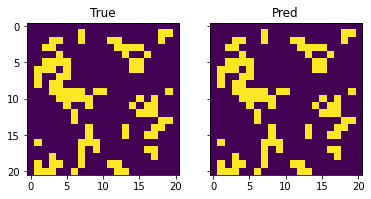

In [ ]:
y_pred = model.predict(np.array(X_test)[None, ..., None])
fig, axes = plt.subplots(1,2, sharey=True)

axes[0].set_title('True')
axes[0].imshow(y_test)

axes[1].set_title('Pred')
axes[1].imshow(
    np.argmax(
        y_pred\
        .reshape(
            X_test.shape[0] * X_test.shape[1], 2
            ), axis=1
        )\
        .reshape(X_test.shape[0], X_test.shape[1]))

plt.show()

## pixel single number output

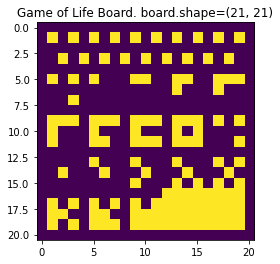

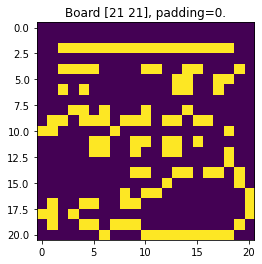

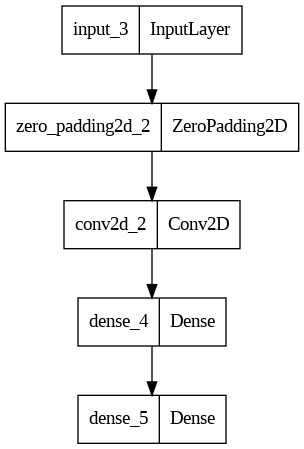

In [ ]:
X_train = load_board(sheet_name='Training_Board', show=True)
y_train = play(X_train, padding=0, show=True)
input_shape = (X_train.shape[0], X_train.shape[1], 1)

input_layer = tf.keras.layers.Input(shape=input_shape)
zero_padding_layer = tf.keras.layers.ZeroPadding2D()(input_layer)

conv2d = tf.keras.layers.Conv2D(
    filters=2,
    kernel_size=(3, 3),
    use_bias=False,
    )(zero_padding_layer)

dense_layer = tf.keras.layers.Dense(
    32,
    activation='sigmoid'
    )(conv2d)

output_layer = tf.keras.layers.Dense(
    1,
    activation='sigmoid'
    )(dense_layer)

model = tf.keras.models.Model(inputs=input_layer, outputs=output_layer)

adam = tf.keras.optimizers.Adam(learning_rate=0.1)
model.compile(optimizer=adam, loss='mse')
tf.keras.utils.plot_model(model)

In [ ]:
X_train_ready = np.array(X_train)[None, ..., None]
y_train_ready = ProperReshape(
        [y_train.shape[0], y_train.shape[1], 1])(y_train)[None, ...]

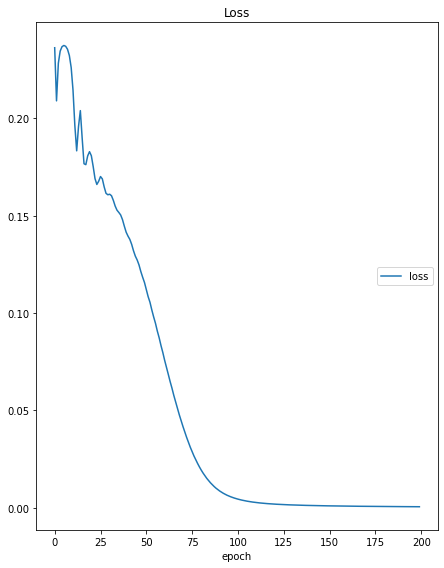

Loss
	loss             	 (min:    0.000, max:    0.237, cur:    0.000)
1/1 [==============================] - 0s 350ms/step - loss: 4.9847e-04


In [ ]:
model.fit(
    X_train_ready,
    y_train_ready,
    epochs=200,
    verbose=True,
    callbacks=PlotLossesKeras()
)

1/1 [==============================] - 0s 101ms/step


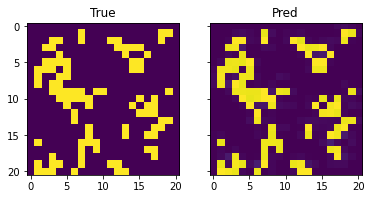

In [ ]:
y_pred = model.predict(np.array(X_test)[None, ..., None])
fig, axes = plt.subplots(1,2, sharey=True)

axes[0].set_title('True')
axes[0].imshow(y_test)

axes[1].set_title('Pred')
axes[1].imshow(
    y_pred.reshape(X_test.shape[0], X_test.shape[1]))

plt.show()

# Categorical Comeback

## main experiment

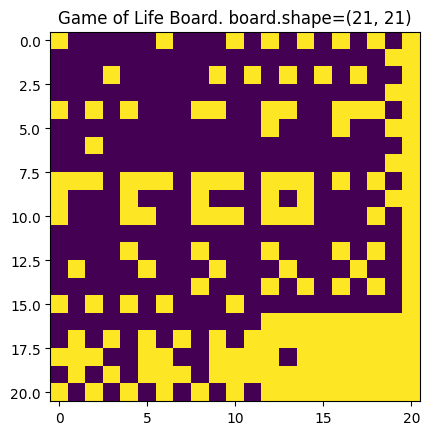

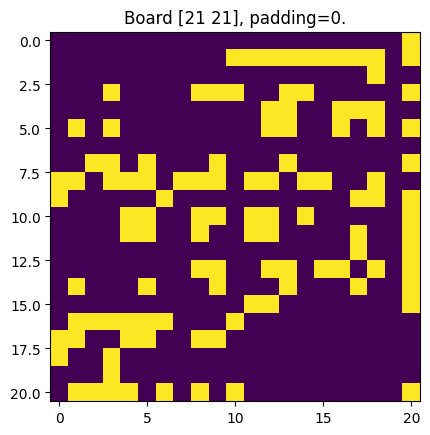

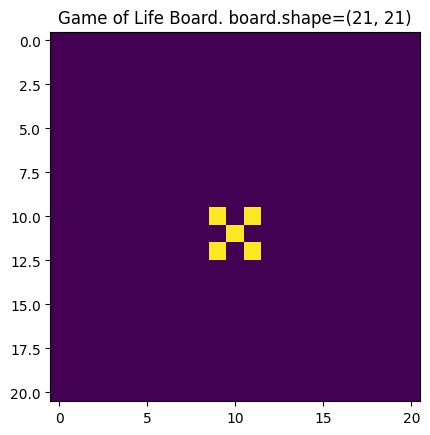

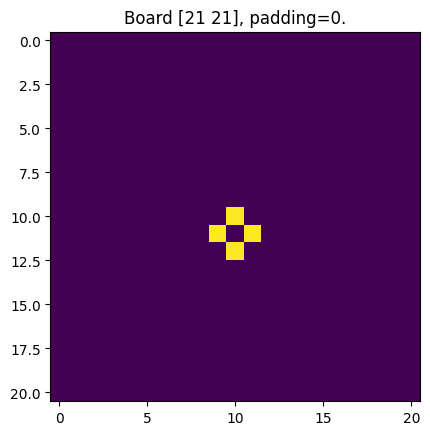

In [ ]:
X_train = load_board(sheet_name='Training_Board', show=True)
y_train = play(X_train, padding=0, show=True)
# X_test = generate_board([X_train.shape[0], X_train.shape[1]], show=True)
X_test = load_board(sheet_name='Test_Board', show=True)
y_test = play(X_test, show=True)

In [ ]:
class NonnegativeUniformInitializer:
    def __init__(self, maxval):
        self.maxval = maxval

    def __call__(self, shape, dtype=None):
        return tf.random.uniform(shape, minval=0, maxval=self.maxval)


class Int(tf.keras.layers.Layer):
    def __init__(self, units=32, input_dim=32):
        super().__init__()

    def call(self, inputs):
        return tf.cast(tf.round(inputs), tf.int32)


class ProperReshape(tf.keras.layers.Reshape):
  
  def compute_output_shape(self, input_shape):
        input_shape = tf.TensorShape(input_shape).as_list()
        if None in input_shape[1:]:
            output_shape = [input_shape[0]]
            output_shape += tuple(
                s if s != -1 else None for s in self.target_shape
            )
        else:
            output_shape = [input_shape[0]]
            output_shape += self._fix_unknown_dimension(
                input_shape[1:], self.target_shape
            )
        return tf.TensorShape(output_shape)[1:]
  
  def call(self, inputs):
        result = tf.reshape(inputs, self.target_shape)
        if not tf.executing_eagerly():
            result.set_shape(self.compute_output_shape(inputs.shape))
        return result

In [ ]:
X_train_ready = np.array(X_train)[None, ..., None]
y_train_ready = tf.keras.utils.to_categorical(
    ProperReshape(
        [y_train.shape[0]*y_train.shape[1], 1])(y_train))[None, ...]

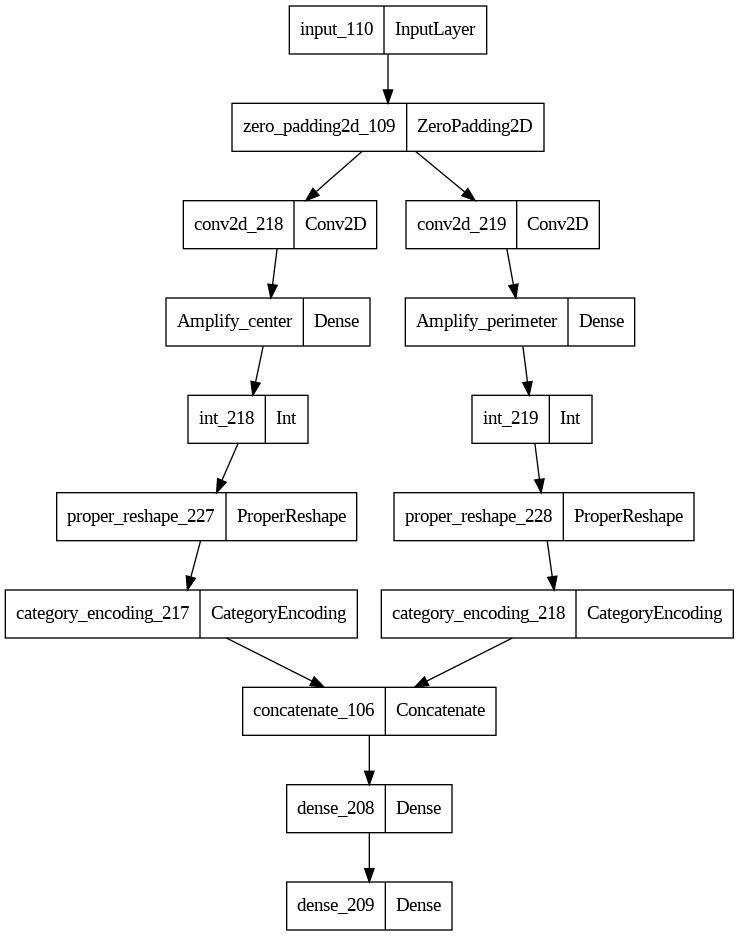

In [ ]:
num_tokens = 10
n_filters = 1
amplify = 100
nu_init = NonnegativeUniformInitializer(maxval=1/amplify)
weights_center = [
    np.array(
    [
        [[[0]],[[0]],[[0]]],
        [[[0]],[[1]],[[0]]],
        [[[0]],[[0]],[[0]]]
    ])
]
weights_center = [weights_center[0] / amplify]

weights_perimeter = [
    np.array(
    [
        [[[1]],[[1]],[[1]]],
        [[[1]],[[0]],[[1]]],
        [[[1]],[[1]],[[1]]]
    ])
]
weights_perimeter = [weights_perimeter[0] / amplify]

# weights = [
#     np.array(
#     [
#         [[[0, 1]],[[0, 1]],[[0, 1]]],
#         [[[0, 1]],[[1, 0]],[[0, 1]]],
#         [[[0, 1]],[[0, 1]],[[0, 1]]]
#     ])
# ]
# weights = [weights[0] / amplify]

input_shape = (X_train.shape[0], X_train.shape[1], 1)

input_layer = tf.keras.layers.Input(shape=input_shape)
zero_padding_layer = tf.keras.layers.ZeroPadding2D()(input_layer)

conv2d_center_layer = tf.keras.layers.Conv2D(
    filters=n_filters,
    kernel_size=(3, 3),
    use_bias=False,
    # weights=weights_center,
    kernel_initializer=nu_init,
    kernel_constraint=tf.keras.constraints.MinMaxNorm(
        min_value=0, max_value=1/amplify),
    trainable=True
    )(zero_padding_layer)
amplifier_center_layer = tf.keras.layers.Dense(
    1,
    kernel_initializer=tf.keras.initializers.Constant(amplify),
    name='Amplify_center',
    trainable=False,
    use_bias=False
)(conv2d_center_layer)
int_center_layer = Int()(amplifier_center_layer)
reshape_center_layer = ProperReshape(
    [X_train.shape[0]*X_train.shape[1], n_filters]
    )(int_center_layer)
cat_center_layer = tf.keras.layers.CategoryEncoding(
    num_tokens=num_tokens, output_mode='multi_hot')(reshape_center_layer)


conv2d_perimeter_layer = tf.keras.layers.Conv2D(
    filters=n_filters,
    kernel_size=(3, 3),
    use_bias=False,
    # weights=weights_perimeter,
    kernel_initializer=nu_init,
    kernel_constraint=tf.keras.constraints.MinMaxNorm(
        min_value=0, max_value=1/amplify),
    trainable=True
    )(zero_padding_layer)
amplifier_perimeter_layer = tf.keras.layers.Dense(
    1,
    kernel_initializer=tf.keras.initializers.Constant(amplify),
    name='Amplify_perimeter',
    trainable=False,
    use_bias=False
)(conv2d_perimeter_layer)
int_perimeter_layer = Int()(amplifier_perimeter_layer)
reshape_perimeter_layer = ProperReshape(
    [X_train.shape[0]*X_train.shape[1], n_filters]
    )(int_perimeter_layer)
cat_perimeter_layer = tf.keras.layers.CategoryEncoding(
    num_tokens=num_tokens, output_mode='multi_hot')(reshape_perimeter_layer)


concat_layer = tf.keras.layers.Concatenate(axis=1)(
    [
      cat_center_layer,
      cat_perimeter_layer
    ]
)

dense_layer = tf.keras.layers.Dense(
    32,
    activation='sigmoid',
    use_bias=True
    )(concat_layer)

output_layer = tf.keras.layers.Dense(
    2,
    activation='sigmoid',
    use_bias=True
    )(dense_layer)

model = tf.keras.models.Model(inputs=input_layer, outputs=output_layer)

adam = tf.keras.optimizers.Adam(learning_rate=0.001)
model.compile(optimizer=adam, loss='mse')
tf.keras.utils.plot_model(model)

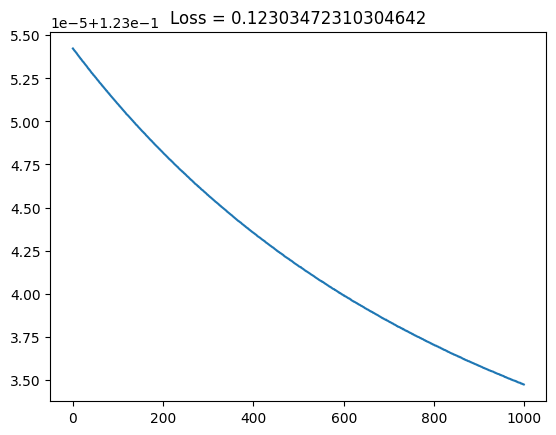

In [ ]:
history = model.fit(
    X_train_ready,
    y_train_ready,
    epochs=1000,
    batch_size=1,
    verbose=False,
    #callbacks=PlotLossesKeras()
)

losses = history.history['loss']
plt.title(f'Loss = {losses[-1]}')
plt.plot(losses)

In [ ]:
model.weights

[<tf.Variable 'conv2d_214/kernel:0' shape=(3, 3, 1, 1) dtype=float32, numpy=
 array([[[[0.00388386]],
 
         [[0.0073606 ]],
 
         [[0.0038633 ]]],
 
 
        [[[0.00399361]],
 
         [[0.00379593]],
 
         [[0.00829985]]],
 
 
        [[[0.0097493 ]],
 
         [[0.00973139]],
 
         [[0.00245503]]]], dtype=float32)>,
 <tf.Variable 'conv2d_215/kernel:0' shape=(3, 3, 1, 1) dtype=float32, numpy=
 array([[[[0.00389736]],
 
         [[0.00443601]],
 
         [[0.00306212]]],
 
 
        [[[0.00909838]],
 
         [[0.00458683]],
 
         [[0.00141791]]],
 
 
        [[[0.00451106]],
 
         [[0.00854705]],
 
         [[0.00754194]]]], dtype=float32)>,
 <tf.Variable 'Amplify_center/kernel:0' shape=(1, 1) dtype=float32, numpy=array([[100.]], dtype=float32)>,
 <tf.Variable 'Amplify_perimeter/kernel:0' shape=(1, 1) dtype=float32, numpy=array([[100.]], dtype=float32)>,
 <tf.Variable 'dense_204/kernel:0' shape=(20, 32) dtype=float32, numpy=
 array([[-2.85989618e+00,

1/1 [==============================] - 0s 258ms/step


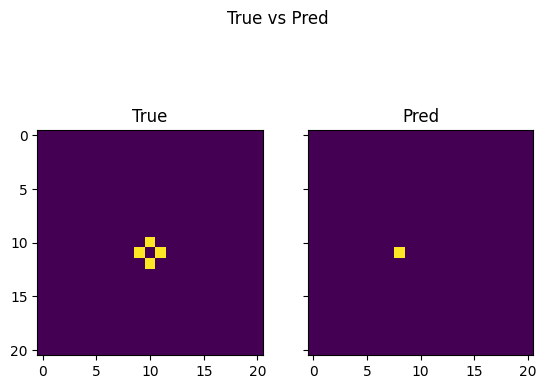

In [ ]:
y_pred = model.predict(np.array(X_test)[None, ..., None])
fig, axes = plt.subplots(1,2, sharey=True)

axes[0].set_title('True')
axes[0].imshow(y_test)

axes[1].set_title('Pred')
axes[1].imshow(
    np.argmax(
        y_pred\
        .reshape(
            X_test.shape[0] * X_test.shape[1], 2
            ), axis=1
        )\
        .reshape(X_test.shape[0], X_test.shape[1]))
plt.suptitle('True vs Pred')
plt.show()

## No visible fork (simplified)



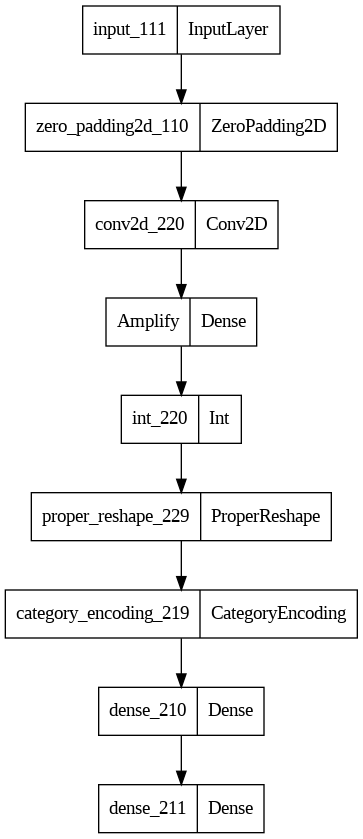

In [ ]:
num_tokens = 10
n_filters = 2
amplify = 1
nu_init = NonnegativeUniformInitializer(maxval=1/amplify)

input_shape = (X_train.shape[0], X_train.shape[1], 1)

input_layer = tf.keras.layers.Input(shape=input_shape)
zero_padding_layer = tf.keras.layers.ZeroPadding2D()(input_layer)

conv2d_layer = tf.keras.layers.Conv2D(
    filters=n_filters,
    kernel_size=(3, 3),
    use_bias=False,
    kernel_initializer=nu_init,
    kernel_constraint=tf.keras.constraints.MinMaxNorm(
        min_value=0, max_value=1/amplify),
    trainable=True
    )(zero_padding_layer)
amplifier_layer = tf.keras.layers.Dense(
    1,
    kernel_initializer=tf.keras.initializers.Constant(amplify),
    name='Amplify',
    trainable=False,
    use_bias=False
)(conv2d_layer)
int_layer = Int()(amplifier_layer)
reshape_layer = ProperReshape(
    [X_train.shape[0]*X_train.shape[1], 1]
    )(int_layer)
cat_layer = tf.keras.layers.CategoryEncoding(
    num_tokens=num_tokens, output_mode='multi_hot')(reshape_layer)

dense_layer = tf.keras.layers.Dense(
    32,
    activation='sigmoid',
    use_bias=True
    )(cat_layer)

output_layer = tf.keras.layers.Dense(
    2,
    activation='sigmoid',
    use_bias=True
    )(dense_layer)

model = tf.keras.models.Model(inputs=input_layer, outputs=output_layer)

adam = tf.keras.optimizers.Adam(learning_rate=0.1)
model.compile(optimizer=adam, loss='mse')
tf.keras.utils.plot_model(model)

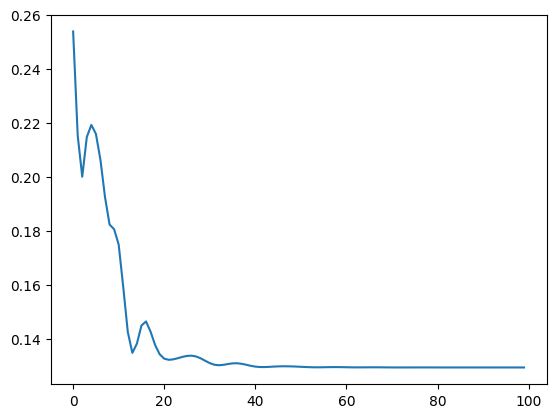

In [ ]:
X_train_ready = np.array(X_train)[None, ..., None]
y_train_ready = tf.keras.utils.to_categorical(
    ProperReshape(
        [y_train.shape[0]*y_train.shape[1], 1])(y_train))[None, ...]

history = model.fit(
    X_train_ready,
    y_train_ready,
    epochs=100,
    batch_size=1,
    verbose=False,
    #callbacks=PlotLossesKeras()
)

plt.plot(history.history['loss'])

1/1 [==============================] - 0s 227ms/step


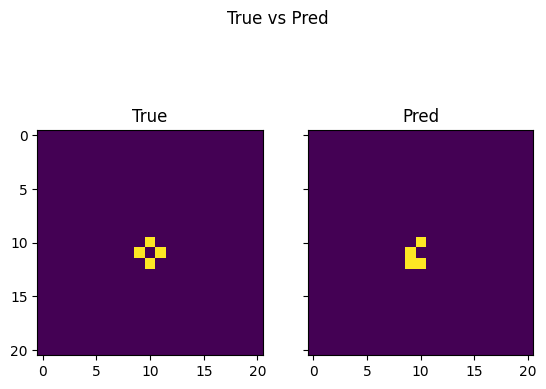

In [ ]:
y_pred = model.predict(np.array(X_test)[None, ..., None])
fig, axes = plt.subplots(1,2, sharey=True)

axes[0].set_title('True')
axes[0].imshow(y_test)

axes[1].set_title('Pred')
axes[1].imshow(
    np.argmax(
        y_pred\
        .reshape(
            X_test.shape[0] * X_test.shape[1], 2
            ), axis=1
        )\
        .reshape(X_test.shape[0], X_test.shape[1]))
plt.suptitle('True vs Pred')
plt.show()

In [ ]:
# @title conv instead of dense
num_tokens = 10

input_shape = (X_train.shape[0], X_train.shape[1], 1)

input_layer = tf.keras.layers.Input(shape=input_shape)
zero_padding_layer = tf.keras.layers.ZeroPadding2D()(input_layer)

conv2d_center_layer = tf.keras.layers.Conv2D(
    filters=1,
    kernel_size=(3, 3),
    use_bias=False,
    #weights=weights_center,
    kernel_initializer=tf.keras.initializers.Zeros(),
    kernel_constraint=tf.keras.constraints.MinMaxNorm(min_value=0, max_value=1),
    trainable=True
    )(zero_padding_layer)
int_center_layer = Int()(conv2d_center_layer)
reshape_center_layer = ProperReshape(
    [X_train.shape[0]*X_train.shape[1], 1]
    )(int_center_layer)
cat_center_layer = tf.keras.layers.CategoryEncoding(
    num_tokens=num_tokens, output_mode='multi_hot')(reshape_center_layer)


conv2d_perimeter_layer = tf.keras.layers.Conv2D(
    filters=1,
    kernel_size=(3, 3),
    use_bias=False,
    #weights=weights_perimeter,
    kernel_initializer=tf.keras.initializers.Zeros(),
    kernel_constraint=tf.keras.constraints.MinMaxNorm(min_value=0, max_value=1),
    trainable=True
    )(zero_padding_layer)
int_perimeter_layer = Int()(conv2d_perimeter_layer)
reshape_perimeter_layer = ProperReshape(
    [X_train.shape[0]*X_train.shape[1], 1]
    )(int_perimeter_layer)
cat_perimeter_layer = tf.keras.layers.CategoryEncoding(
    num_tokens=num_tokens, output_mode='multi_hot')(reshape_perimeter_layer)


concat_layer = tf.keras.layers.Concatenate(axis=1)(
    [
      cat_center_layer,
      cat_perimeter_layer
    ]
)

reshape_concat_layer = ProperReshape(
    [20, X_train.shape[0]*X_train.shape[1]]
    )(concat_layer)

output_layer = tf.keras.layers.Conv2D(
    filters=1,
    kernel_size=(2, 1),
    activation='sigmoid',
    )(reshape_concat_layer)

model = tf.keras.models.Model(inputs=input_layer, outputs=output_layer)

adam = tf.keras.optimizers.Adam(learning_rate=0.1)
model.compile(optimizer=adam, loss='mse')
tf.keras.utils.plot_model(model)

In [ ]:
random_uniform_initializer([3,3], dtype=None)

<tf.Tensor: shape=(3, 3), dtype=float32, numpy=
array([[0.42496908, 0.21321285, 0.11413181],
       [0.0062294 , 0.77689624, 0.59784055],
       [0.40349245, 0.9673929 , 0.20152366]], dtype=float32)>

In [ ]:
tf.keras.layers.experimental.preprocessing.CategoryEncoding(3)([[0.1], [0.3], [0.2]])

<tf.Tensor: shape=(3, 3), dtype=float32, numpy=
array([[1., 0., 0.],
       [1., 0., 0.],
       [1., 0., 0.]], dtype=float32)>

In [ ]:
tf.keras.layers.CategoryEncoding(3)([[0.1], [0.3], [0.2]])

<tf.Tensor: shape=(3, 3), dtype=float32, numpy=
array([[1., 0., 0.],
       [1., 0., 0.],
       [1., 0., 0.]], dtype=float32)>

In [ ]:
tf.keras.layers.CategoryEncoding(3)([[0], [2], [1]])

<tf.Tensor: shape=(3, 3), dtype=float32, numpy=
array([[1., 0., 0.],
       [0., 0., 1.],
       [0., 1., 0.]], dtype=float32)>

In [ ]:
discretization_layer = tf.keras.layers.Discretization(num_bins=3)
discretization_layer.adapt([[0.1], [103], [10]])
discretization_layer([[0.1], [0.3], [0.2]])

<tf.Tensor: shape=(3, 1), dtype=int64, numpy=
array([[1],
       [1],
       [1]])>

In [ ]:
input = np.array([[-1.5, 1.0, 3.4, .5], [0.0, 3.0, 1.3, 0.0]])
layer = tf.keras.layers.Discretization(num_bins=4, epsilon=0.01)
#layer.adapt(input)
layer(input)

<tf.Tensor: shape=(2, 4), dtype=int64, numpy=
array([[0, 0, 0, 0],
       [0, 0, 0, 0]])>

# Dense instead of categorical

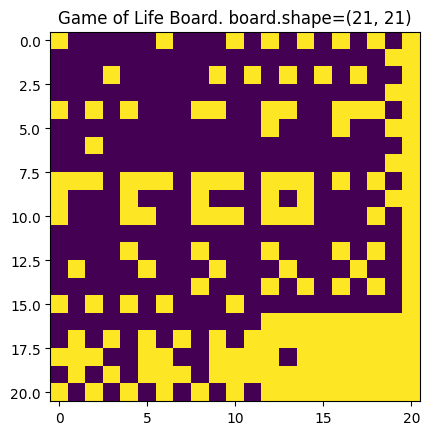

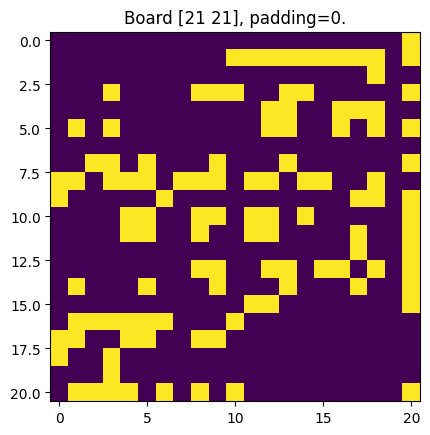

In [ ]:
X_train = load_board(sheet_name='Training_Board', show=True)
y_train = play(X_train, padding=0, show=True)

In [ ]:
X_train_ready = np.array(X_train)[None, ..., None]
y_train_ready = tf.keras.utils.to_categorical(
    ProperReshape(
        [y_train.shape[0]*y_train.shape[1], 1])(y_train))[None, ...]

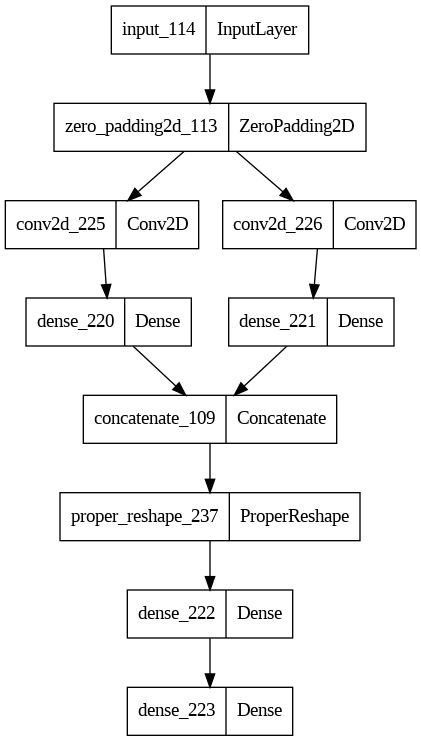

In [ ]:
n_filters = 1
# X_train = np.array(
#     [
#         [0, 1, 0],
#         [1, 1, 0],
#         [0, 0, 0],
#     ]
# )
input_shape = (X_train.shape[0], X_train.shape[1], 1)
weights_center = [
    np.array(
    [
        [[[0]],[[0]],[[0]]],
        [[[0]],[[1]],[[0]]],
        [[[0]],[[0]],[[0]]]
    ])
]
weights_perimeter = [
    np.array(
    [
        [[[1]],[[1]],[[1]]],
        [[[1]],[[0]],[[1]]],
        [[[1]],[[1]],[[1]]]
    ])
]

input_layer = tf.keras.layers.Input(shape=input_shape)
zero_padding_layer = tf.keras.layers.ZeroPadding2D()(input_layer)

conv2d_center_layer = tf.keras.layers.Conv2D(
    filters=n_filters,
    kernel_size=(3, 3),
    use_bias=False,
    weights=weights_center,
    trainable=False
    )(zero_padding_layer)
dense_center_layer = tf.keras.layers.Dense(
    9,
    #activation='relu',
    kernel_initializer=tf.keras.initializers.Constant(1),
    bias_initializer=tf.keras.initializers.Constant(0),
    trainable=False
    )(conv2d_center_layer)


conv2d_perimeter_layer = tf.keras.layers.Conv2D(
    filters=n_filters,
    kernel_size=(3, 3),
    use_bias=False,
    weights=weights_perimeter,
    trainable=False
    )(zero_padding_layer)
dense_perimeter_layer = tf.keras.layers.Dense(
    9,
    #activation='relu',
    kernel_initializer=tf.keras.initializers.Constant(1),
    bias_initializer=tf.keras.initializers.Constant(0),
    trainable=False
    )(conv2d_perimeter_layer)


concat_layer = tf.keras.layers.Concatenate(axis=1)(
    [
      dense_center_layer,
      dense_perimeter_layer
    ]
)
reshape_layer_1 = ProperReshape(
    target_shape=(X_train.shape[0], X_train.shape[1], 2, 9))(concat_layer)

dense_layer = tf.keras.layers.Dense(
    9,
    #activation='relu',
    )(reshape_layer_1)

output_layer = tf.keras.layers.Dense(
    2,
    #activation='relu',
    )(dense_layer)

# reshape_layer_2 = ProperReshape(
#     target_shape=(1, X_train.shape[0], X_train.shape[1], 2))(dense_layer)
model = tf.keras.models.Model(inputs=input_layer, outputs=output_layer)

adam = tf.keras.optimizers.Adam(learning_rate=0.01)
model.compile(optimizer=adam, loss='mse')
tf.keras.utils.plot_model(model)

In [ ]:
X_train_ready = np.array(X_train)[None, ..., None]
y_train_ready = tf.keras.utils.to_categorical(
    ProperReshape(
        [y_train.shape[0], y_train.shape[1], 1, 1])(y_train))[None, ...]

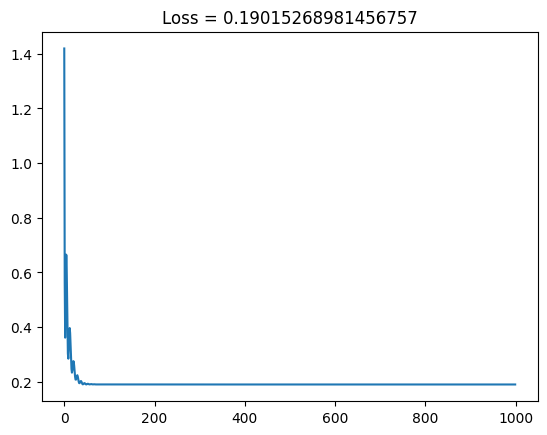

In [ ]:
history = model.fit(
    X_train_ready,
    y_train_ready,
    epochs=1000,
    batch_size=1,
    verbose=False,
    #callbacks=PlotLossesKeras()
)

losses = history.history['loss']
plt.title(f'Loss = {losses[-1]}')
plt.plot(losses)

# Oldschool (again)

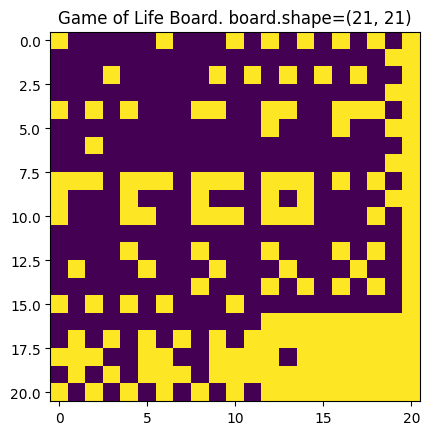

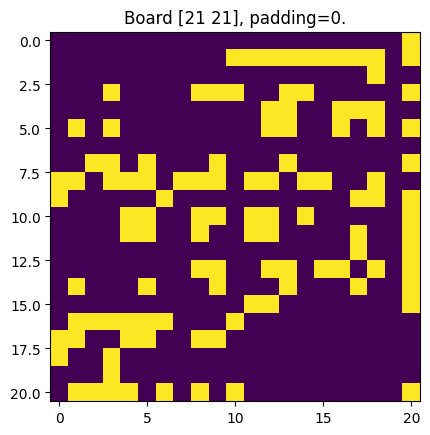

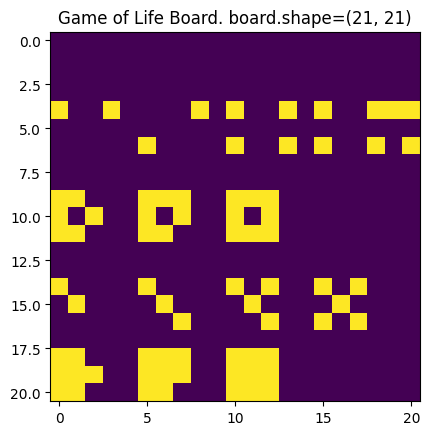

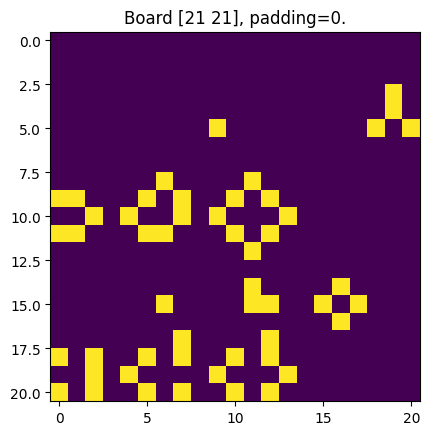

In [ ]:
X_train = load_board(sheet_name='Training_Board', show=True)
y_train = play(X_train, padding=0, show=True)
# X_test = generate_board([X_train.shape[0], X_train.shape[1]], show=True)
X_test = load_board(sheet_name='Test_Board', show=True)
y_test = play(X_test, show=True)

In [ ]:
class ProperReshape(tf.keras.layers.Reshape):
  
  def compute_output_shape(self, input_shape):
        input_shape = tf.TensorShape(input_shape).as_list()
        if None in input_shape[1:]:
            output_shape = [input_shape[0]]
            output_shape += tuple(
                s if s != -1 else None for s in self.target_shape
            )
        else:
            output_shape = [input_shape[0]]
            output_shape += self._fix_unknown_dimension(
                input_shape[1:], self.target_shape
            )
        return tf.TensorShape(output_shape)[1:]
  
  def call(self, inputs):
        result = tf.reshape(inputs, self.target_shape)
        if not tf.executing_eagerly():
            result.set_shape(self.compute_output_shape(inputs.shape))
        return result

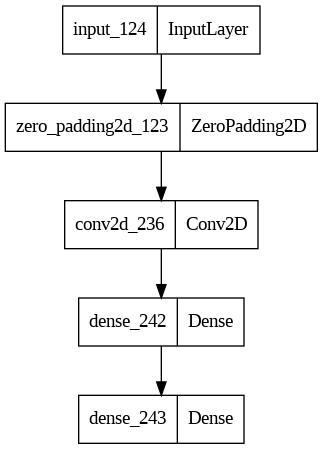

In [ ]:
n_filters = 128
input_shape = (X_train.shape[0], X_train.shape[1], 1)

input_layer = tf.keras.layers.Input(shape=input_shape)
zero_padding_layer = tf.keras.layers.ZeroPadding2D()(input_layer)

conv2d_layer = tf.keras.layers.Conv2D(
    filters=n_filters,
    kernel_size=(3, 3),
    )(zero_padding_layer)

dense_layer = tf.keras.layers.Dense(
    256,
    activation='sigmoid',
    use_bias=True
    )(conv2d_layer)

output_layer = tf.keras.layers.Dense(
    1,
    activation='sigmoid',
    use_bias=True
    )(dense_layer)

model = tf.keras.models.Model(inputs=input_layer, outputs=output_layer)

adam = tf.keras.optimizers.Adam(learning_rate=0.01)
model.compile(optimizer=adam, loss='mse')
tf.keras.utils.plot_model(model)

In [ ]:
X_train_ready = np.array(X_train)[None, ..., None]
y_train_ready = ProperReshape(
        [y_train.shape[0], y_train.shape[1], 1]
        )(y_train)[None, ...]

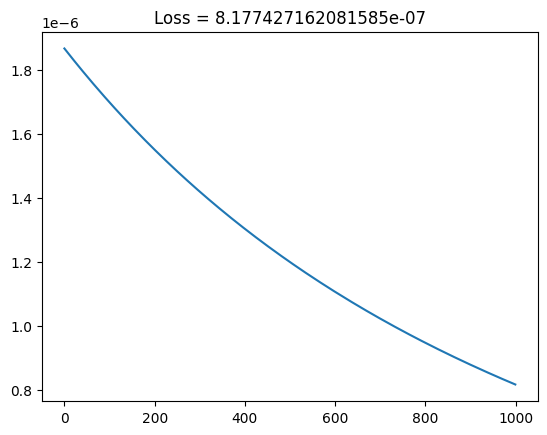

In [ ]:
history = model.fit(
    X_train_ready,
    y_train_ready,
    epochs=1000,
    batch_size=1,
    verbose=False,
    #callbacks=PlotLossesKeras()
)

losses = history.history['loss']
plt.title(f'Loss = {losses[-1]}')
plt.plot(losses)

1/1 [==============================] - 0s 29ms/step


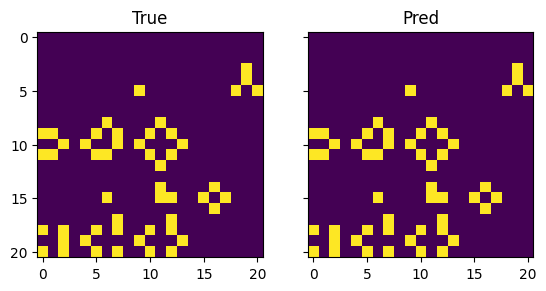

In [ ]:
y_pred = model.predict(np.array(X_test)[None, ..., None])
fig, axes = plt.subplots(1,2, sharey=True)

axes[0].set_title('True')
axes[0].imshow(y_test)

axes[1].set_title('Pred')
axes[1].imshow(
    y_pred.reshape(X_test.shape[0], X_test.shape[1]))

plt.show()

## Distributing Dense layer removed

In [ ]:
# @title amplifier experiments
n_filters = 2
loss_dict = {}
for amplify in [10**i for i in range(7)]:
  loss_dict[amplify] = 0
  print('\nAmplifier:', amplify)
  for attempt in range(1):
    print('.', end='')
    input_shape = (X_train.shape[0], X_train.shape[1], 1)

    input_layer = tf.keras.layers.Input(shape=input_shape)
    zero_padding_layer = tf.keras.layers.ZeroPadding2D()(input_layer)

    conv2d_layer = tf.keras.layers.Conv2D(
        filters=n_filters,
        kernel_size=(3, 3),
        activation='sigmoid',
        )(zero_padding_layer)

    amplifier_layer = tf.keras.layers.Dense(
        1,
        kernel_initializer=tf.keras.initializers.Constant(amplify),
        name='Amplify',
        trainable=False,
        use_bias=False
    )(conv2d_layer)

    output_layer = tf.keras.layers.Dense(
        1,
        activation='sigmoid',
        use_bias=True
        )(amplifier_layer)

    model = tf.keras.models.Model(inputs=input_layer, outputs=output_layer)

    adam = tf.keras.optimizers.Adam(learning_rate=0.1)
    model.compile(optimizer=adam, loss='mse')
    tf.keras.utils.plot_model(model)

    history = model.fit(
    X_train_ready,
    y_train_ready,
    epochs=3000,
    batch_size=1,
    verbose=False,
    #callbacks=PlotLossesKeras()
    )
    loss = history.history['loss'][-1]
    loss_dict[amplify] += loss


Amplifier: 1
.
Amplifier: 10
.
Amplifier: 100
.
Amplifier: 1000
.
Amplifier: 10000
.
Amplifier: 100000
.
Amplifier: 1000000
.

In [ ]:
loss_dict

{1: 0.12730996310710907,
 10: 3.184556135238381e-06,
 100: 0.25623583793640137,
 1000: 0.7437641620635986,
 10000: 0.25623583793640137,
 100000: 0.25623583793640137,
 1000000: 0.7437641620635986}

In [ ]:
loss_dict

{1: 10.704768113791943, 10: 9.868079833686352}

In [ ]:
loss_dict

{1: 5.457493223249912,
 10: 5.120707131922245,
 100: 13.79610924422741,
 1000: 15.512471675872803,
 10000: 16.975056648254395,
 100000: 16.487528324127197,
 1000000: 15.512471675872803}

## No amplifier

### Bare minimum

In [ ]:
class ProperReshape(tf.keras.layers.Reshape):
  
  def compute_output_shape(self, input_shape):
        input_shape = tf.TensorShape(input_shape).as_list()
        if None in input_shape[1:]:
            output_shape = [input_shape[0]]
            output_shape += tuple(
                s if s != -1 else None for s in self.target_shape
            )
        else:
            output_shape = [input_shape[0]]
            output_shape += self._fix_unknown_dimension(
                input_shape[1:], self.target_shape
            )
        return tf.TensorShape(output_shape)[1:]
  
  def call(self, inputs):
        result = tf.reshape(inputs, self.target_shape)
        if not tf.executing_eagerly():
            result.set_shape(self.compute_output_shape(inputs.shape))
        return result

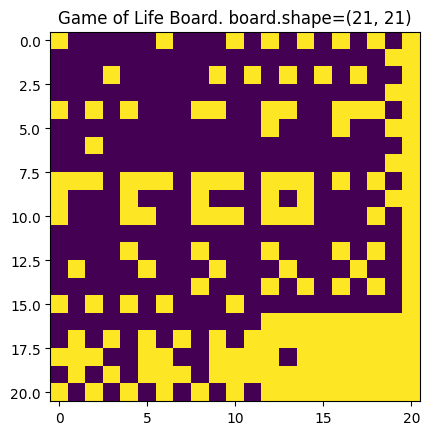

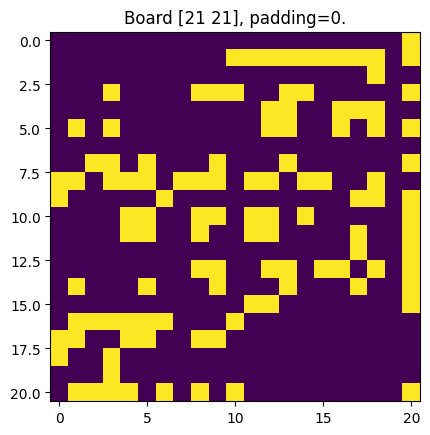

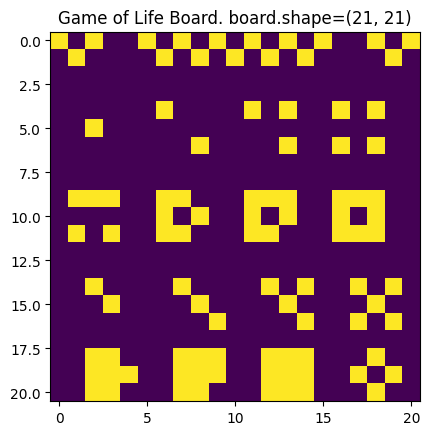

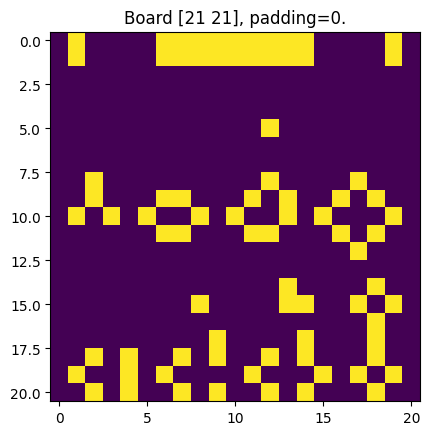

In [ ]:
X_train = load_board(sheet_name='Training_Board', show=True)
y_train = play(X_train, padding=0, show=True)
# X_test = generate_board([X_train.shape[0], X_train.shape[1]], show=True)
X_test = load_board(sheet_name='Test_Board', show=True)
y_test = play(X_test, show=True)

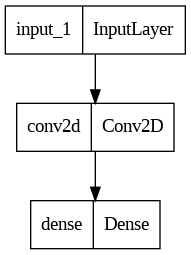

In [ ]:
n_filters = 2
input_shape = (X_train.shape[0], X_train.shape[1], 1)

input_layer = tf.keras.layers.Input(shape=input_shape)
zero_padding_layer = tf.keras.layers.ZeroPadding2D()(input_layer)

conv2d_layer = tf.keras.layers.Conv2D(
    filters=n_filters,
    kernel_size=(3, 3),
    activation='sigmoid',
    padding='same'
    )(input_layer)

output_layer = tf.keras.layers.Dense(
    1,
    activation='sigmoid',
    use_bias=True
    )(conv2d_layer)

model = tf.keras.models.Model(inputs=input_layer, outputs=output_layer)

adam = tf.keras.optimizers.Adam(learning_rate=0.025)
model.compile(optimizer=adam, loss='mse')
tf.keras.utils.plot_model(model)

In [ ]:
X_train_ready = np.array(X_train)[None, ..., None]
y_train_ready = ProperReshape(
        [y_train.shape[0], y_train.shape[1], 1]
        )(y_train)[None, ...]

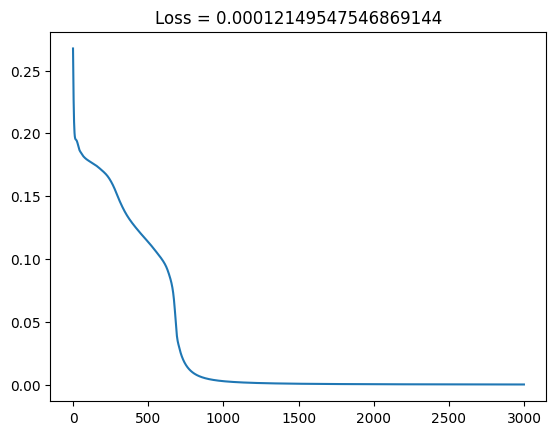

In [ ]:
history = model.fit(
    X_train_ready,
    y_train_ready,
    epochs=3000,
    batch_size=1,
    verbose=False,
    #callbacks=PlotLossesKeras()
)

losses = history.history['loss']
plt.title(f'Loss = {losses[-1]}')
plt.plot(losses)

1/1 [==============================] - 0s 83ms/step


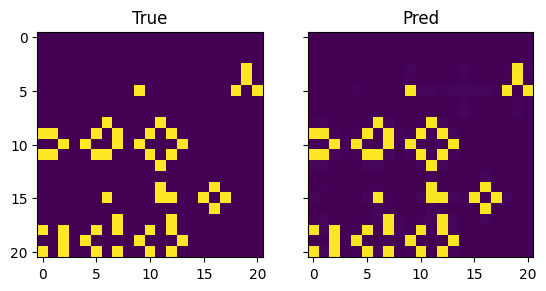

In [ ]:
y_pred = model.predict(np.array(X_test)[None, ..., None])
fig, axes = plt.subplots(1,2, sharey=True)

axes[0].set_title('True')
axes[0].imshow(y_test)

axes[1].set_title('Pred')
axes[1].imshow(
    y_pred.reshape(X_test.shape[0], X_test.shape[1]))

plt.show()

### Extra dense layer (again)

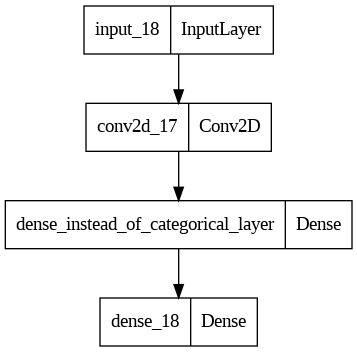

In [ ]:
n_filters = 2
kernel_size = (3, 3)
n_categories = kernel_size[0] * kernel_size[1] * n_filters
input_shape = (X_train.shape[0], X_train.shape[1], 1)

input_layer = tf.keras.layers.Input(shape=input_shape)
zero_padding_layer = tf.keras.layers.ZeroPadding2D()(input_layer)

conv2d_layer = tf.keras.layers.Conv2D(
    filters=n_filters,
    kernel_size=kernel_size,
    activation='sigmoid',
    padding='same'
    )(input_layer)

dense_instead_of_categorical_layer = tf.keras.layers.Dense(
    n_categories,
    activation='sigmoid',
    name='dense_instead_of_categorical_layer'
    )(conv2d_layer)

output_layer = tf.keras.layers.Dense(
    1,
    activation='sigmoid',
    use_bias=True
    )(dense_instead_of_categorical_layer)

model = tf.keras.models.Model(inputs=input_layer, outputs=output_layer)

adam = tf.keras.optimizers.Adam(learning_rate=0.025)
model.compile(optimizer=adam, loss='mse')
tf.keras.utils.plot_model(model)

In [ ]:
X_train_ready = np.array(X_train)[None, ..., None]
y_train_ready = ProperReshape(
        [y_train.shape[0], y_train.shape[1], 1]
        )(y_train)[None, ...]

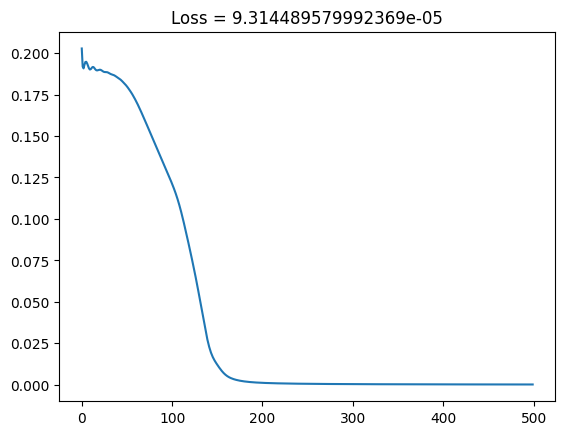

In [ ]:
history = model.fit(
    X_train_ready,
    y_train_ready,
    epochs=500,
    batch_size=1,
    verbose=False,
    #callbacks=PlotLossesKeras()
)

losses = history.history['loss']
plt.title(f'Loss = {losses[-1]}')
plt.plot(losses)

1/1 [==============================] - 0s 122ms/step


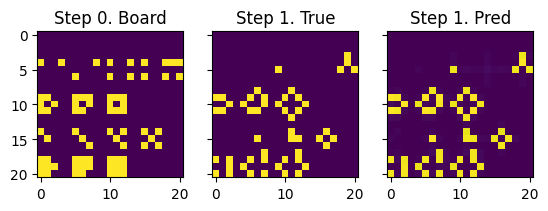

In [ ]:
y_pred = model.predict(np.array(X_test)[None, ..., None])
fig, axes = plt.subplots(1,3, sharey=True)

axes[0].set_title('Step 0. Board')
axes[0].imshow(X_test)

axes[1].set_title('Step 1. True')
axes[1].imshow(y_test)

axes[2].set_title('Step 1. Pred')
axes[2].imshow(
    y_pred.reshape(X_test.shape[0], X_test.shape[1]))

plt.show()

### RMSprop

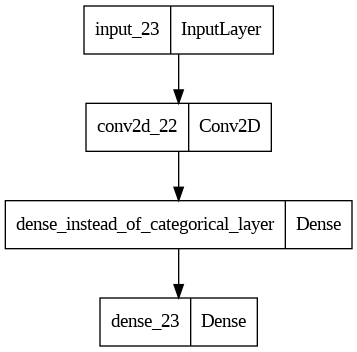

In [ ]:
n_filters = 2
kernel_size = (3, 3)
n_categories = kernel_size[0] * kernel_size[1] * n_filters
input_shape = (X_train.shape[0], X_train.shape[1], 1)

input_layer = tf.keras.layers.Input(shape=input_shape)
zero_padding_layer = tf.keras.layers.ZeroPadding2D()(input_layer)

conv2d_layer = tf.keras.layers.Conv2D(
    filters=n_filters,
    kernel_size=kernel_size,
    activation='sigmoid',
    padding='same'
    )(input_layer)

dense_instead_of_categorical_layer = tf.keras.layers.Dense(
    n_categories,
    activation='sigmoid',
    name='dense_instead_of_categorical_layer'
    )(conv2d_layer)

output_layer = tf.keras.layers.Dense(
    1,
    activation='sigmoid',
    use_bias=True
    )(dense_instead_of_categorical_layer)

model = tf.keras.models.Model(inputs=input_layer, outputs=output_layer)

rmsprop = tf.keras.optimizers.RMSprop(learning_rate=0.1)
model.compile(optimizer=rmsprop, loss='mse')
tf.keras.utils.plot_model(model)

In [ ]:
X_train_ready = np.array(X_train)[None, ..., None]
y_train_ready = ProperReshape(
        [y_train.shape[0], y_train.shape[1], 1]
        )(y_train)[None, ...]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

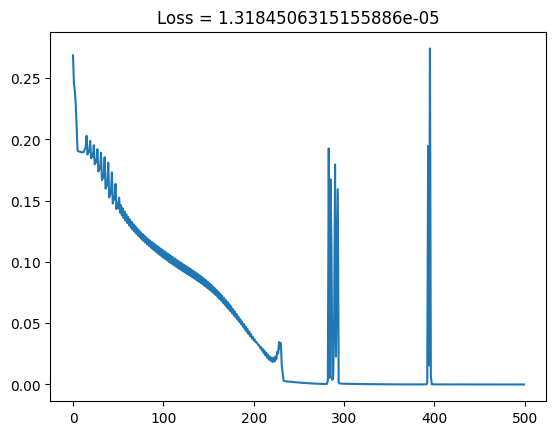

In [ ]:
history = model.fit(
    X_train_ready,
    y_train_ready,
    epochs=500,
    batch_size=1,
    verbose=False,
    callbacks=[TqdmCallback(verbose=True)]
)

losses = history.history['loss']
plt.title(f'Loss = {losses[-1]}')
plt.plot(losses)

1/1 [==============================] - 0s 106ms/step


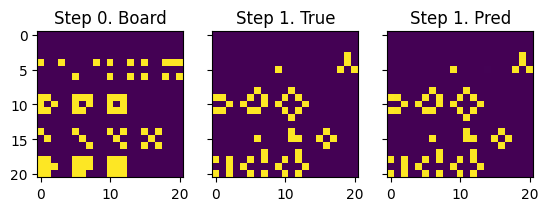

In [ ]:
y_pred = model.predict(np.array(X_test)[None, ..., None])
fig, axes = plt.subplots(1,3, sharey=True)

axes[0].set_title('Step 0. Board')
axes[0].imshow(X_test)

axes[1].set_title('Step 1. True')
axes[1].imshow(y_test)

axes[2].set_title('Step 1. Pred')
axes[2].imshow(
    y_pred.reshape(X_test.shape[0], X_test.shape[1]))

plt.show()

### Huber loss

In [ ]:
from keras.losses import Huber

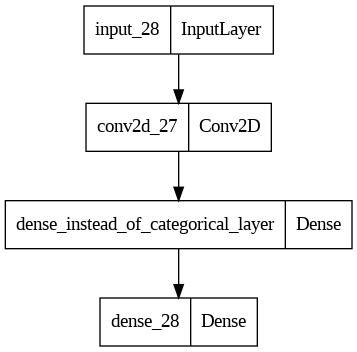

In [ ]:
n_filters = 2
kernel_size = (3, 3)
n_categories = kernel_size[0] * kernel_size[1] * n_filters
input_shape = (X_train.shape[0], X_train.shape[1], 1)

input_layer = tf.keras.layers.Input(shape=input_shape)
zero_padding_layer = tf.keras.layers.ZeroPadding2D()(input_layer)

conv2d_layer = tf.keras.layers.Conv2D(
    filters=n_filters,
    kernel_size=kernel_size,
    activation='sigmoid',
    padding='same'
    )(input_layer)

dense_instead_of_categorical_layer = tf.keras.layers.Dense(
    n_categories,
    activation='sigmoid',
    name='dense_instead_of_categorical_layer'
    )(conv2d_layer)

output_layer = tf.keras.layers.Dense(
    1,
    activation='sigmoid',
    use_bias=True
    )(dense_instead_of_categorical_layer)

model = tf.keras.models.Model(inputs=input_layer, outputs=output_layer)

rmsprop = tf.keras.optimizers.RMSprop(learning_rate=0.1)
model.compile(optimizer=rmsprop, loss=Huber())
tf.keras.utils.plot_model(model)

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

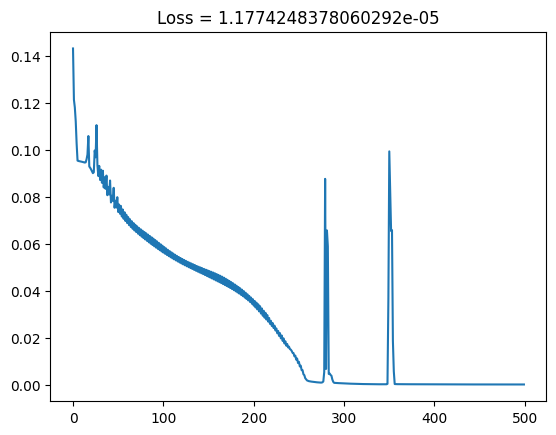

In [ ]:
history = model.fit(
    X_train_ready,
    y_train_ready,
    epochs=500,
    batch_size=1,
    verbose=False,
    callbacks=[TqdmCallback(verbose=True)]
)

losses = history.history['loss']
plt.title(f'Loss = {losses[-1]}')
plt.plot(losses)

### Extra dense layer + Extra filters

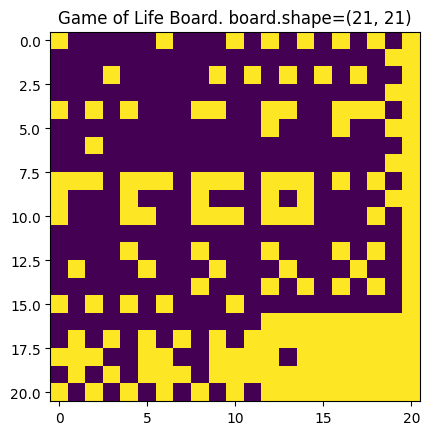

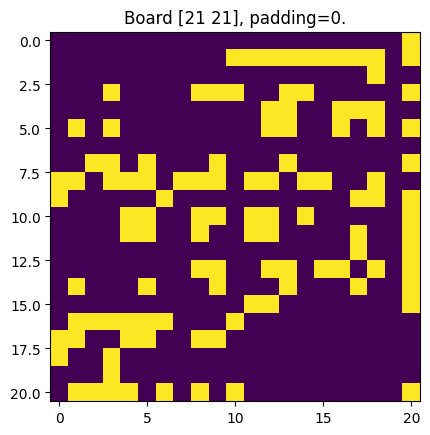

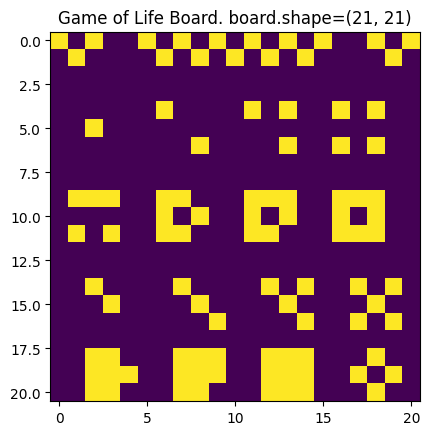

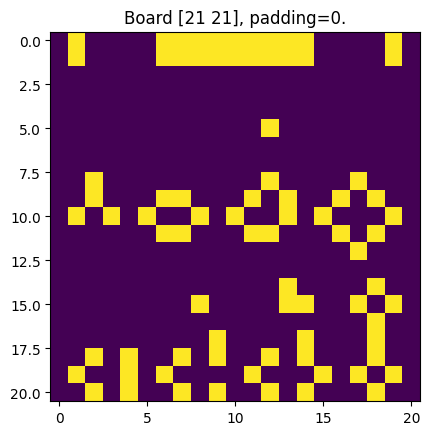

In [ ]:
X_train = load_board(sheet_name='Training_Board', show=True)
y_train = play(X_train, padding=0, show=True)
# X_test = generate_board([X_train.shape[0], X_train.shape[1]], show=True)
X_test = load_board(sheet_name='Test_Board', show=True)
y_test = play(X_test, show=True)

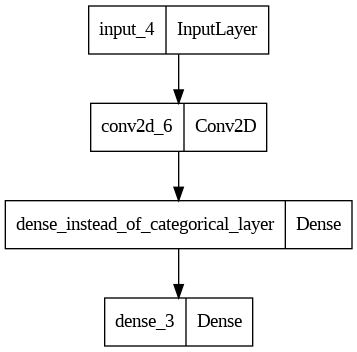

In [ ]:
n_filters = 8
kernel_size = (3, 3)
n_categories = kernel_size[0] * kernel_size[1] * n_filters
input_shape = (X_train.shape[0], X_train.shape[1], 1)

input_layer = tf.keras.layers.Input(shape=input_shape)
zero_padding_layer = tf.keras.layers.ZeroPadding2D()(input_layer)

conv2d_layer = tf.keras.layers.Conv2D(
    filters=n_filters,
    kernel_size=kernel_size,
    activation='sigmoid',
    padding='same'
    )(input_layer)

dense_instead_of_categorical_layer = tf.keras.layers.Dense(
    n_categories,
    activation='sigmoid',
    name='dense_instead_of_categorical_layer'
    )(conv2d_layer)

output_layer = tf.keras.layers.Dense(
    1,
    activation='sigmoid',
    use_bias=True
    )(dense_instead_of_categorical_layer)#(conv2d_layer)

model = tf.keras.models.Model(inputs=input_layer, outputs=output_layer)

rmsprop = tf.keras.optimizers.RMSprop(learning_rate=0.025)
adam = tf.keras.optimizers.Adam(learning_rate=0.025)
model.compile(optimizer=adam, loss='mse')
tf.keras.utils.plot_model(model)

In [ ]:
X_train_ready = np.array(X_train)[None, ..., None]
y_train_ready = np.array(y_train)[None, ...]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

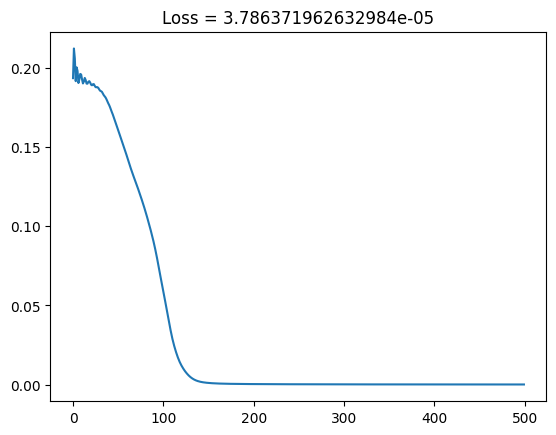

In [ ]:
history = model.fit(
    X_train_ready,
    y_train_ready,
    epochs=500,
    batch_size=1,
    verbose=False,
    callbacks=[TqdmCallback(verbose=True)]
)

losses = history.history['loss']
plt.title(f'Loss = {losses[-1]}')
plt.plot(losses)

1/1 [==============================] - 0s 119ms/step


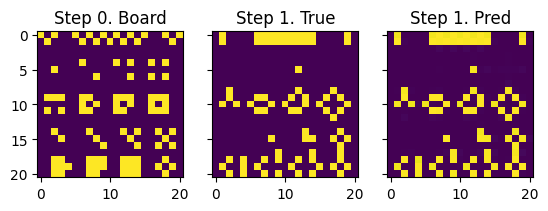

In [ ]:
y_pred = model.predict(np.array(X_test)[None, ..., None])
fig, axes = plt.subplots(1,3, sharey=True)

axes[0].set_title('Step 0. Board')
axes[0].imshow(X_test)

axes[1].set_title('Step 1. True')
axes[1].imshow(y_test)

axes[2].set_title('Step 1. Pred')
axes[2].imshow(
    y_pred.reshape(X_test.shape[0], X_test.shape[1]))

plt.show()

reshape_layer = ProperReshape(list(X_train.shape) + [1])(input_layer)

## (New Training Board Test) Extra dense layer + Extra filters

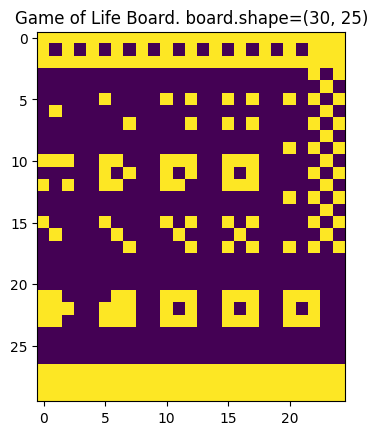

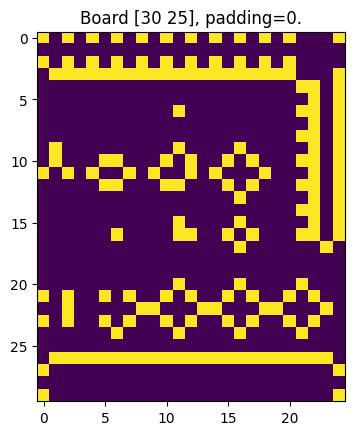

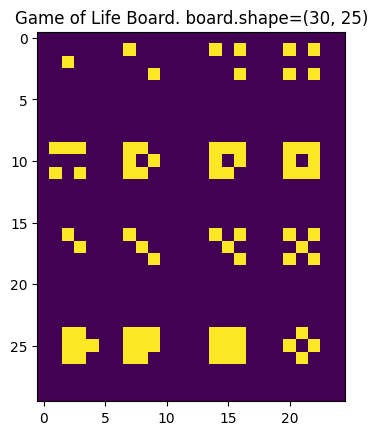

In [ ]:
# X_train = load_board(sheet_name='Training_Board', show=True)
# y_train = play(X_train, padding=0, show=True)
# X_test = load_board(sheet_name='Test_Board', show=True)
# y_test = play(X_test, show=False)
X_train = load_board(sheet_name='Training_Board2', show=True)
y_train = play(X_train, padding=0, show=True)
X_test = load_board(sheet_name='Test_Board2', show=True)
y_test = play(X_test, show=False)

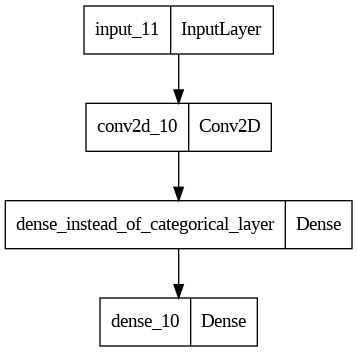

In [ ]:
n_filters = 8
kernel_size = (3, 3)
n_categories = kernel_size[0] * kernel_size[1] * n_filters
input_shape = (X_train.shape[0], X_train.shape[1], 1)

input_layer = tf.keras.layers.Input(shape=input_shape)
zero_padding_layer = tf.keras.layers.ZeroPadding2D()(input_layer)

conv2d_layer = tf.keras.layers.Conv2D(
    filters=n_filters,
    kernel_size=kernel_size,
    activation='sigmoid',
    padding='same'
    )(input_layer)

dense_instead_of_categorical_layer = tf.keras.layers.Dense(
    n_categories,
    activation='sigmoid',
    name='dense_instead_of_categorical_layer'
    )(conv2d_layer)

output_layer = tf.keras.layers.Dense(
    1,
    activation='sigmoid',
    use_bias=True
    )(dense_instead_of_categorical_layer)#(conv2d_layer)

model = tf.keras.models.Model(inputs=input_layer, outputs=output_layer)

rmsprop = tf.keras.optimizers.RMSprop(learning_rate=0.025)
adam = tf.keras.optimizers.Adam(learning_rate=0.025)
model.compile(optimizer=adam, loss='mse')
tf.keras.utils.plot_model(model)

In [ ]:
X_train_ready = np.array(X_train)[None, ..., None]
y_train_ready = np.array(y_train)[None, ...]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

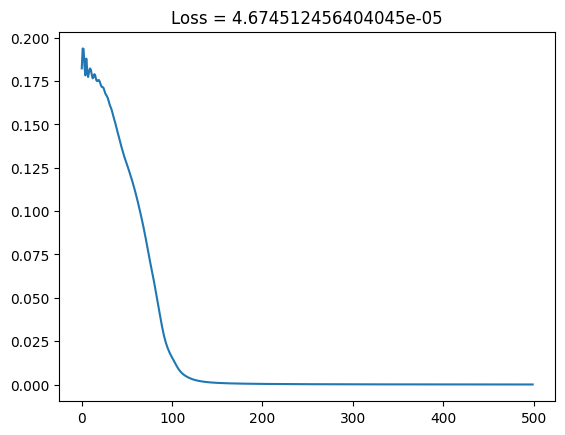

In [ ]:
history = model.fit(
    X_train_ready,
    y_train_ready,
    epochs=500,
    batch_size=1,
    verbose=False,
    callbacks=[TqdmCallback(verbose=True)]
)

losses = history.history['loss']
plt.title(f'Loss = {losses[-1]}')
plt.plot(losses)

1/1 [==============================] - 0s 312ms/step


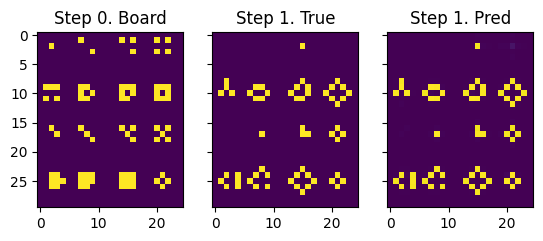

In [ ]:
y_pred = model.predict(np.array(X_test)[None, ..., None])
fig, axes = plt.subplots(1,3, sharey=True)

axes[0].set_title('Step 0. Board')
axes[0].imshow(X_test)

axes[1].set_title('Step 1. True')
axes[1].imshow(y_test)

axes[2].set_title('Step 1. Pred')
axes[2].imshow(
    y_pred.reshape(X_test.shape[0], X_test.shape[1]))

plt.show()

# ~~Use model after conv layer~~

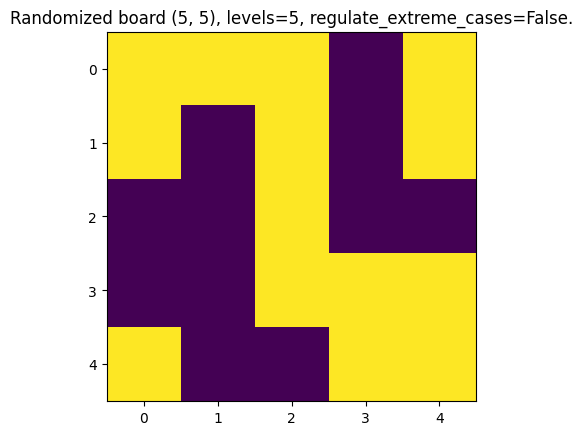

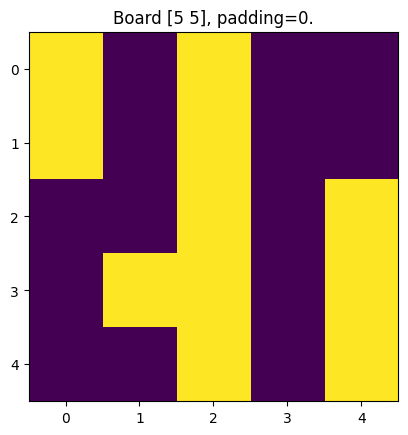

In [ ]:
board5x5 = generate_board((5, 5), show=True)
true5x5 = play(board5x5, show=True)

In [ ]:
n_samples = 10000
X_train = np.array([generate_board((5,5)) for i in range(n_samples)])
y_train = np.array([play(i) for i in X_train])

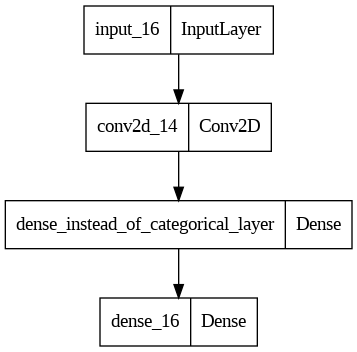

In [ ]:
n_filters = 8
kernel_size = (3, 3)
n_categories = kernel_size[0] * kernel_size[1] * n_filters
input_shape = (5, 5, 1)

input_layer = tf.keras.layers.Input(shape=input_shape)

conv2d_layer = tf.keras.layers.Conv2D(
    filters=n_filters,
    kernel_size=kernel_size,
    activation='sigmoid',
    padding='same'
    )(input_layer)

dense_instead_of_categorical_layer = tf.keras.layers.Dense(
    n_categories,
    activation='sigmoid',
    name='dense_instead_of_categorical_layer'
    )(conv2d_layer)

output_layer = tf.keras.layers.Dense(
    1,
    activation='sigmoid',
    use_bias=True
    )(dense_instead_of_categorical_layer)#(conv2d_layer)

model = tf.keras.models.Model(inputs=input_layer, outputs=output_layer)

rmsprop = tf.keras.optimizers.RMSprop(learning_rate=0.025)
adam = tf.keras.optimizers.Adam(learning_rate=0.025)
model.compile(optimizer=adam, loss='mse')
tf.keras.utils.plot_model(model)

In [ ]:
history = model.fit(
    X_train,
    y_train,
    epochs=500,
    batch_size=1,
    verbose=False,
    callbacks=[TqdmCallback(verbose=True)]
)

losses = history.history['loss']
plt.title(f'Loss = {losses[-1]}')
plt.plot(losses)

In [ ]:
X_train = []
for i in range(2**9):
  b = np.array([int(i) for i in list(bin(i).split('b')[1].zfill(9))])\
  .reshape(3, 3)
  X_train.append(b)
X_train = np.array(X_train)

In [ ]:
sums = []
for b in X_train:
  sums.append(sum(sum(b)))

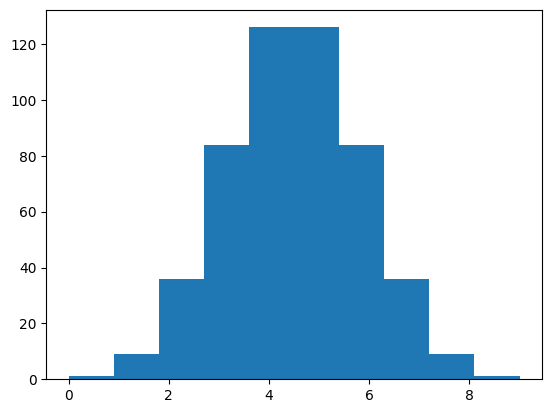

In [ ]:
frequencies = plt.hist(sums)

In [ ]:
frequencies = zip(
    (frequencies[1] + 0.5).round().astype(int), frequencies[0].astype(int))

In [ ]:
list(frequencies)

[(0, 1),
 (1, 9),
 (2, 36),
 (3, 84),
 (4, 126),
 (5, 126),
 (6, 84),
 (7, 36),
 (8, 9),
 (9, 1)]

In [ ]:
frequencies = {key: value for key, value in frequencies}

In [ ]:
frequencies

{0: 1, 1: 9, 2: 36, 3: 84, 4: 126, 5: 126, 6: 84, 7: 36, 8: 9, 9: 1}

In [ ]:
max_freq = max(frequencies.values())
reverse_frequencies = {}
for val, freq in frequencies.items():
  reverse_frequencies[val] = int(round(max_freq/freq))

In [ ]:
X_train_flattened = []
for b in X_train:
  sum_ = sum(sum(b))
  for _ in range(reverse_frequencies[sum_]):
    X_train_flattened.append(b)
X_train_flattened = np.array(X_train_flattened)

(array([126., 126., 144., 168., 126., 126., 168., 144., 126., 126.]),
 array([0. , 0.9, 1.8, 2.7, 3.6, 4.5, 5.4, 6.3, 7.2, 8.1, 9. ]),
 <BarContainer object of 10 artists>)

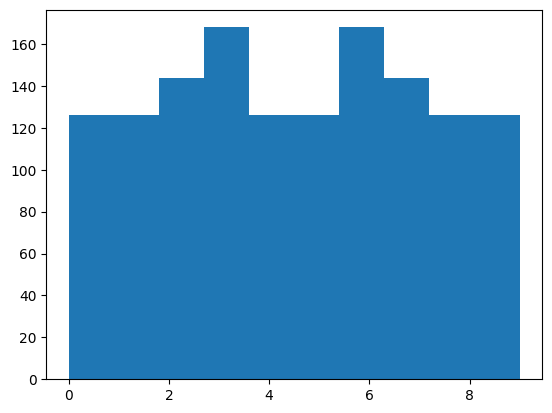

In [ ]:
sums = []
for b in X_train_flattened:
  sums.append(sum(sum(b)))
plt.hist(sums)

In [ ]:
X_train = X_train_flattened
np.random.shuffle(X_train)
y_train = np.array([play(i) for i in X_train])

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

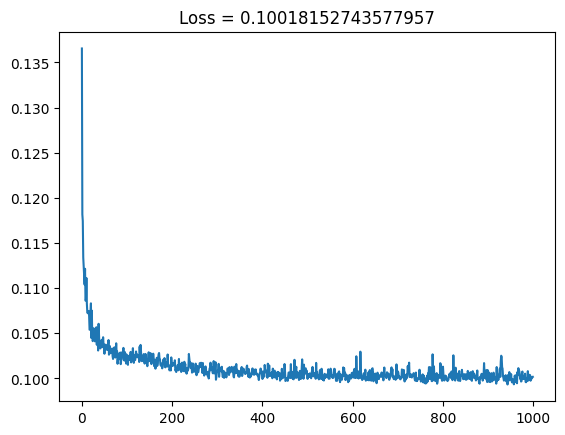

In [ ]:
adam = tf.keras.optimizers.Adam(learning_rate=0.1)
model.compile(optimizer=adam, loss='mse')

history = model.fit(
    X_train,
    y_train,
    epochs=1000,
    # batch_size=1,
    verbose=False,
    callbacks=[TqdmCallback(verbose=True)]
)

losses = history.history['loss']
plt.title(f'Loss = {losses[-1]}')
plt.plot(losses)

In [ ]:
X_test, y_test = X_train, y_train

44/44 [==============================] - 0s 2ms/step


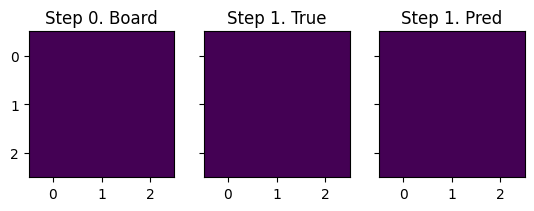

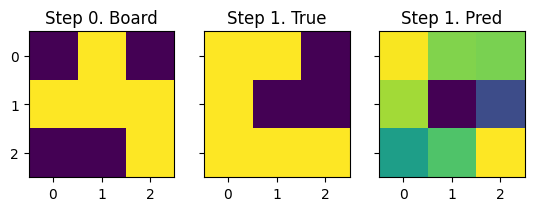

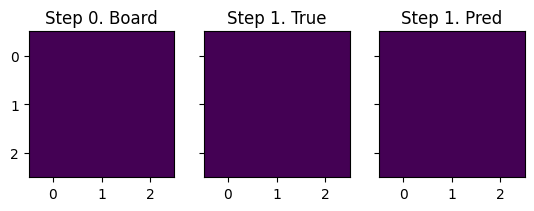

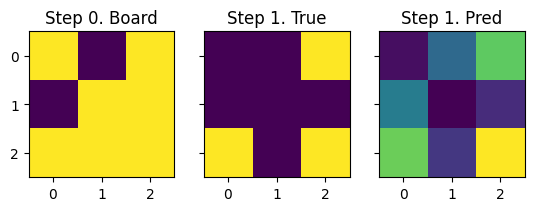

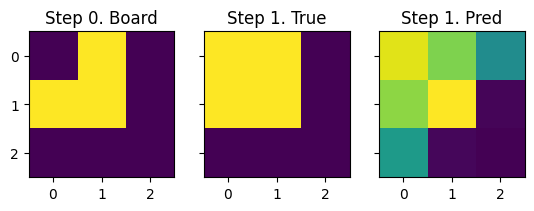

...

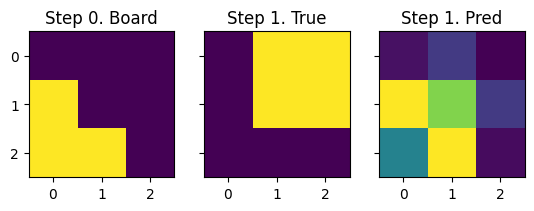

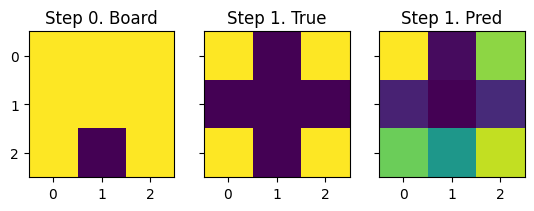

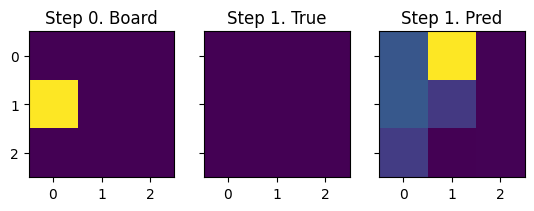

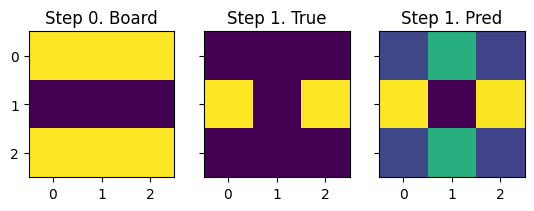

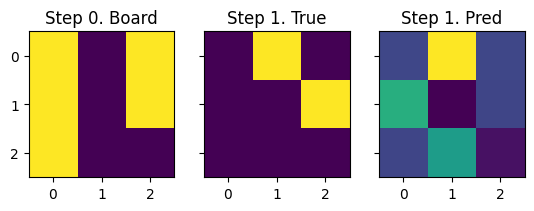

KeyboardInterrupt: ignored

In [ ]:
y_pred = model.predict(X_test)
from_ = 0
up_to = len(y_pred)
for i in range(from_, up_to):
  fig, axes = plt.subplots(1,3, sharey=True)

  axes[0].set_title('Step 0. Board')
  axes[0].imshow(X_test[i])

  axes[1].set_title('Step 1. True')
  axes[1].imshow(y_test[i])

  axes[2].set_title('Step 1. Pred')
  axes[2].imshow(y_pred[i])

  plt.show()

## ~~Try predefined weights~~

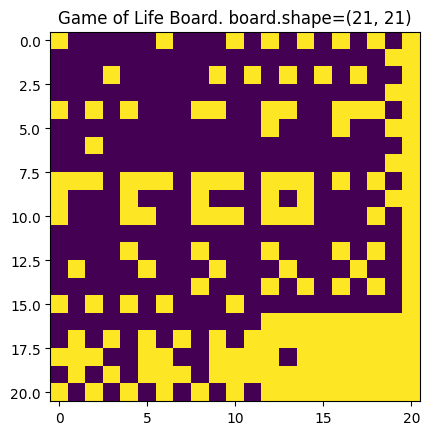

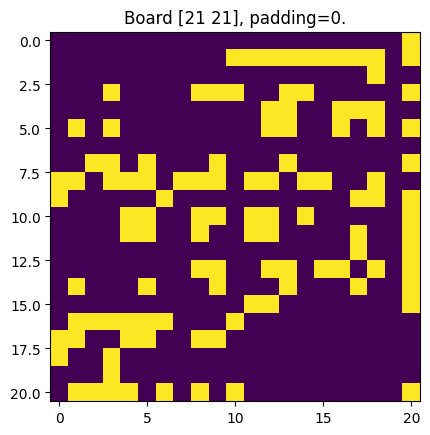

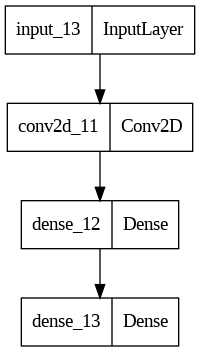

In [ ]:
conv2d_weights = [np.array([
    [[[0, 1]], [[0, 1]], [[0, 1]]],
    [[[0, 1]], [[1, 0]], [[0, 1]]],
    [[[0, 1]], [[0, 1]], [[0, 1]]]
    ])]

X_train = load_board(sheet_name='Training_Board', show=True)
y_train = play(X_train, padding=0, show=True)
input_shape = (X_train.shape[0], X_train.shape[1], 1)

input_layer = tf.keras.layers.Input(shape=input_shape)

conv2d = tf.keras.layers.Conv2D(
    filters=2,
    kernel_size=(3, 3),
    use_bias=False,
    weights=conv2d_weights,
    trainable=False,
    padding='same'
    )(input_layer)

dense_layer = tf.keras.layers.Dense(
    32,
    activation='sigmoid'
    )(conv2d)

output_layer = tf.keras.layers.Dense(
    1,
    activation='sigmoid'
    )(dense_layer)

model = tf.keras.models.Model(inputs=input_layer, outputs=output_layer)

adam = tf.keras.optimizers.Adam(learning_rate=0.001)
model.compile(optimizer=adam, loss='mse')
tf.keras.utils.plot_model(model)

### ~~Redo the shape. Extra dense layer + Extra filters~~

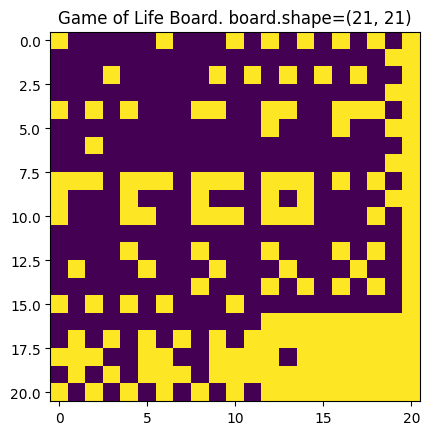

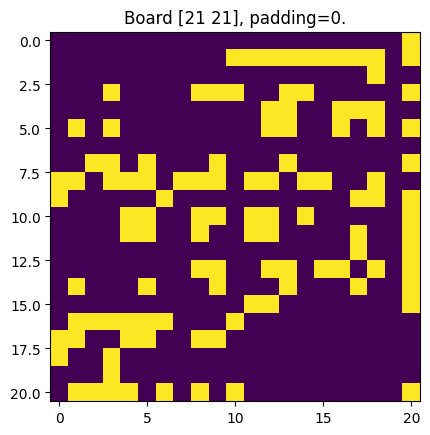

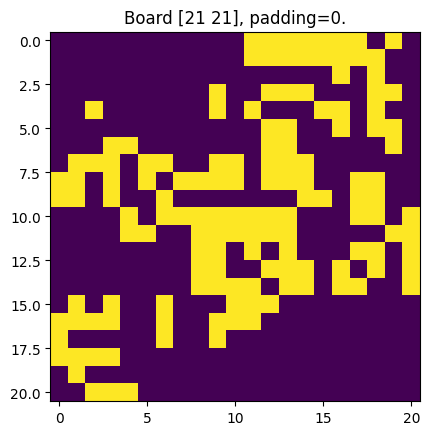

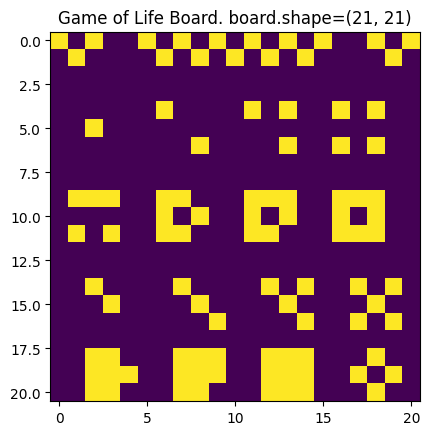

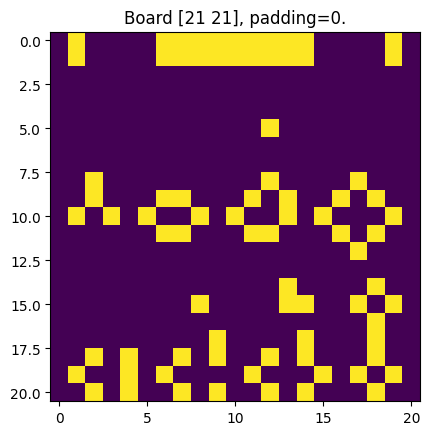

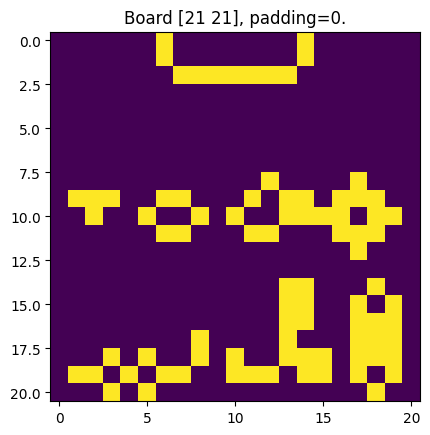

In [ ]:
X_train = load_board(sheet_name='Training_Board', show=True)
y_train = play(X_train, padding=0, show=True)
# X_test = generate_board([X_train.shape[0], X_train.shape[1]], show=True)
X_test = load_board(sheet_name='Test_Board', show=True)
y_test = play(X_test, show=True)

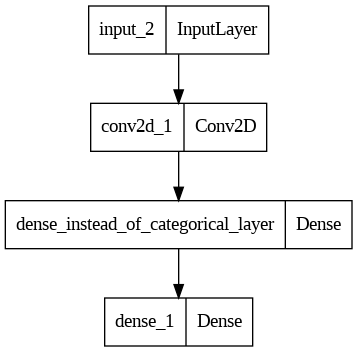

In [ ]:
n_filters = 8
kernel_size = (3, 3)
n_categories = kernel_size[0] * kernel_size[1] * n_filters
input_shape = (3, 3, 1)

input_layer = tf.keras.layers.Input(shape=input_shape)
zero_padding_layer = tf.keras.layers.ZeroPadding2D()(input_layer)

conv2d_layer = tf.keras.layers.Conv2D(
    filters=n_filters,
    kernel_size=kernel_size,
    activation='sigmoid',
    padding='same'
    )(input_layer)

dense_instead_of_categorical_layer = tf.keras.layers.Dense(
    n_categories,
    activation='sigmoid',
    name='dense_instead_of_categorical_layer'
    )(conv2d_layer)

output_layer = tf.keras.layers.Dense(
    1,
    activation='sigmoid',
    use_bias=True
    )(dense_instead_of_categorical_layer)#(conv2d_layer)

model = tf.keras.models.Model(inputs=input_layer, outputs=output_layer)

rmsprop = tf.keras.optimizers.RMSprop(learning_rate=0.025)
adam = tf.keras.optimizers.Adam(learning_rate=0.025)
model.compile(optimizer=adam, loss='mse')
tf.keras.utils.plot_model(model)

In [ ]:
X_train_ready = np.array(X_train)[None, ..., None]
y_train_ready = np.array(y_train)[None, ...]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

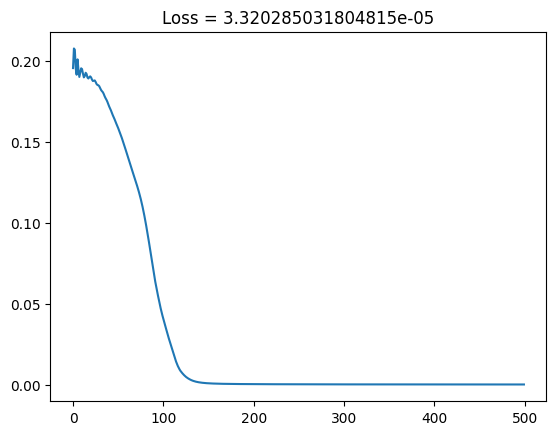

In [ ]:
history = model.fit(
    X_train_ready,
    y_train_ready,
    epochs=500,
    batch_size=1,
    verbose=False,
    callbacks=[TqdmCallback(verbose=True)]
)

losses = history.history['loss']
plt.title(f'Loss = {losses[-1]}')
plt.plot(losses)

1/1 [==============================] - 0s 20ms/step


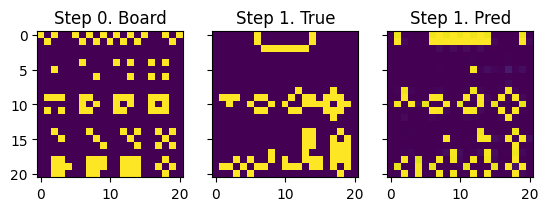

In [ ]:
y_pred = model.predict(np.array(X_test)[None, ..., None])
fig, axes = plt.subplots(1,3, sharey=True)

axes[0].set_title('Step 0. Board')
axes[0].imshow(X_test)

axes[1].set_title('Step 1. True')
axes[1].imshow(y_test)

axes[2].set_title('Step 1. Pred')
axes[2].imshow(
    y_pred.reshape(X_test.shape[0], X_test.shape[1]))

plt.show()

reshape_layer = ProperReshape(list(X_train.shape) + [1])(input_layer)



# #

In [ ]:
conv5x5 = tf.keras.layers.Conv2D(
    filters=1,
    kernel_size=(5,5),
    use_bias=False,
    kernel_initializer=tf.keras.initializers.Constant(1),
    padding='same'
)

In [ ]:
conv5x5(np.array(X_train).astype(float)[None,...,None]).numpy()[0][0].shape

(21, 1)

In [ ]:
y_pred.shape

(1, 21, 21, 1)

# Duplicate (chain) pre-trained model

In [ ]:
model1 = tf.keras.models.clone_model(model)
model1.set_weights(model.get_weights())

model2 = tf.keras.models.clone_model(model)
model2.set_weights(model.get_weights())

double_model_input = model1.input
double_model_output = model2(model1.output)

double_model = tf.keras.models.Model(
    inputs=double_model_input,
    outputs=double_model_output
)

1/1 [==============================] - 0s 153ms/step


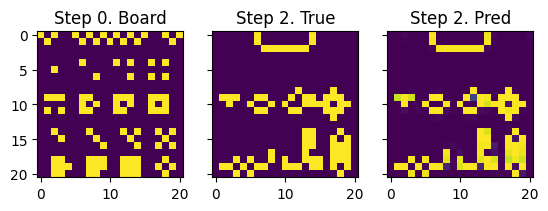

In [ ]:
y_pred2 = double_model.predict(np.array(X_test)[None, ..., None])
y_test2 = play_n_steps(X_test, 2, show=False)
fig, axes = plt.subplots(1,3, sharey=True)

axes[0].set_title('Step 0. Board')
axes[0].imshow(X_test)

axes[1].set_title('Step 2. True')
axes[1].imshow(y_test2)

axes[2].set_title('Step 2. Pred')
axes[2].imshow(
    y_pred2.reshape(X_test.shape[0], X_test.shape[1]))

plt.show()

In [ ]:
threshold = 0.5  # set the threshold value

# create a custom Lambda layer that applies the threshold function
threshold_layer = tf.keras.layers.Lambda(lambda x: tf.cast(tf.greater(x, threshold), tf.float32))

# insert the threshold layer between model1 and model2
double_model_output = model2(threshold_layer(model1.output))

double_model = tf.keras.models.Model(inputs=double_model_input, outputs=double_model_output)

1/1 [==============================] - 1s 590ms/step


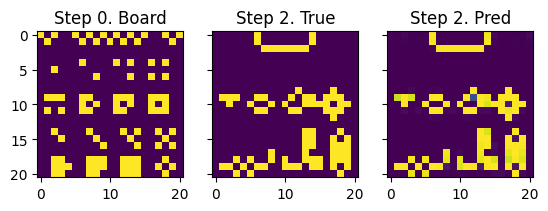

In [ ]:
y_pred2 = double_model.predict(np.array(X_test)[None, ..., None])
y_test2 = play_n_steps(X_test, 2, show=False)
fig, axes = plt.subplots(1,3, sharey=True)

axes[0].set_title('Step 0. Board')
axes[0].imshow(X_test)

axes[1].set_title('Step 2. True')
axes[1].imshow(y_test2)

axes[2].set_title('Step 2. Pred')
axes[2].imshow(
    y_pred2.reshape(X_test.shape[0], X_test.shape[1]))

plt.show()

# ~~Double (chain) model CLEAN~~

## ~~1)~~

In [ ]:
n_steps = 2
n_filters = 8 * n_steps
kernel_size = (3, 3)
n_categories = kernel_size[0] * kernel_size[1] * n_filters * n_steps
input_shape = (X_train.shape[0], X_train.shape[1], 1)

input_layer = tf.keras.layers.Input(shape=input_shape)
zero_padding_layer = tf.keras.layers.ZeroPadding2D()(input_layer)

conv2d_layer = tf.keras.layers.Conv2D(
    filters=n_filters,
    kernel_size=kernel_size,
    activation='sigmoid',
    padding='same'
    )(input_layer)

dense_instead_of_categorical_layer = tf.keras.layers.Dense(
    n_categories,
    activation='sigmoid',
    name='dense_instead_of_categorical_layer'
    )(conv2d_layer)

output_layer = tf.keras.layers.Dense(
    1,
    activation='sigmoid',
    use_bias=True
    )(dense_instead_of_categorical_layer)#(conv2d_layer)

model = tf.keras.models.Model(inputs=input_layer, outputs=output_layer)

rmsprop = tf.keras.optimizers.RMSprop(learning_rate=0.025)
adam = tf.keras.optimizers.Adam(learning_rate=0.025)
model.compile(optimizer=adam, loss='mse')
tf.keras.utils.plot_model(model)

In [ ]:
model1 = tf.keras.models.clone_model(model)
model2 = tf.keras.models.clone_model(model)

double_model_input = model1.input
double_model_output = model2(model1.output)

double_model = tf.keras.models.Model(
    inputs=double_model_input,
    outputs=double_model_output
)

In [ ]:
rmsprop = tf.keras.optimizers.RMSprop(learning_rate=0.025)
adam = tf.keras.optimizers.Adam(learning_rate=0.005)
double_model.compile(optimizer=adam, loss='mse')

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

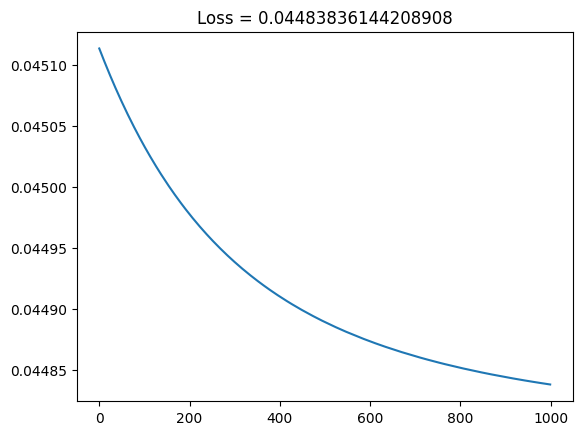

In [ ]:
history = double_model.fit(
    X_train_ready,
    y_train_ready,
    epochs=1000,
    batch_size=1,
    verbose=False,
    callbacks=[TqdmCallback(verbose=True)]
)

losses = history.history['loss']
plt.title(f'Loss = {losses[-1]}')
plt.plot(losses)

1/1 [==============================] - 0s 225ms/step


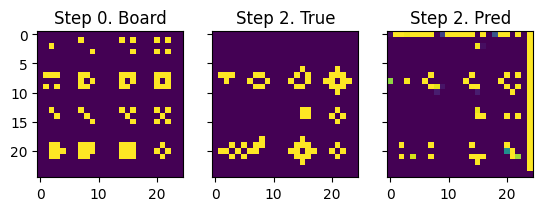

In [ ]:
y_pred2 = double_model.predict(np.array(X_test)[None, ..., None])
y_test2 = play_n_steps(X_test, 2, show=False)
fig, axes = plt.subplots(1,3, sharey=True)

axes[0].set_title('Step 0. Board')
axes[0].imshow(X_test)

axes[1].set_title('Step 2. True')
axes[1].imshow(y_test2)

axes[2].set_title('Step 2. Pred')
axes[2].imshow(
    y_pred2.reshape(X_test.shape[0], X_test.shape[1]))

plt.show()

## ~~2) Generate large training board~~

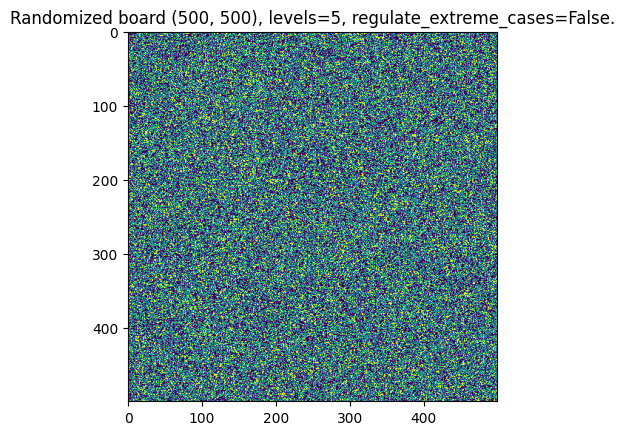

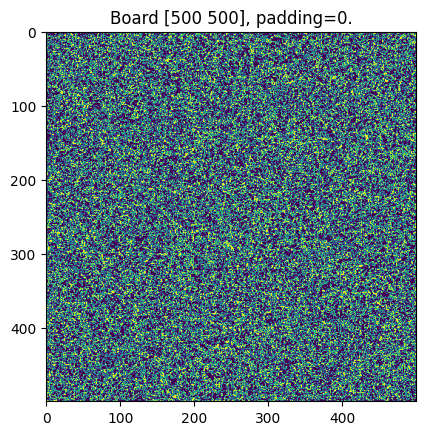

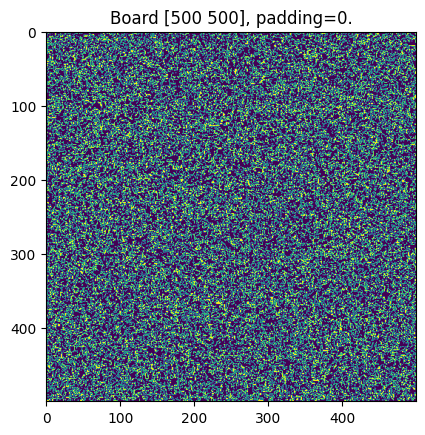

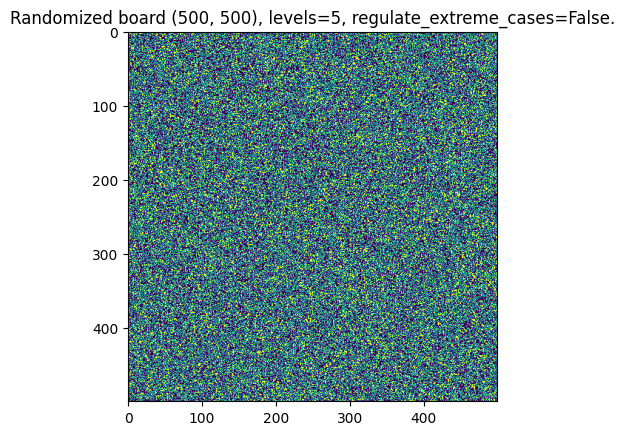

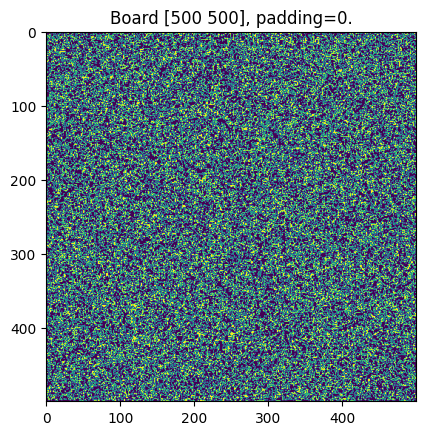

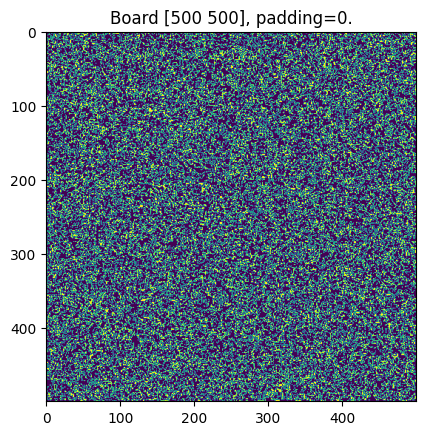

In [ ]:
h, w = 500, 500
X_train = generate_board((h, w), show=True)
y_train = play(X_train, show=True)
y_train2 = play(y_train, show=True)
# y_train2 = play_n_steps(X_train, 2, show=True)
X_test = generate_board((h, w), show=True)
y_test = play(X_test, show=True)
y_test2 = play(y_test, show=True)
# y_test2 = play_n_steps(X_test, 2, show=True)

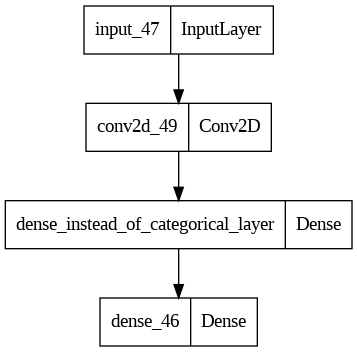

In [ ]:
n_steps = 2
n_filters = 8 * n_steps
kernel_size = (3, 3)
n_categories = kernel_size[0] * kernel_size[1] * n_filters * n_steps
input_shape = (X_train.shape[0], X_train.shape[1], 1)

input_layer = tf.keras.layers.Input(shape=input_shape)
zero_padding_layer = tf.keras.layers.ZeroPadding2D()(input_layer)

conv2d_layer = tf.keras.layers.Conv2D(
    filters=n_filters,
    kernel_size=kernel_size,
    activation='sigmoid',
    padding='same'
    )(input_layer)

dense_instead_of_categorical_layer = tf.keras.layers.Dense(
    n_categories,
    activation='sigmoid',
    name='dense_instead_of_categorical_layer'
    )(conv2d_layer)

output_layer = tf.keras.layers.Dense(
    1,
    activation='sigmoid',
    use_bias=True
    )(dense_instead_of_categorical_layer)#(conv2d_layer)

model = tf.keras.models.Model(inputs=input_layer, outputs=output_layer)

rmsprop = tf.keras.optimizers.RMSprop(learning_rate=0.025)
adam = tf.keras.optimizers.Adam(learning_rate=0.025)
model.compile(optimizer=adam, loss='mse')
tf.keras.utils.plot_model(model)

In [ ]:
model1 = tf.keras.models.clone_model(model)
model2 = tf.keras.models.clone_model(model)

double_model_input = model1.input
double_model_output = model2(model1.output)

double_model = tf.keras.models.Model(
    inputs=double_model_input,
    outputs=double_model_output
)

In [ ]:
rmsprop = tf.keras.optimizers.RMSprop(learning_rate=0.025)
adam = tf.keras.optimizers.Adam(learning_rate=0.005)
double_model.compile(optimizer=adam, loss='mse')

In [ ]:
X_train_ready = np.array(X_train)[None, ..., None]
y_train_ready = np.array(y_train2)[None, ...]

In [ ]:
history = double_model.fit(
    X_train_ready,
    y_train_ready,
    epochs=10,
    batch_size=1,
    verbose=False,
    callbacks=[TqdmCallback(verbose=True)]
)

losses = history.history['loss']
plt.title(f'Loss = {losses[-1]}')
plt.plot(losses)

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

ValueError: ignored

# Recursive pre-trained

In [ ]:
class RecursiveModel(tf.keras.models.Model):
    def __init__(self, core_model, n_times, **kwargs):
        super().__init__(**kwargs)
        self.core_model = core_model
        self.n_times = n_times

    def call(self, inputs):
        x = inputs
        for _ in range(self.n_times):
            x = self.core_model(x)
        return x

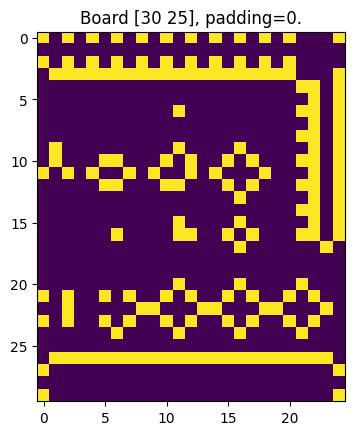

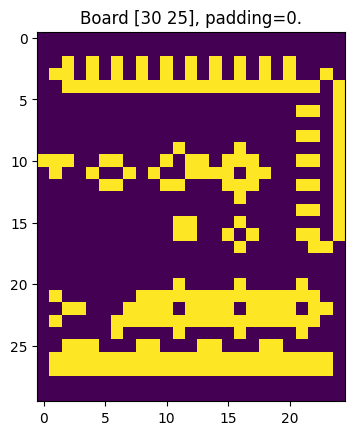

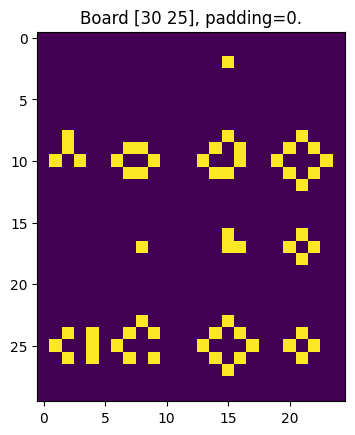

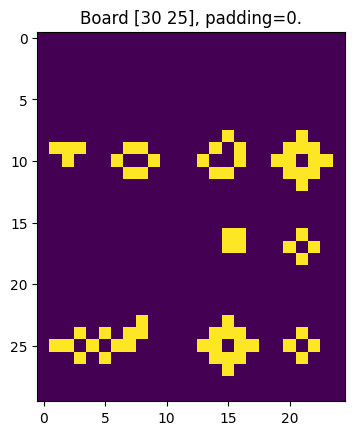

In [ ]:
y_train2 = play_n_steps(X_train, 2, show=True)
y_test2 = play_n_steps(X_test, 2, show=True)

In [ ]:
recursive_model = RecursiveModel(core_model=model, n_times=2)

adam = tf.keras.optimizers.Adam(learning_rate=0.001)
recursive_model.compile(optimizer=adam, loss='mse')

1/1 [==============================] - 0s 459ms/step


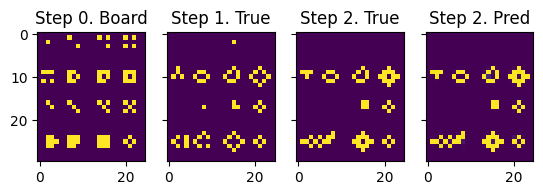

In [ ]:
y_pred2 = recursive_model.predict(np.array(X_test)[None, ..., None])
y_test2 = play_n_steps(X_test, 2, show=False)
fig, axes = plt.subplots(1, 4, sharey=True)

axes[0].set_title('Step 0. Board')
axes[0].imshow(X_test)

axes[1].set_title('Step 1. True')
axes[1].imshow(y_test)

axes[2].set_title('Step 2. True')
axes[2].imshow(y_test2)

axes[3].set_title('Step 2. Pred')
axes[3].imshow(
    y_pred2.reshape(X_test.shape[0], X_test.shape[1]))

plt.show()

# Recursive CLEAN

## 1) x32

In [ ]:
class RecursiveModel(tf.keras.models.Model):
    def __init__(self, core_model, n_times, **kwargs):
        super().__init__(**kwargs)
        self.core_model = core_model
        self.n_times = n_times

    def call(self, inputs):
        x = inputs
        for _ in range(self.n_times):
            x = self.core_model(x)
        return x

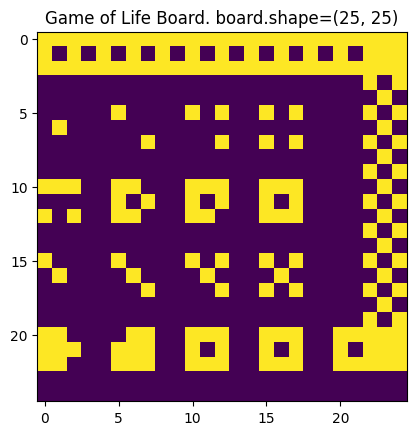

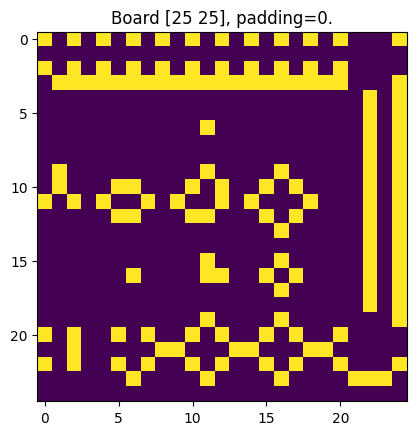

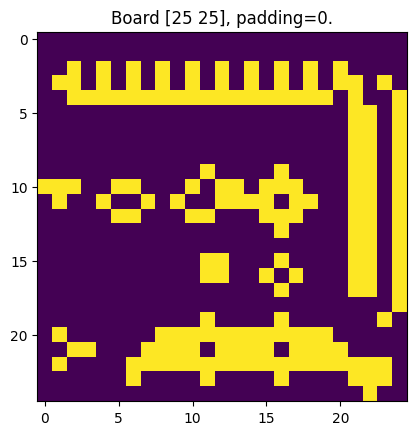

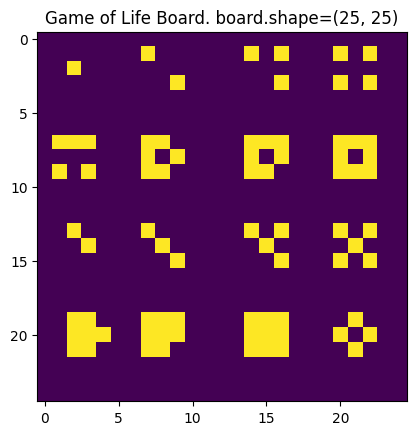

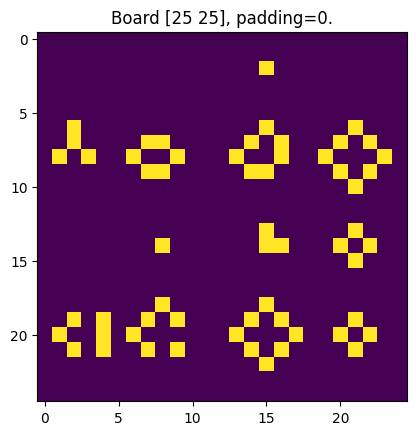

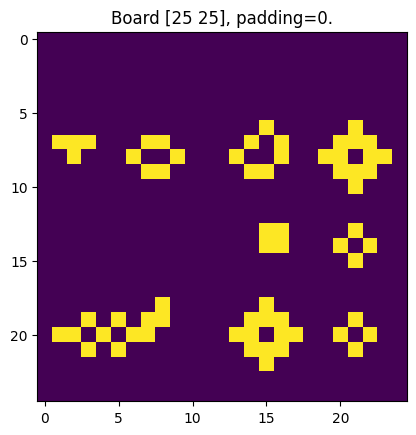

In [ ]:
X_train = load_board(sheet_name='Training_Board', show=True)
y_train2 = play_n_steps(X_train, 2, show=True)
# X_test = generate_board([X_train.shape[0], X_train.shape[1]], show=True)
X_test = load_board(sheet_name='Test_Board', show=True)
y_test = play(X_test)
y_test2 = play_n_steps(X_test, 2, show=True)

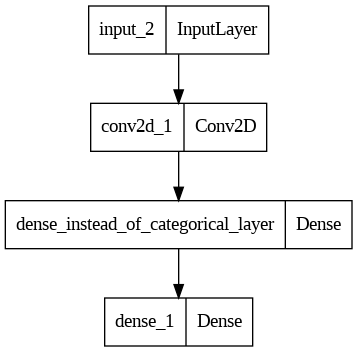

In [ ]:
n_steps = 2
n_filters = 8 * (2 ** n_steps)
kernel_size = (3, 3)
n_categories = kernel_size[0] * kernel_size[1] * n_filters * (2 ** n_steps)
input_shape = (X_train.shape[0], X_train.shape[1], 1)


input_layer = tf.keras.layers.Input(shape=input_shape)
zero_padding_layer = tf.keras.layers.ZeroPadding2D()(input_layer)

conv2d_layer = tf.keras.layers.Conv2D(
    filters=n_filters,
    kernel_size=kernel_size,
    activation='sigmoid',
    padding='same'
    )(input_layer)

dense_instead_of_categorical_layer = tf.keras.layers.Dense(
    n_categories,
    activation='sigmoid',
    name='dense_instead_of_categorical_layer'
    )(conv2d_layer)

output_layer = tf.keras.layers.Dense(
    1,
    activation='sigmoid',
    use_bias=True
    )(dense_instead_of_categorical_layer)#(conv2d_layer)

model = tf.keras.models.Model(inputs=input_layer, outputs=output_layer)

rmsprop = tf.keras.optimizers.RMSprop(learning_rate=0.025)
adam = tf.keras.optimizers.Adam(learning_rate=0.025)
model.compile(optimizer=adam, loss='mse')
tf.keras.utils.plot_model(model)

In [ ]:
recursive_model = RecursiveModel(core_model=model, n_times=2)

adam = tf.keras.optimizers.Adam(learning_rate=0.001)
recursive_model.compile(optimizer=adam, loss='mse')

In [ ]:
X_train_ready = np.array(X_train)[None, ..., None]
y_train2_ready = np.array(y_train2)[None, ...]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

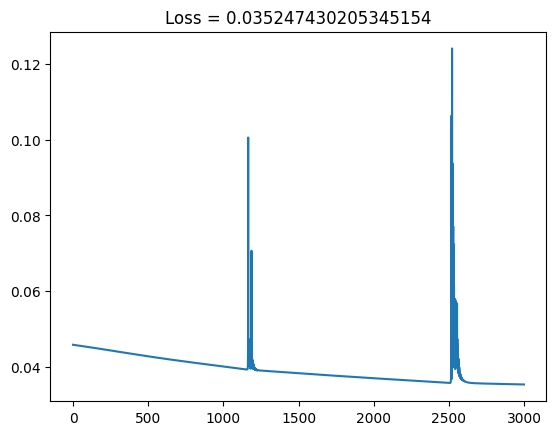

In [ ]:
history = recursive_model.fit(
    X_train_ready,
    y_train2_ready,
    epochs=6000,
    batch_size=1,
    verbose=False,
    callbacks=[TqdmCallback(verbose=True)]
)

losses = history.history['loss']
plt.title(f'Loss = {losses[-1]}')
plt.plot(losses)

1/1 [==============================] - 0s 57ms/step


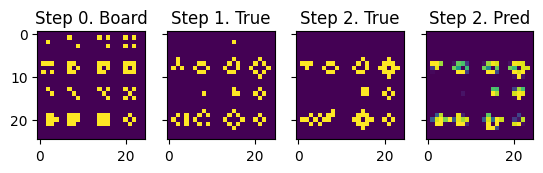

In [ ]:
y_pred2 = recursive_model.predict(np.array(X_test)[None, ..., None])
y_test2 = play_n_steps(X_test, 2, show=False)
fig, axes = plt.subplots(1, 4, sharey=True)

axes[0].set_title('Step 0. Board')
axes[0].imshow(X_test)

axes[1].set_title('Step 1. True')
axes[1].imshow(y_test)

axes[2].set_title('Step 2. True')
axes[2].imshow(y_test2)

axes[3].set_title('Step 2. Pred')
axes[3].imshow(
    y_pred2.reshape(X_test.shape[0], X_test.shape[1]))

plt.show()

## 2) x2

In [ ]:
class RecursiveModel(tf.keras.models.Model):
    def __init__(self, core_model, n_times, **kwargs):
        super().__init__(**kwargs)
        self.core_model = core_model
        self.n_times = n_times

    def call(self, inputs):
        x = inputs
        for _ in range(self.n_times):
            x = self.core_model(x)
        return x

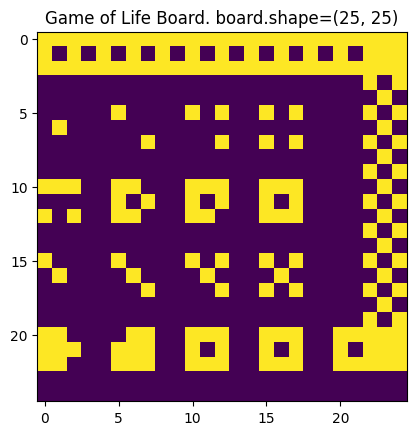

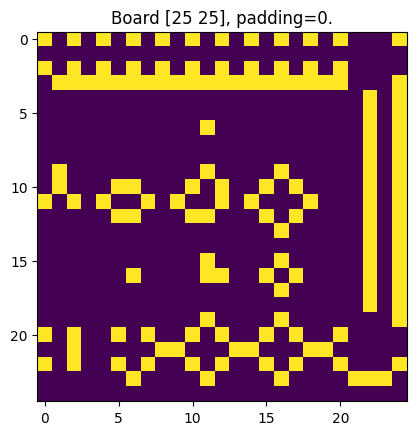

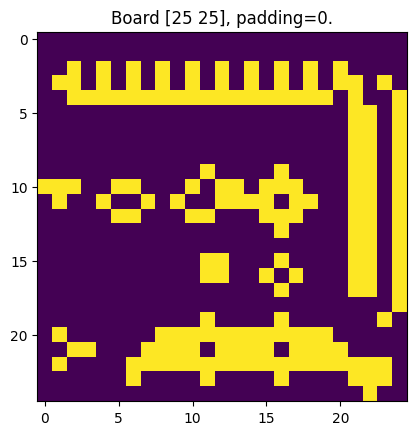

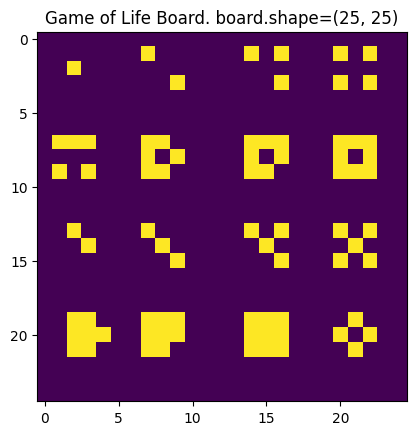

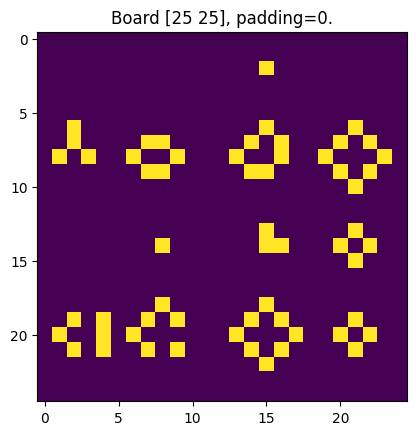

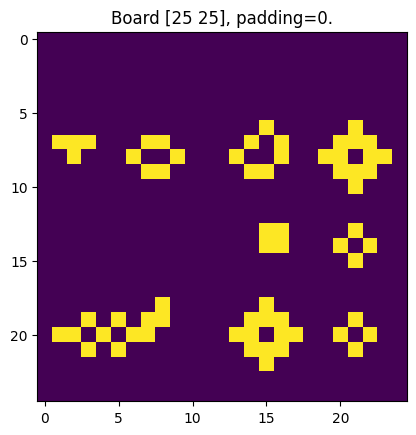

In [ ]:
X_train = load_board(sheet_name='Training_Board', show=True)
y_train2 = play_n_steps(X_train, 2, show=True)
# X_test = generate_board([X_train.shape[0], X_train.shape[1]], show=True)
X_test = load_board(sheet_name='Test_Board', show=True)
y_test = play(X_test, show=True)
y_test2 = play(y_test, show=True)

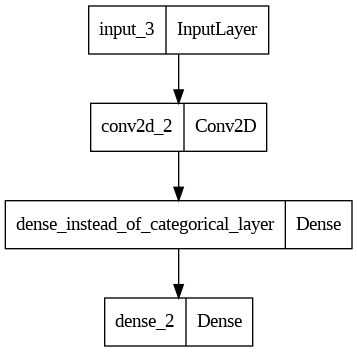

In [ ]:
n_steps = 2
n_filters = 2
kernel_size = (3, 3)
n_categories = kernel_size[0] * kernel_size[1] * n_filters
input_shape = (X_train.shape[0], X_train.shape[1], 1)


input_layer = tf.keras.layers.Input(shape=input_shape)
zero_padding_layer = tf.keras.layers.ZeroPadding2D()(input_layer)

conv2d_layer = tf.keras.layers.Conv2D(
    filters=n_filters,
    kernel_size=kernel_size,
    activation='sigmoid',
    padding='same'
    )(input_layer)

dense_instead_of_categorical_layer = tf.keras.layers.Dense(
    n_categories,
    activation='sigmoid',
    name='dense_instead_of_categorical_layer'
    )(conv2d_layer)

output_layer = tf.keras.layers.Dense(
    1,
    activation='sigmoid',
    use_bias=True
    )(dense_instead_of_categorical_layer)#(conv2d_layer)

model = tf.keras.models.Model(inputs=input_layer, outputs=output_layer)

# rmsprop = tf.keras.optimizers.RMSprop(learning_rate=0.025)
# adam = tf.keras.optimizers.Adam(learning_rate=0.025)
# model.compile(optimizer=adam, loss='mse')
tf.keras.utils.plot_model(model)

In [ ]:
# Create an instance of the custom model
recursive_model = RecursiveModel(core_model=model, n_times=2)

rmsprop = tf.keras.optimizers.RMSprop(learning_rate=0.0025)
adam = tf.keras.optimizers.Adam(learning_rate=0.0001)
recursive_model.compile(optimizer=adam, loss='mse')

In [ ]:
X_train_ready = np.array(X_train)[None, ..., None]
y_train2_ready = np.array(y_train2)[None, ...]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

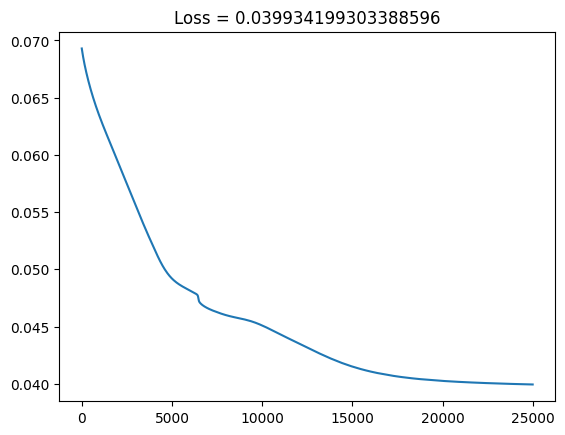

In [ ]:
history = recursive_model.fit(
    X_train_ready,
    y_train2_ready,
    epochs=70000,
    batch_size=1,
    verbose=False,
    callbacks=[TqdmCallback(verbose=True)]
)

losses = history.history['loss']
plt.title(f'Loss = {losses[-1]}')
plt.plot(losses)

1/1 [==============================] - 1s 662ms/step


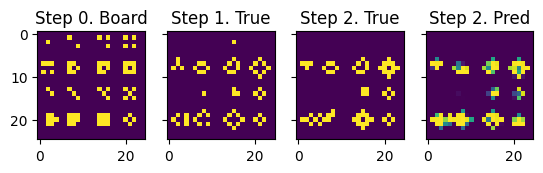

In [ ]:
y_pred2 = recursive_model.predict(np.array(X_test)[None, ..., None])
y_test2 = play_n_steps(X_test, 2, show=False)
fig, axes = plt.subplots(1, 4, sharey=True)

axes[0].set_title('Step 0. Board')
axes[0].imshow(X_test)

axes[1].set_title('Step 1. True')
axes[1].imshow(y_test)

axes[2].set_title('Step 2. True')
axes[2].imshow(y_test2)

axes[3].set_title('Step 2. Pred')
axes[3].imshow(
    y_pred2.reshape(X_test.shape[0], X_test.shape[1]))

plt.show()

## 3)

In [ ]:
# Define a custom model that reuses the core model
class RecursiveModel(tf.keras.models.Model):
    def __init__(self, core_model, n_times, **kwargs):
        super().__init__(**kwargs)
        self.core_model = core_model
        self.n_times = n_times

    def call(self, inputs):
        x = inputs
        for _ in range(self.n_times):
            x = self.core_model(x)
        return x

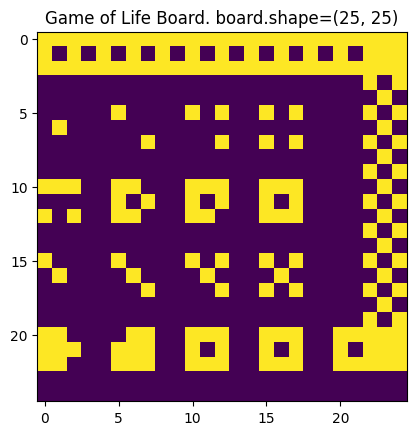

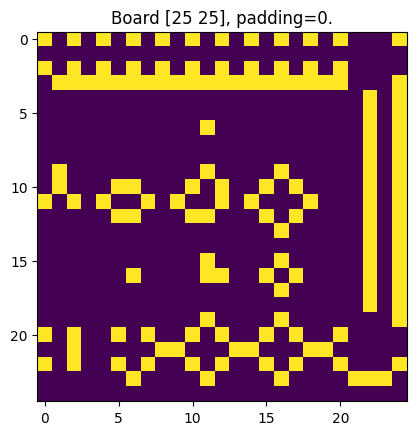

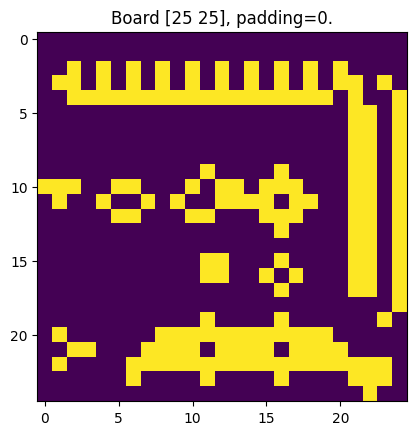

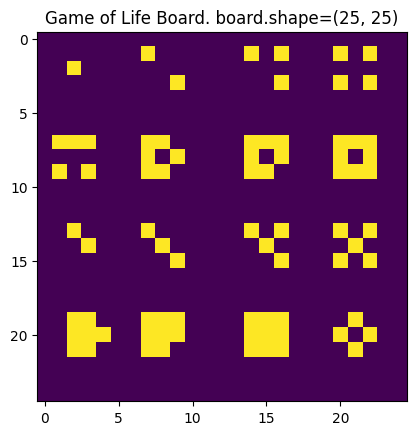

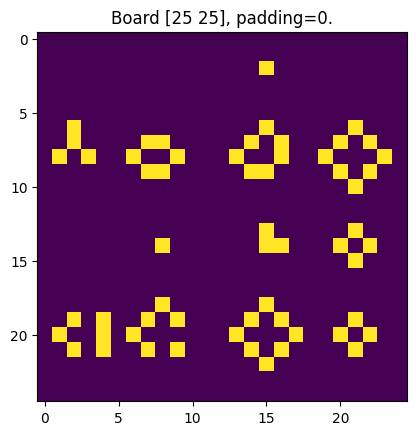

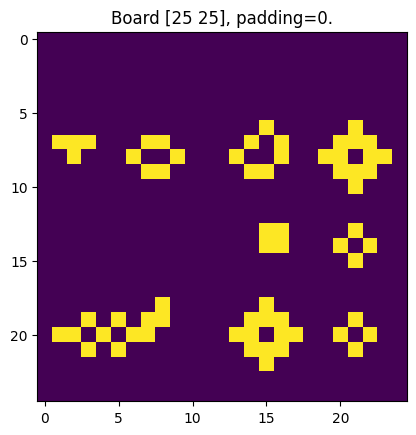

In [ ]:
X_train = load_board(sheet_name='Training_Board', show=True)
y_train2 = play_n_steps(X_train, 2, show=True)
# X_test = generate_board([X_train.shape[0], X_train.shape[1]], show=True)
y_test = play(X_test)
X_test = load_board(sheet_name='Test_Board', show=True)
y_test2 = play_n_steps(X_test, 2, show=True)

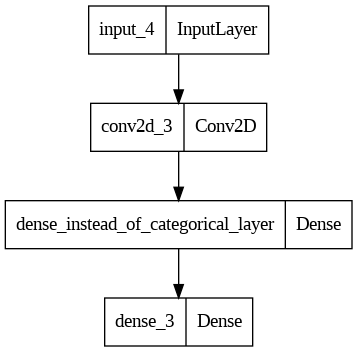

In [ ]:
n_steps = 2
n_filters = 8 * n_steps * 2
kernel_size = (3, 3)
n_categories = kernel_size[0] * kernel_size[1] * n_filters * n_steps
input_shape = (X_train.shape[0], X_train.shape[1], 1)


input_layer = tf.keras.layers.Input(shape=input_shape)
zero_padding_layer = tf.keras.layers.ZeroPadding2D()(input_layer)

conv2d_layer = tf.keras.layers.Conv2D(
    filters=n_filters,
    kernel_size=kernel_size,
    activation='sigmoid',
    padding='same'
    )(input_layer)

dense_instead_of_categorical_layer = tf.keras.layers.Dense(
    n_categories,
    activation='sigmoid',
    name='dense_instead_of_categorical_layer'
    )(conv2d_layer)

output_layer = tf.keras.layers.Dense(
    1,
    activation='sigmoid',
    use_bias=True
    )(dense_instead_of_categorical_layer)#(conv2d_layer)

model = tf.keras.models.Model(inputs=input_layer, outputs=output_layer)

# rmsprop = tf.keras.optimizers.RMSprop(learning_rate=0.025)
# adam = tf.keras.optimizers.Adam(learning_rate=0.025)
# model.compile(optimizer=adam, loss='mse')
tf.keras.utils.plot_model(model)

In [ ]:
# Create an instance of the custom model
recursive_model = RecursiveModel(core_model=model, n_times=2)

rmsprop = tf.keras.optimizers.RMSprop(learning_rate=0.0025)
adam = tf.keras.optimizers.Adam(learning_rate=0.0005)
recursive_model.compile(optimizer=adam, loss='mse')

In [ ]:
X_train_ready = np.array(X_train)[None, ..., None]
y_train2_ready = np.array(y_train2)[None, ...]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

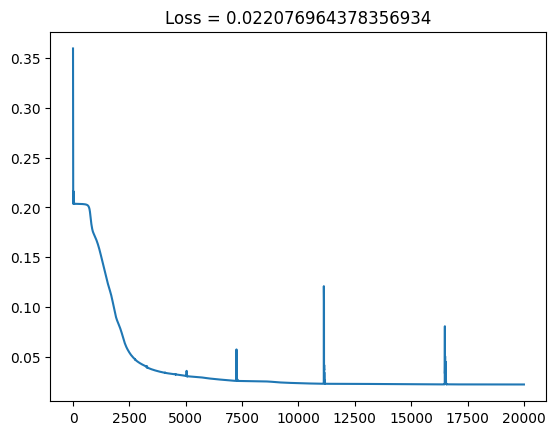

In [ ]:
history = recursive_model.fit(
    X_train_ready,
    y_train2_ready,
    epochs=20000,
    batch_size=1,
    verbose=False,
    callbacks=[TqdmCallback(verbose=True)]
)

losses = history.history['loss']
plt.title(f'Loss = {losses[-1]}')
plt.plot(losses)

1/1 [==============================] - 0s 180ms/step


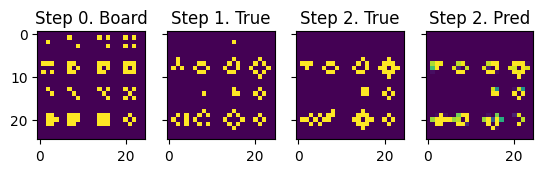

In [ ]:
y_pred2 = recursive_model.predict(np.array(X_test)[None, ..., None])
y_test2 = play_n_steps(X_test, 2, show=False)
fig, axes = plt.subplots(1, 4, sharey=True)

axes[0].set_title('Step 0. Board')
axes[0].imshow(X_test)

axes[1].set_title('Step 1. True')
axes[1].imshow(y_test)

axes[2].set_title('Step 2. True')
axes[2].imshow(y_test2)

axes[3].set_title('Step 2. Pred')
axes[3].imshow(
    y_pred2.reshape(X_test.shape[0], X_test.shape[1]))

plt.show()

## 4) Generate large random training board

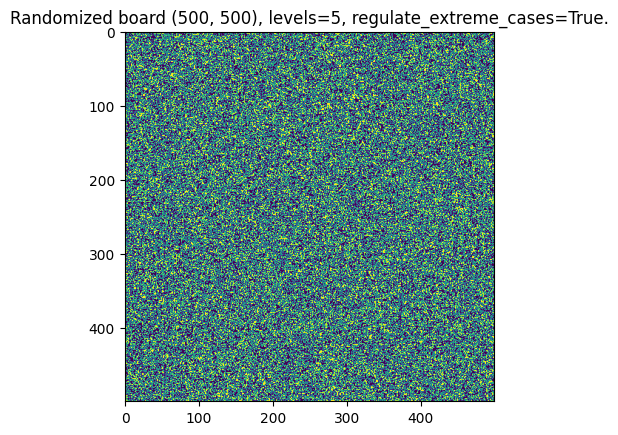

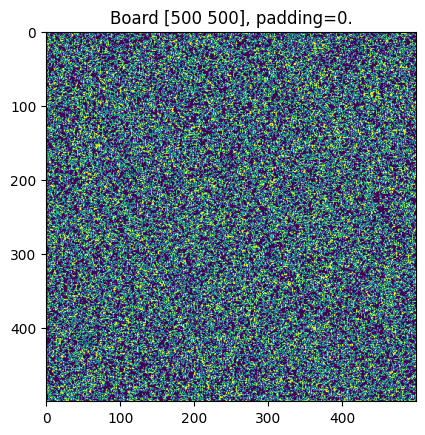

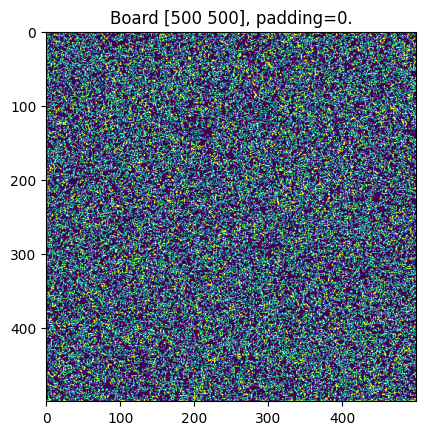

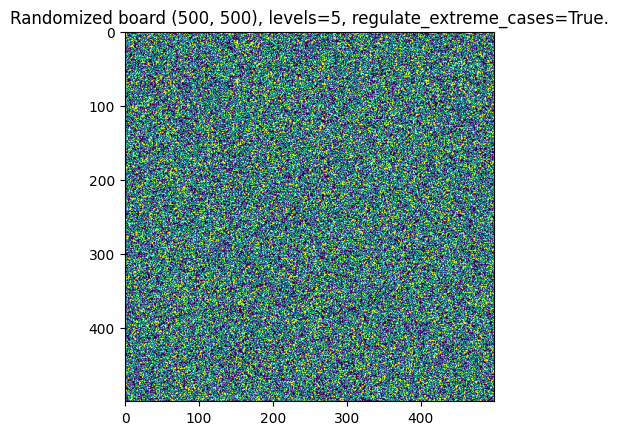

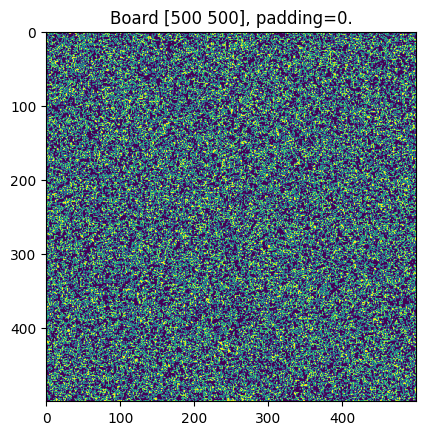

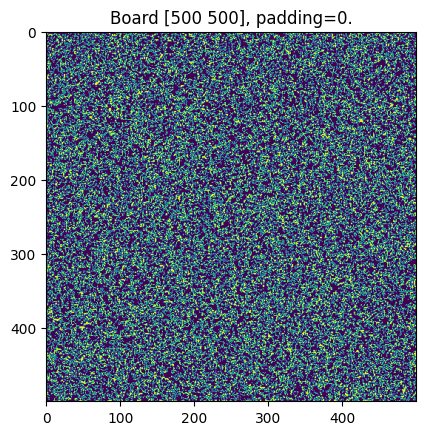

In [ ]:
h, w = 500, 500
X_train = generate_board((h, w), show=True, regulate_extreme_cases=True)
y_train = play(X_train, show=True)
y_train2 = play(y_train, show=True)
# y_train2 = play_n_steps(X_train, 2, show=True)
X_test = generate_board((h, w), show=True, regulate_extreme_cases=True)
y_test = play(X_test, show=True)
y_test2 = play(y_test, show=True)
# y_test2 = play_n_steps(X_test, 2, show=True)

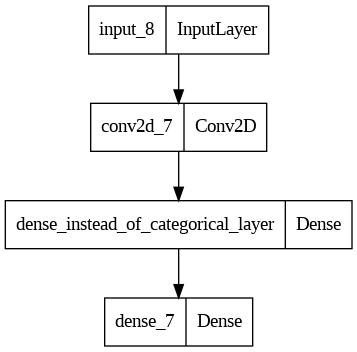

In [ ]:
n_steps = 2
n_filters = 8
kernel_size = (3, 3)
n_categories = kernel_size[0] * kernel_size[1] * n_filters
input_shape = (X_train.shape[0], X_train.shape[1], 1)


input_layer = tf.keras.layers.Input(shape=input_shape)
zero_padding_layer = tf.keras.layers.ZeroPadding2D()(input_layer)

conv2d_layer = tf.keras.layers.Conv2D(
    filters=n_filters,
    kernel_size=kernel_size,
    activation='sigmoid',
    padding='same'
    )(input_layer)

dense_instead_of_categorical_layer = tf.keras.layers.Dense(
    n_categories,
    activation='sigmoid',
    name='dense_instead_of_categorical_layer'
    )(conv2d_layer)

output_layer = tf.keras.layers.Dense(
    1,
    activation='sigmoid',
    use_bias=True
    )(dense_instead_of_categorical_layer)#(conv2d_layer)

model = tf.keras.models.Model(inputs=input_layer, outputs=output_layer)

# rmsprop = tf.keras.optimizers.RMSprop(learning_rate=0.025)
# adam = tf.keras.optimizers.Adam(learning_rate=0.025)
# model.compile(optimizer=adam, loss='mse')
tf.keras.utils.plot_model(model)

In [ ]:
# Create an instance of the custom model
recursive_model = RecursiveModel(core_model=model, n_times=2)

rmsprop = tf.keras.optimizers.RMSprop(learning_rate=0.0025)
adam = tf.keras.optimizers.Adam(learning_rate=0.0025)
recursive_model.compile(optimizer=adam, loss='mse')

In [ ]:
X_train_ready = np.array(X_train)[None, ..., None]
y_train2_ready = np.array(y_train2)[None, ...]

In [ ]:
history = recursive_model.fit(
    X_train_ready,
    y_train2_ready,
    epochs=1000,
    batch_size=1,
    verbose=False,
    callbacks=[TqdmCallback(verbose=True)]
)

losses = history.history['loss']
plt.title(f'Loss = {losses[-1]}')
plt.plot(losses)

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

## 5) Modified training board

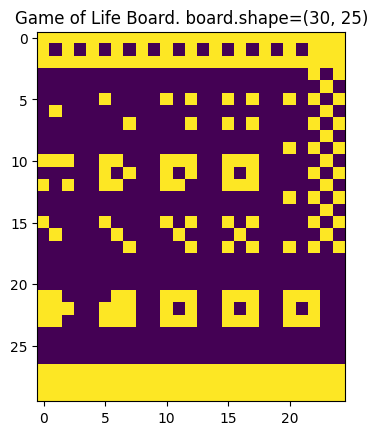

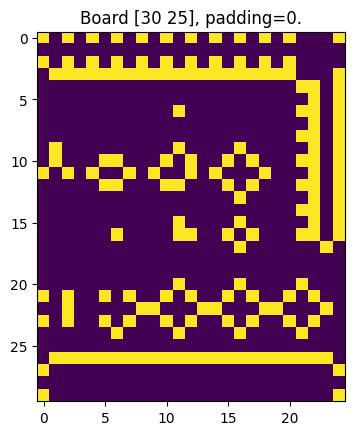

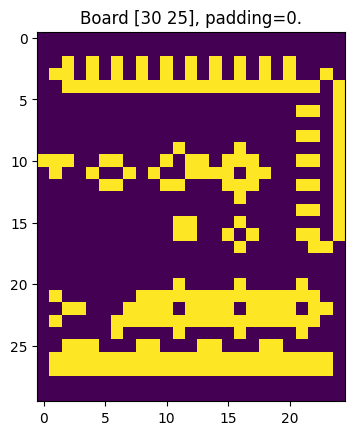

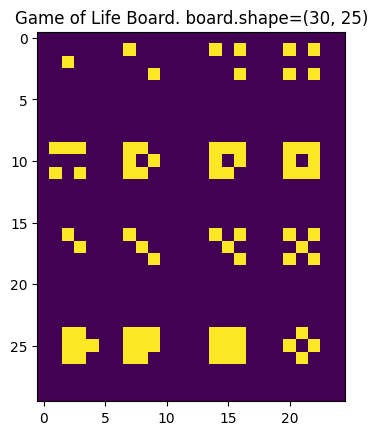

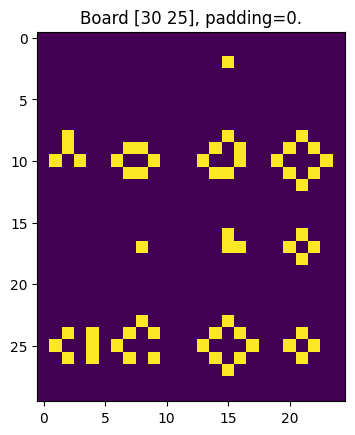

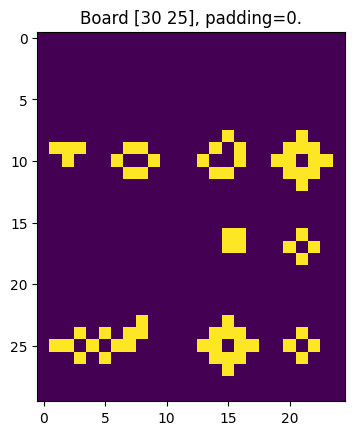

In [ ]:
X_train = load_board(sheet_name='Training_Board2', show=True)
y_train2 = play_n_steps(X_train, 2, show=True)
y_test = play(X_test)
X_test = load_board(sheet_name='Test_Board2', show=True)
y_test2 = play_n_steps(X_test, 2, show=True)

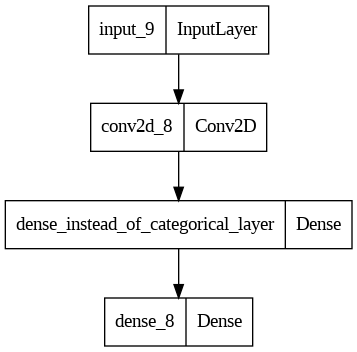

In [ ]:
n_steps = 2
n_filters = 8
kernel_size = (3, 3)
n_categories = kernel_size[0] * kernel_size[1] * n_filters
input_shape = (X_train.shape[0], X_train.shape[1], 1)


input_layer = tf.keras.layers.Input(shape=input_shape)
zero_padding_layer = tf.keras.layers.ZeroPadding2D()(input_layer)

conv2d_layer = tf.keras.layers.Conv2D(
    filters=n_filters,
    kernel_size=kernel_size,
    activation='sigmoid',
    padding='same'
    )(input_layer)

dense_instead_of_categorical_layer = tf.keras.layers.Dense(
    n_categories,
    activation='sigmoid',
    name='dense_instead_of_categorical_layer'
    )(conv2d_layer)

output_layer = tf.keras.layers.Dense(
    1,
    activation='sigmoid',
    use_bias=True
    )(dense_instead_of_categorical_layer)#(conv2d_layer)

model = tf.keras.models.Model(inputs=input_layer, outputs=output_layer)

# rmsprop = tf.keras.optimizers.RMSprop(learning_rate=0.025)
# adam = tf.keras.optimizers.Adam(learning_rate=0.025)
# model.compile(optimizer=adam, loss='mse')
tf.keras.utils.plot_model(model)

In [ ]:
# Create an instance of the custom model
recursive_model = RecursiveModel(core_model=model, n_times=2)

rmsprop = tf.keras.optimizers.RMSprop(learning_rate=0.0025)
adam = tf.keras.optimizers.Adam(learning_rate=0.0025)
recursive_model.compile(optimizer=adam, loss='mse')

In [ ]:
X_train_ready = np.array(X_train)[None, ..., None]
y_train2_ready = np.array(y_train2)[None, ...]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

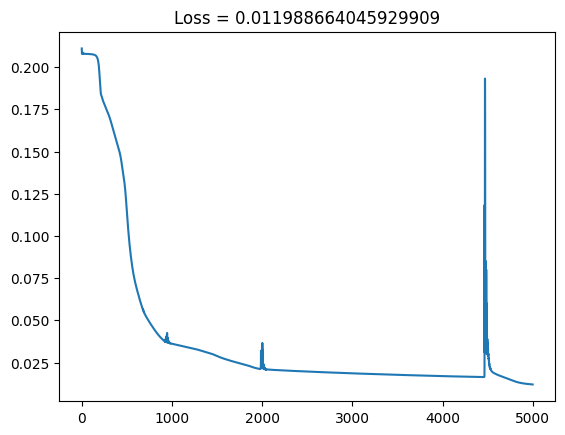

In [ ]:
history = recursive_model.fit(
    X_train_ready,
    y_train2_ready,
    epochs=5000,
    batch_size=1,
    verbose=False,
    callbacks=[TqdmCallback(verbose=True)]
)

losses = history.history['loss']
plt.title(f'Loss = {losses[-1]}')
plt.plot(losses)

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

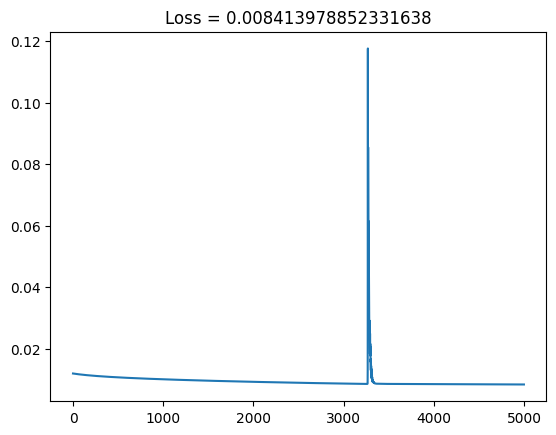

In [ ]:
history = recursive_model.fit(
    X_train_ready,
    y_train2_ready,
    epochs=5000,
    batch_size=1,
    verbose=False,
    callbacks=[TqdmCallback(verbose=True)]
)

losses = history.history['loss']
plt.title(f'Loss = {losses[-1]}')
plt.plot(losses)

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

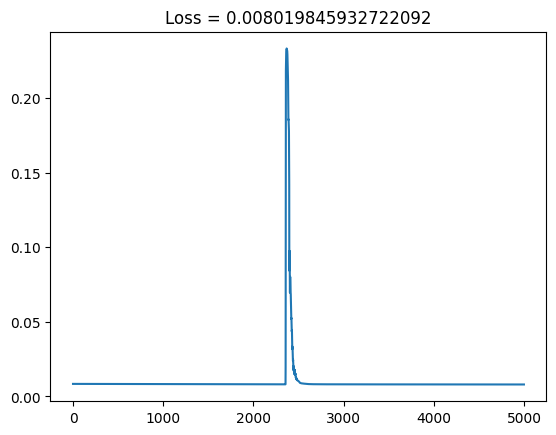

In [ ]:
history = recursive_model.fit(
    X_train_ready,
    y_train2_ready,
    epochs=5000,
    batch_size=1,
    verbose=False,
    callbacks=[TqdmCallback(verbose=True)]
)

losses = history.history['loss']
plt.title(f'Loss = {losses[-1]}')
plt.plot(losses)

1/1 [==============================] - 1s 526ms/step


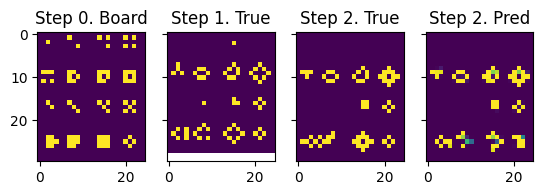

In [ ]:
y_pred2 = recursive_model.predict(np.array(X_test)[None, ..., None])
y_test2 = play_n_steps(X_test, 2, show=False)
fig, axes = plt.subplots(1, 4, sharey=True)

axes[0].set_title('Step 0. Board')
axes[0].imshow(X_test)

axes[1].set_title('Step 1. True')
axes[1].imshow(y_test)

axes[2].set_title('Step 2. True')
axes[2].imshow(y_test2)

axes[3].set_title('Step 2. Pred')
axes[3].imshow(
    y_pred2.reshape(X_test.shape[0], X_test.shape[1]))

plt.show()

## 6) Further Training Board modifications

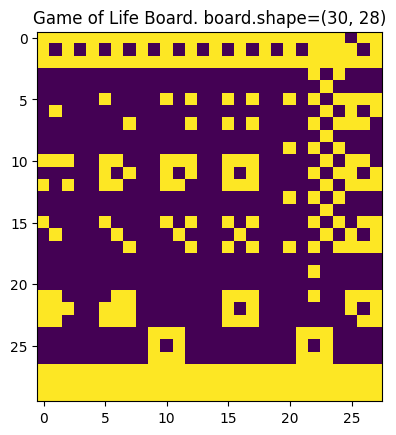

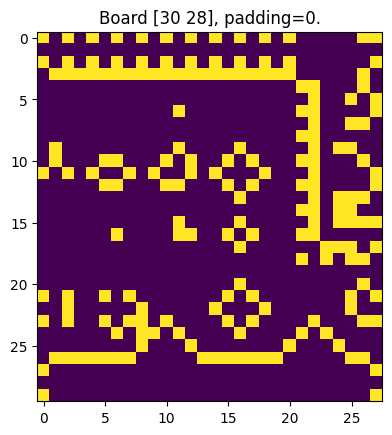

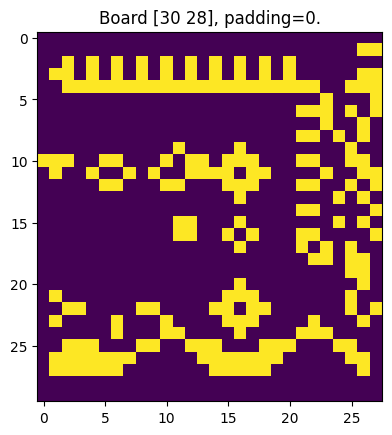

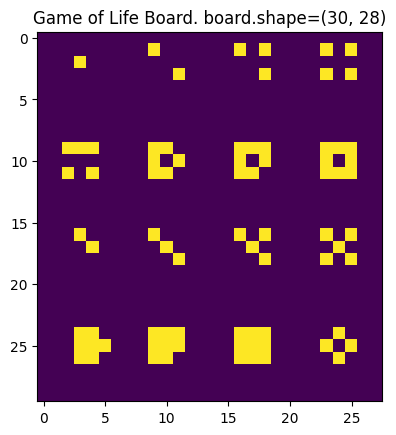

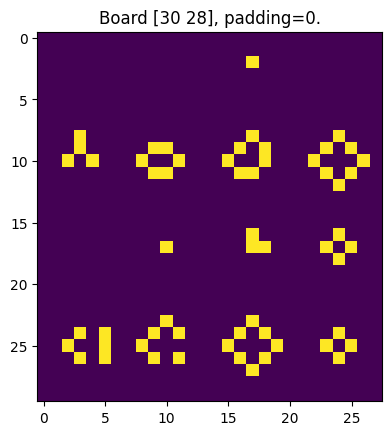

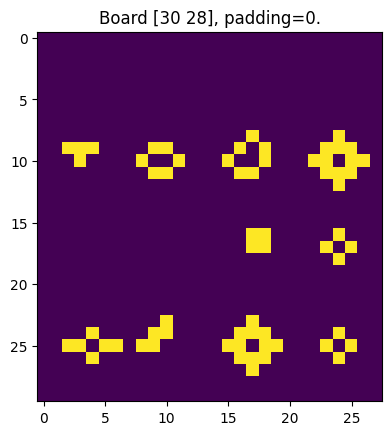

In [ ]:
X_train = load_board(sheet_name='Training_Board3', show=True)
y_train2 = play_n_steps(X_train, 2, show=True)
y_test = play(X_test)
X_test = load_board(sheet_name='Test_Board3', show=True)
y_test2 = play_n_steps(X_test, 2, show=True)

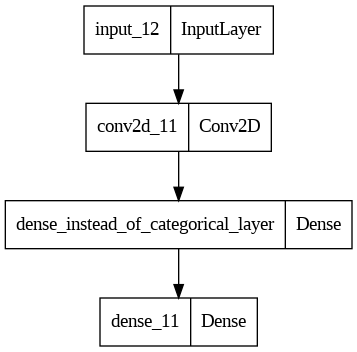

In [ ]:
n_steps = 2
n_filters = 8
kernel_size = (3, 3)
n_categories = kernel_size[0] * kernel_size[1] * n_filters
input_shape = (X_train.shape[0], X_train.shape[1], 1)


input_layer = tf.keras.layers.Input(shape=input_shape)
zero_padding_layer = tf.keras.layers.ZeroPadding2D()(input_layer)

conv2d_layer = tf.keras.layers.Conv2D(
    filters=n_filters,
    kernel_size=kernel_size,
    activation='sigmoid',
    padding='same'
    )(input_layer)

dense_instead_of_categorical_layer = tf.keras.layers.Dense(
    n_categories,
    activation='sigmoid',
    name='dense_instead_of_categorical_layer'
    )(conv2d_layer)

output_layer = tf.keras.layers.Dense(
    1,
    activation='sigmoid',
    use_bias=True
    )(dense_instead_of_categorical_layer)#(conv2d_layer)

model = tf.keras.models.Model(inputs=input_layer, outputs=output_layer)

# rmsprop = tf.keras.optimizers.RMSprop(learning_rate=0.025)
# adam = tf.keras.optimizers.Adam(learning_rate=0.025)
# model.compile(optimizer=adam, loss='mse')
tf.keras.utils.plot_model(model)

In [ ]:
recursive_model = RecursiveModel(core_model=model, n_times=2)

rmsprop = tf.keras.optimizers.RMSprop(learning_rate=0.0025)
adam = tf.keras.optimizers.Adam(learning_rate=0.0025)
recursive_model.compile(optimizer=adam, loss='mse')

In [ ]:
X_train_ready = np.array(X_train)[None, ..., None]
y_train2_ready = np.array(y_train2)[None, ...]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

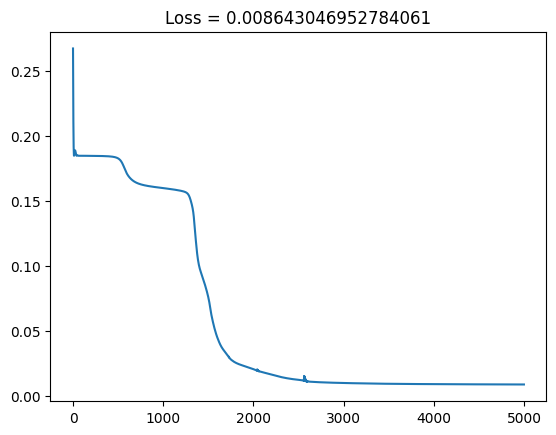

In [ ]:
history = recursive_model.fit(
    X_train_ready,
    y_train2_ready,
    epochs=5000,
    batch_size=1,
    verbose=False,
    callbacks=[TqdmCallback(verbose=True)]
)

losses = history.history['loss']
plt.title(f'Loss = {losses[-1]}')
plt.plot(losses)

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

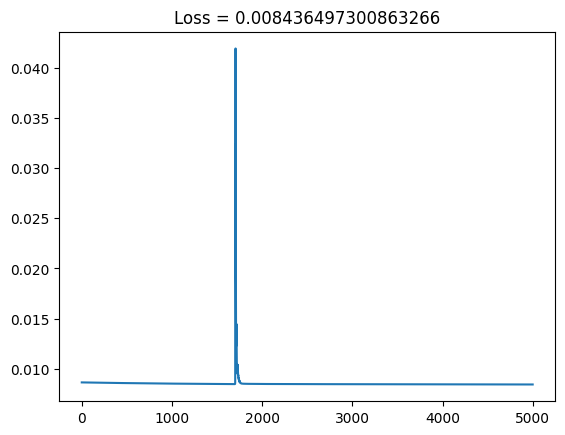

In [ ]:
history = recursive_model.fit(
    X_train_ready,
    y_train2_ready,
    epochs=5000,
    batch_size=1,
    verbose=False,
    callbacks=[TqdmCallback(verbose=True)]
)

losses = history.history['loss']
plt.title(f'Loss = {losses[-1]}')
plt.plot(losses)

1/1 [==============================] - 0s 372ms/step


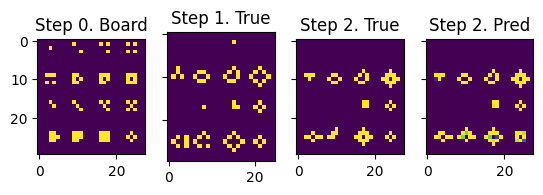

In [ ]:
y_pred2 = recursive_model.predict(np.array(X_test)[None, ..., None])
y_test2 = play_n_steps(X_test, 2, show=False)
fig, axes = plt.subplots(1, 4, sharey=True)

axes[0].set_title('Step 0. Board')
axes[0].imshow(X_test)

axes[1].set_title('Step 1. True')
axes[1].imshow(y_test)

axes[2].set_title('Step 2. True')
axes[2].imshow(y_test2)

axes[3].set_title('Step 2. Pred')
axes[3].imshow(
    y_pred2.reshape(X_test.shape[0], X_test.shape[1]))

plt.show()

## 7) Final modification to the training board

In [ ]:
class RecursiveModel(tf.keras.models.Model):
    def __init__(self, core_model, n_times, **kwargs):
        super().__init__(**kwargs)
        self.core_model = core_model
        self.n_times = n_times

    def call(self, inputs):
        x = inputs
        for _ in range(self.n_times):
            x = self.core_model(x)
        return x

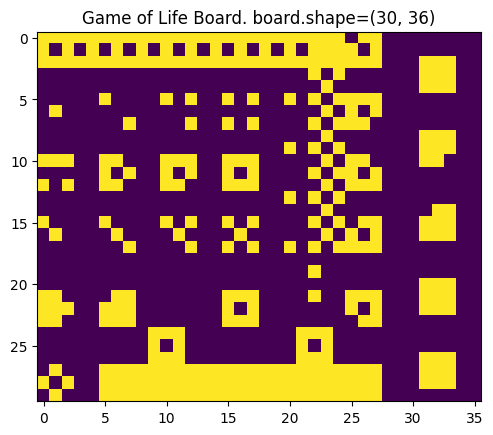

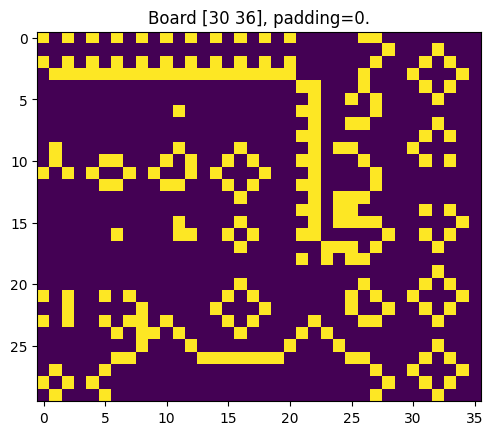

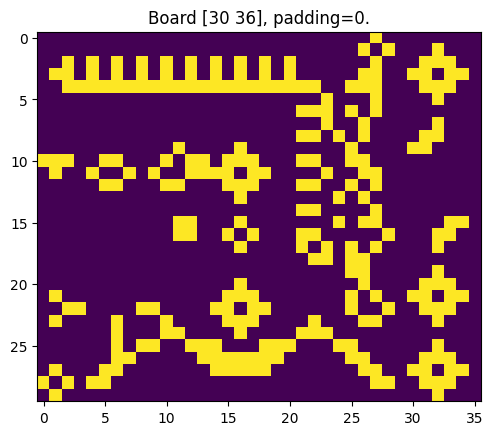

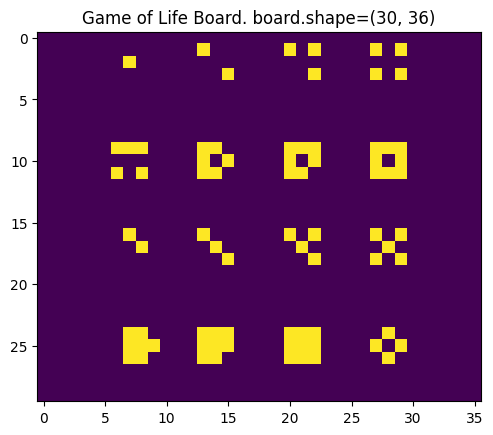

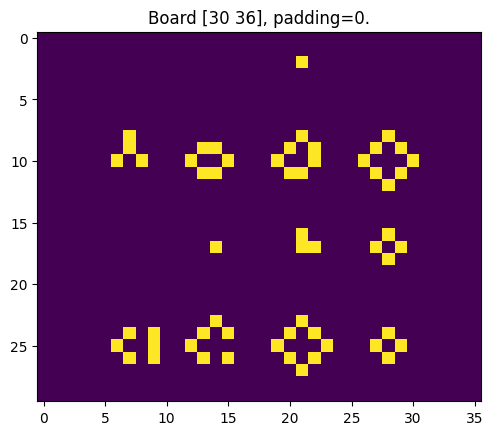

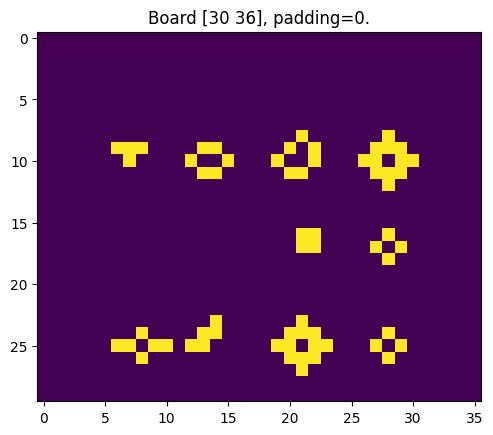

In [ ]:
X_train = load_board(sheet_name='Training_Board5', show=True)
y_train2 = play_n_steps(X_train, 2, show=True)
X_test = load_board(sheet_name='Test_Board5', show=True)
y_test = play(X_test)
y_test2 = play_n_steps(X_test, 2, show=True)

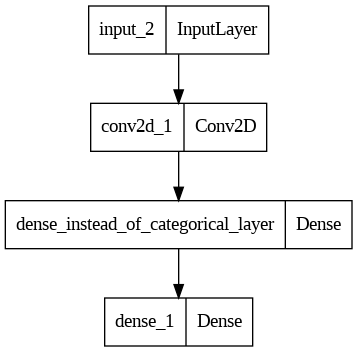

In [ ]:
n_steps = 2
n_filters = 8
kernel_size = (3, 3)
n_categories = kernel_size[0] * kernel_size[1] * n_filters
input_shape = (X_train.shape[0], X_train.shape[1], 1)


input_layer = tf.keras.layers.Input(shape=input_shape)
zero_padding_layer = tf.keras.layers.ZeroPadding2D()(input_layer)

conv2d_layer = tf.keras.layers.Conv2D(
    filters=n_filters,
    kernel_size=kernel_size,
    activation='sigmoid',
    padding='same'
    )(input_layer)

dense_instead_of_categorical_layer = tf.keras.layers.Dense(
    n_categories,
    activation='sigmoid',
    name='dense_instead_of_categorical_layer'
    )(conv2d_layer)

output_layer = tf.keras.layers.Dense(
    1,
    activation='sigmoid',
    use_bias=True
    )(dense_instead_of_categorical_layer)#(conv2d_layer)

model = tf.keras.models.Model(inputs=input_layer, outputs=output_layer)

# rmsprop = tf.keras.optimizers.RMSprop(learning_rate=0.025)
# adam = tf.keras.optimizers.Adam(learning_rate=0.025)
# model.compile(optimizer=adam, loss='mse')
tf.keras.utils.plot_model(model)

In [ ]:
recursive_model = RecursiveModel(core_model=model, n_times=2)

rmsprop = tf.keras.optimizers.RMSprop(learning_rate=0.0025)
adam = tf.keras.optimizers.Adam(learning_rate=0.0025)
recursive_model.compile(optimizer=adam, loss='mse')

In [ ]:
X_train_ready = np.array(X_train)[None, ..., None]
y_train2_ready = np.array(y_train2)[None, ...]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

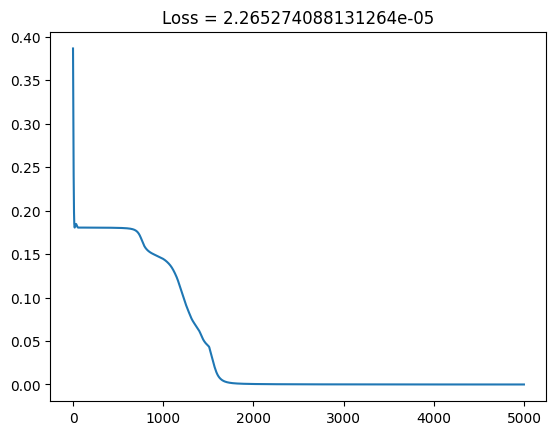

In [ ]:
history = recursive_model.fit(
    X_train_ready,
    y_train2_ready,
    epochs=5000,
    batch_size=1,
    verbose=False,
    callbacks=[TqdmCallback(verbose=True)]
)

losses = history.history['loss']
plt.title(f'Loss = {losses[-1]}')
plt.plot(losses)

1/1 [==============================] - 0s 152ms/step


<Figure size 2500x2500 with 0 Axes>

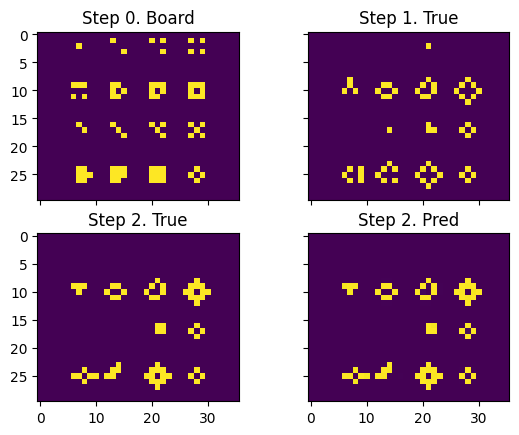

In [ ]:
y_pred2 = recursive_model.predict(np.array(X_test)[None, ..., None])
y_test2 = play_n_steps(X_test, 2, show=False)

plt.figure(figsize=(25,25))
fig, axes = plt.subplots(2, 2, sharey=True, sharex=True)

axes[0][0].set_title('Step 0. Board')
axes[0][0].imshow(X_test)

axes[0][1].set_title('Step 1. True')
axes[0][1].imshow(y_test)

axes[1][0].set_title('Step 2. True')
axes[1][0].imshow(y_test2)

axes[1][1].set_title('Step 2. Pred')
axes[1][1].imshow(
    y_pred2.reshape(X_test.shape[0], X_test.shape[1]))

plt.show()

In [ ]:
model.summary()

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 30, 36, 1)]       0         
                                                                 
 conv2d_1 (Conv2D)           (None, 30, 36, 8)         80        
                                                                 
 dense_instead_of_categorica  (None, 30, 36, 72)       648       
 l_layer (Dense)                                                 
                                                                 
 dense_1 (Dense)             (None, 30, 36, 1)         73        
                                                                 
Total params: 801
Trainable params: 801
Non-trainable params: 0
_________________________________________________________________


## 8) W/o intermediate (categorical) Dense

In [ ]:
class RecursiveModel(tf.keras.models.Model):
    def __init__(self, core_model, n_times, **kwargs):
        super().__init__(**kwargs)
        self.core_model = core_model
        self.n_times = n_times

    def call(self, inputs):
        x = inputs
        for _ in range(self.n_times):
            x = self.core_model(x)
        return x

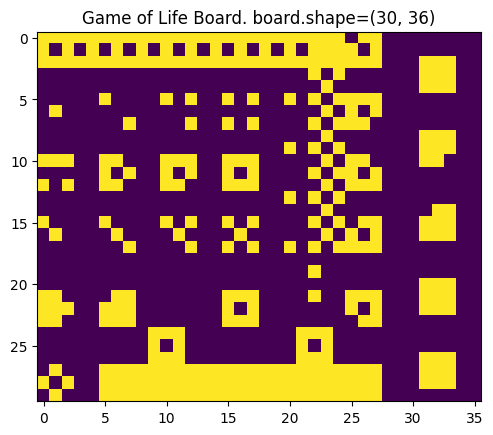

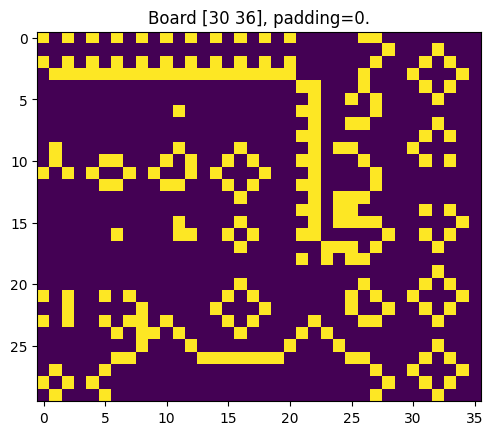

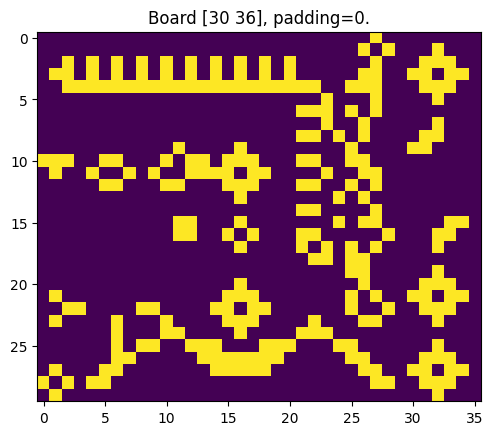

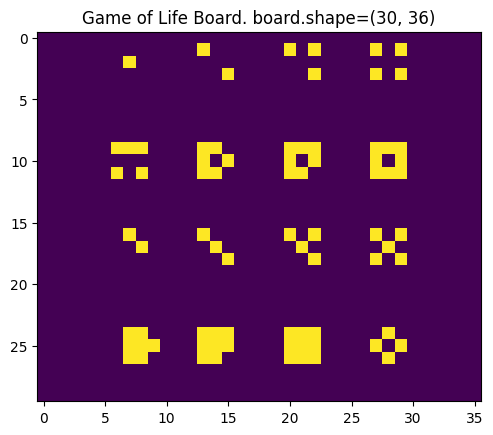

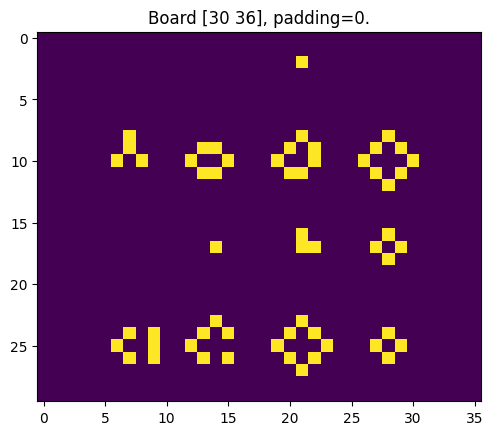

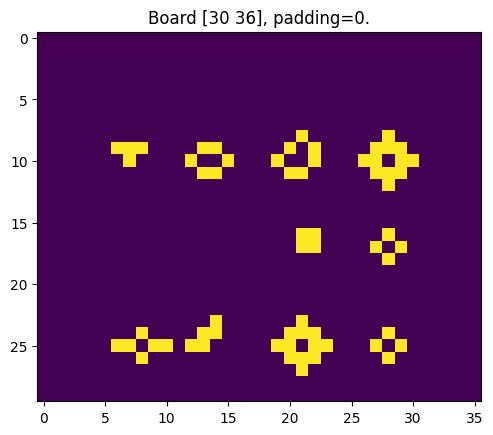

In [ ]:
X_train = load_board(sheet_name='Training_Board5', show=True)
y_train2 = play_n_steps(X_train, 2, show=True)
X_test = load_board(sheet_name='Test_Board5', show=True)
y_test = play(X_test)
y_test2 = play_n_steps(X_test, 2, show=True)

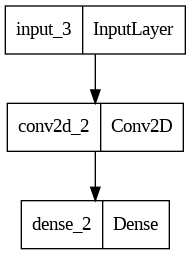

In [ ]:
n_steps = 2
n_filters = 8
kernel_size = (3, 3)
n_categories = kernel_size[0] * kernel_size[1] * n_filters
input_shape = (X_train.shape[0], X_train.shape[1], 1)


input_layer = tf.keras.layers.Input(shape=input_shape)
zero_padding_layer = tf.keras.layers.ZeroPadding2D()(input_layer)

conv2d_layer = tf.keras.layers.Conv2D(
    filters=n_filters,
    kernel_size=kernel_size,
    activation='sigmoid',
    padding='same'
    )(input_layer)

dense_instead_of_categorical_layer = tf.keras.layers.Dense(
    n_categories,
    activation='sigmoid',
    name='dense_instead_of_categorical_layer'
    )(conv2d_layer)

output_layer = tf.keras.layers.Dense(
    1,
    activation='sigmoid',
    use_bias=True
    )(conv2d_layer)

model = tf.keras.models.Model(inputs=input_layer, outputs=output_layer)

# rmsprop = tf.keras.optimizers.RMSprop(learning_rate=0.025)
# adam = tf.keras.optimizers.Adam(learning_rate=0.025)
# model.compile(optimizer=adam, loss='mse')
tf.keras.utils.plot_model(model)

In [ ]:
recursive_model = RecursiveModel(core_model=model, n_times=2)

rmsprop = tf.keras.optimizers.RMSprop(learning_rate=0.0005)
adam = tf.keras.optimizers.Adam(learning_rate=0.0005)
recursive_model.compile(optimizer=adam, loss='mse')

In [ ]:
X_train_ready = np.array(X_train)[None, ..., None]
y_train2_ready = np.array(y_train2)[None, ...]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

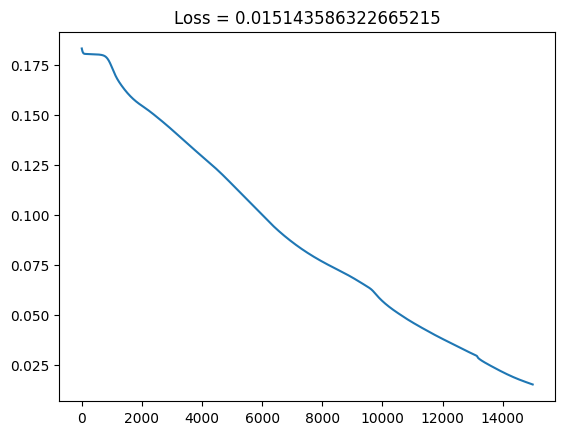

In [ ]:
history = recursive_model.fit(
    X_train_ready,
    y_train2_ready,
    epochs=15000,
    batch_size=1,
    verbose=False,
    callbacks=[TqdmCallback(verbose=True)]
)

losses = history.history['loss']
plt.title(f'Loss = {losses[-1]}')
plt.plot(losses)

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

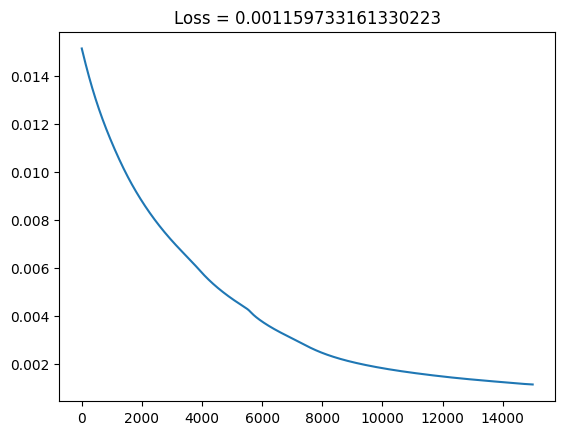

In [ ]:
history = recursive_model.fit(
    X_train_ready,
    y_train2_ready,
    epochs=15000,
    batch_size=1,
    verbose=False,
    callbacks=[TqdmCallback(verbose=True)]
)

losses = history.history['loss']
plt.title(f'Loss = {losses[-1]}')
plt.plot(losses)

1/1 [==============================] - 0s 152ms/step


<Figure size 2500x2500 with 0 Axes>

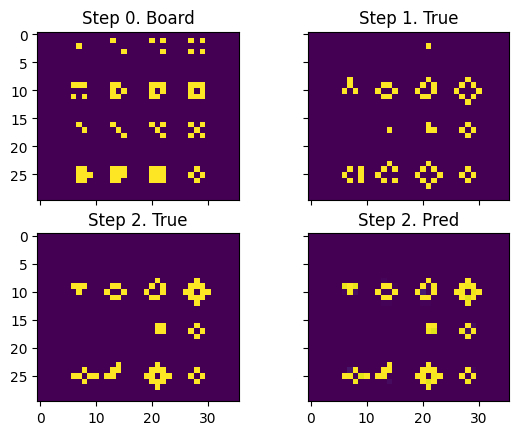

In [ ]:
y_pred2 = recursive_model.predict(np.array(X_test)[None, ..., None])
y_test2 = play_n_steps(X_test, 2, show=False)

plt.figure(figsize=(25,25))
fig, axes = plt.subplots(2, 2, sharey=True, sharex=True)

axes[0][0].set_title('Step 0. Board')
axes[0][0].imshow(X_test)

axes[0][1].set_title('Step 1. True')
axes[0][1].imshow(y_test)

axes[1][0].set_title('Step 2. True')
axes[1][0].imshow(y_test2)

axes[1][1].set_title('Step 2. Pred')
axes[1][1].imshow(
    y_pred2.reshape(X_test.shape[0], X_test.shape[1]))

plt.show()

In [ ]:
recursive_model.summary()

Model: "recursive_model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 model_2 (Functional)        (None, 30, 36, 1)         89        
                                                                 
Total params: 89
Trainable params: 89
Non-trainable params: 0
_________________________________________________________________


## 9) Conv Minimal

In [ ]:
class RecursiveModel(tf.keras.models.Model):
    def __init__(self, core_model, n_times, **kwargs):
        super().__init__(**kwargs)
        self.core_model = core_model
        self.n_times = n_times

    def call(self, inputs):
        x = inputs
        for _ in range(self.n_times):
            x = self.core_model(x)
        return x

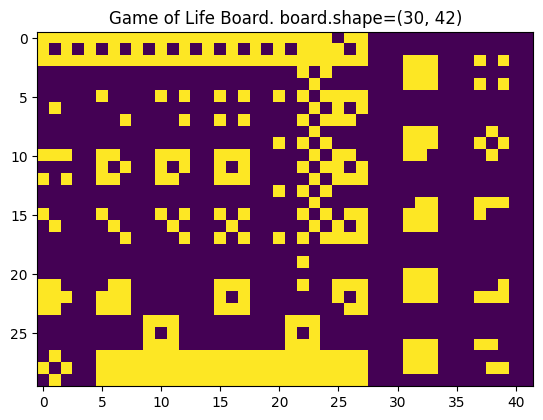

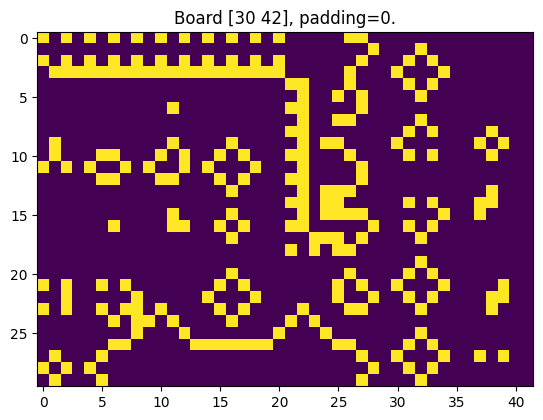

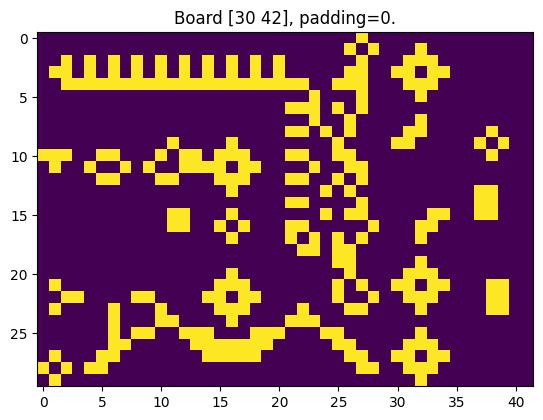

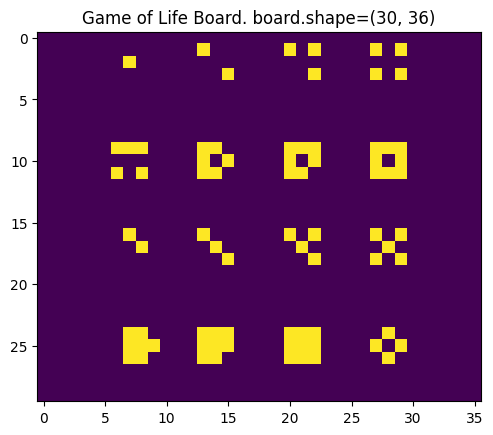

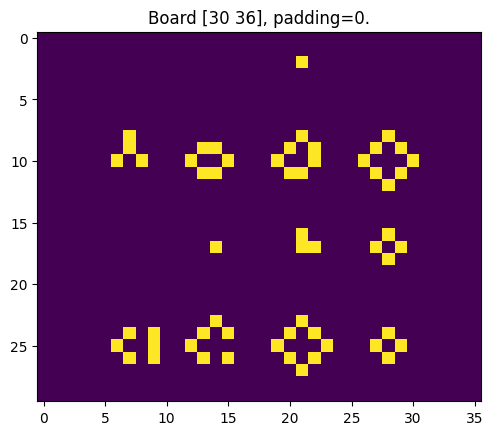

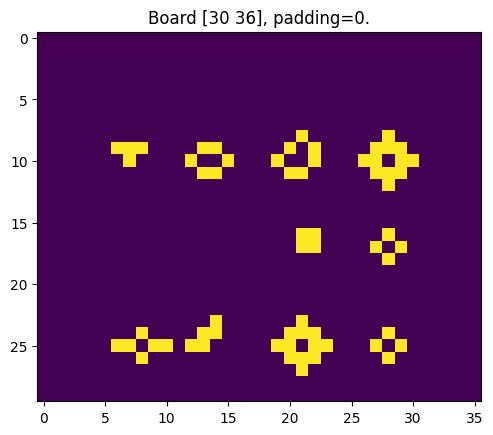

In [ ]:
X_train = load_board(sheet_name='Training_Board6', show=True)
y_train2 = play_n_steps(X_train, 2, show=True)
X_test = load_board(sheet_name='Test_Board5', show=True)
y_test = play(X_test)
y_test2 = play_n_steps(X_test, 2, show=True)

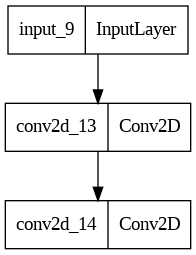

In [ ]:
n_steps = 2
n_filters = 2
kernel_size = (3, 3)
n_categories = kernel_size[0] * kernel_size[1] * n_filters
input_shape = (None, None, 1)


input_layer = tf.keras.layers.Input(shape=input_shape)
zero_padding_layer = tf.keras.layers.ZeroPadding2D()(input_layer)

conv2d_layer = tf.keras.layers.Conv2D(
    filters=n_filters,
    kernel_size=kernel_size,
    activation='relu',
    padding='same',
    )(input_layer)


output_layer = tf.keras.layers.Conv2D(
    filters=1,
    kernel_size=(1,1),
    activation='relu',
    use_bias=True
    )(conv2d_layer)

model = tf.keras.models.Model(inputs=input_layer, outputs=output_layer)

# rmsprop = tf.keras.optimizers.RMSprop(learning_rate=0.025)
# adam = tf.keras.optimizers.Adam(learning_rate=0.025)
# model.compile(optimizer=adam, loss='mse')
tf.keras.utils.plot_model(model)

In [ ]:
recursive_model = RecursiveModel(core_model=model, n_times=2)

rmsprop = tf.keras.optimizers.RMSprop(learning_rate=0.0025)
adam = tf.keras.optimizers.Adam(learning_rate=0.0025)
recursive_model.compile(optimizer=adam, loss='mse')

In [ ]:
X_train_ready = np.array(X_train)[None, ..., None]
y_train2_ready = np.array(y_train2)[None, ...]

In [ ]:
history = recursive_model.fit(
    X_train_ready,
    y_train2_ready,
    epochs=15000,
    batch_size=1,
    verbose=False,
    callbacks=[TqdmCallback(verbose=True)]
)

losses = history.history['loss']
plt.title(f'Loss = {losses[-1]}')
plt.plot(losses)

1/1 [==============================] - 0s 107ms/step


<Figure size 2500x2500 with 0 Axes>

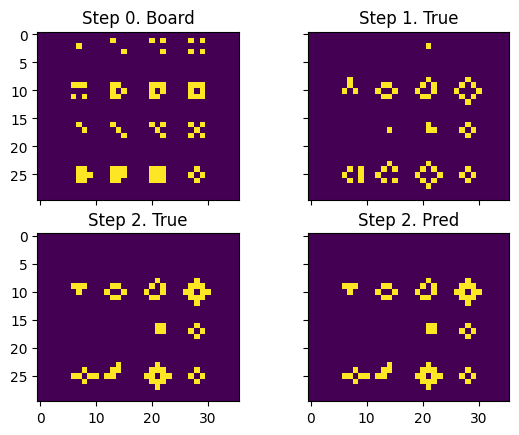

In [ ]:
y_pred2 = recursive_model.predict(np.array(X_test)[None, ..., None])
y_test2 = play_n_steps(X_test, 2, show=False)

plt.figure(figsize=(25,25))
fig, axes = plt.subplots(2, 2, sharey=True, sharex=True)

axes[0][0].set_title('Step 0. Board')
axes[0][0].imshow(X_test)

axes[0][1].set_title('Step 1. True')
axes[0][1].imshow(y_test)

axes[1][0].set_title('Step 2. True')
axes[1][0].imshow(y_test2)

axes[1][1].set_title('Step 2. Pred')
axes[1][1].imshow(
    y_pred2.reshape(X_test.shape[0], X_test.shape[1]))

plt.show()

In [ ]:
recursive_model.summary()

Model: "recursive_model_9"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 model_8 (Functional)        (None, None, None, 1)     23        
                                                                 
Total params: 23
Trainable params: 23
Non-trainable params: 0
_________________________________________________________________


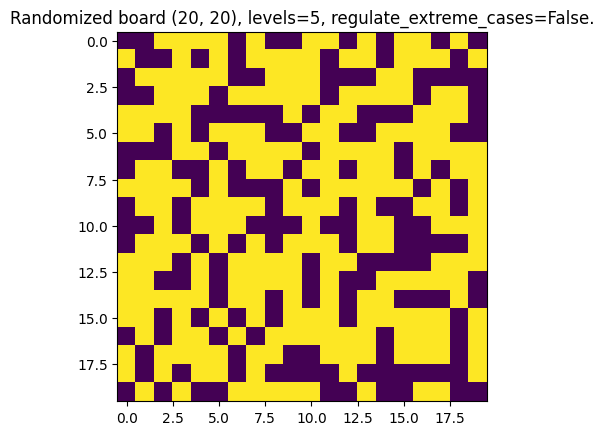

In [ ]:
X_test = generate_board((20, 20), show=True)

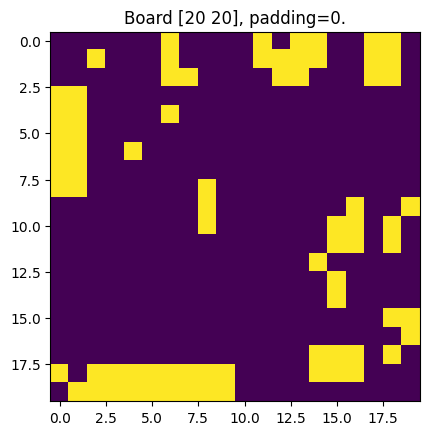

In [ ]:
y_test = play(play(X_test), show=True)

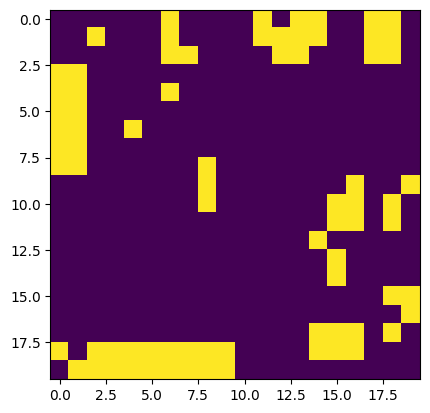

In [ ]:
y_pred = recursive_model.predict(np.array(X_test)[None, ..., None])
y_pred = y_pred.squeeze()  # y_pred.reshape(X_test.shape[0], X_test.shape[1])
plt.imshow(y_pred)

## 10) Random training set (RAM failure, unfinished)

In [ ]:
class RecursiveModel(tf.keras.models.Model):
    def __init__(self, core_model, n_times, **kwargs):
        super().__init__(**kwargs)
        self.core_model = core_model
        self.n_times = n_times

    def call(self, inputs):
        x = inputs
        for _ in range(self.n_times):
            x = self.core_model(x)
        return x

In [ ]:
X_train = generate_board((1000, 1000), regulate_extreme_cases=True)

In [ ]:
y_train = play(play(X_train))

KeyboardInterrupt: ignored

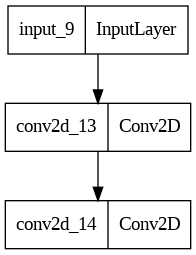

In [ ]:
n_steps = 2
n_filters = 2
kernel_size = (3, 3)
n_categories = kernel_size[0] * kernel_size[1] * n_filters
input_shape = (None, None, 1)


input_layer = tf.keras.layers.Input(shape=input_shape)
zero_padding_layer = tf.keras.layers.ZeroPadding2D()(input_layer)

conv2d_layer = tf.keras.layers.Conv2D(
    filters=n_filters,
    kernel_size=kernel_size,
    activation='relu',
    padding='same',
    )(input_layer)


output_layer = tf.keras.layers.Conv2D(
    filters=1,
    kernel_size=(1,1),
    activation='relu',
    use_bias=True
    )(conv2d_layer)

new_model = tf.keras.models.Model(inputs=input_layer, outputs=output_layer)

# rmsprop = tf.keras.optimizers.RMSprop(learning_rate=0.025)
# adam = tf.keras.optimizers.Adam(learning_rate=0.025)
# model.compile(optimizer=adam, loss='mse')
tf.keras.utils.plot_model(model)

In [ ]:
new_recursive_model = RecursiveModel(core_model=new_model, n_times=2)

rmsprop = tf.keras.optimizers.RMSprop(learning_rate=0.0025)
adam = tf.keras.optimizers.Adam(learning_rate=0.0025)
new_recursive_model.compile(optimizer=adam, loss='mse')

In [ ]:
X_train_ready = np.array(X_train)[None, ..., None]
y_train_ready = np.array(y_train)[None, ...]

In [ ]:
history = new_recursive_model.fit(
    X_train_ready,
    y_train_ready,
    epochs=15000,
    batch_size=1,
    verbose=False,
    callbacks=[TqdmCallback(verbose=True)]
)

losses = history.history['loss']
plt.title(f'Loss = {losses[-1]}')
plt.plot(losses)

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

1/1 [==============================] - 0s 107ms/step


<Figure size 2500x2500 with 0 Axes>

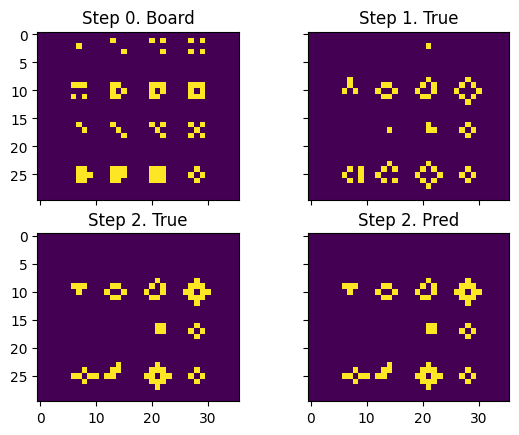

In [ ]:
y_pred2 = recursive_model.predict(np.array(X_test)[None, ..., None])
y_test2 = play_n_steps(X_test, 2, show=False)

plt.figure(figsize=(25,25))
fig, axes = plt.subplots(2, 2, sharey=True, sharex=True)

axes[0][0].set_title('Step 0. Board')
axes[0][0].imshow(X_test)

axes[0][1].set_title('Step 1. True')
axes[0][1].imshow(y_test)

axes[1][0].set_title('Step 2. True')
axes[1][0].imshow(y_test2)

axes[1][1].set_title('Step 2. Pred')
axes[1][1].imshow(
    y_pred2.reshape(X_test.shape[0], X_test.shape[1]))

plt.show()

In [ ]:
recursive_model.summary()

Model: "recursive_model_9"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 model_8 (Functional)        (None, None, None, 1)     23        
                                                                 
Total params: 23
Trainable params: 23
Non-trainable params: 0
_________________________________________________________________


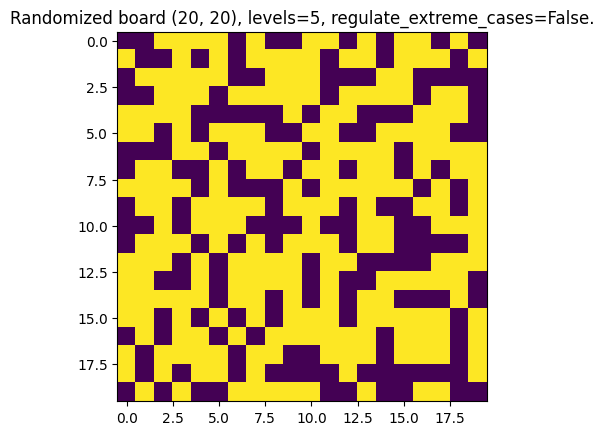

In [ ]:
X_test = generate_board((20, 20), show=True)

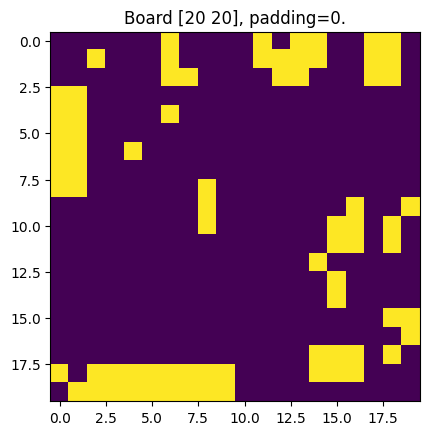

In [ ]:
y_test = play(play(X_test), show=True)

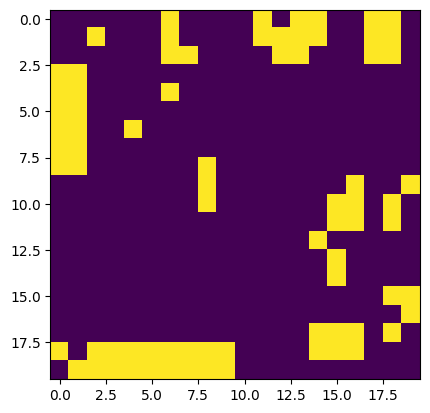

In [ ]:
plt.imshow(y_pred)

In [ ]:
y_pred = recursive_model.predict(np.array(X_test)[None, ..., None])

1/1 [==============================] - 0s 36ms/step


In [ ]:
y_pred = y_pred.squeeze()

In [ ]:
# y_pred.reshape(X_test.shape[0], X_test.shape[1])

# 3x3 training

Game of Life focuses on 3 x 3 = 9 kernel

## a) generate data

In [9]:
X_train = []
for i in range(2**9):
  b = np.array([int(i) for i in list(bin(i).split('b')[1].zfill(9))])\
  .reshape(3, 3)
  X_train.append(b)
X_train = np.array(X_train)

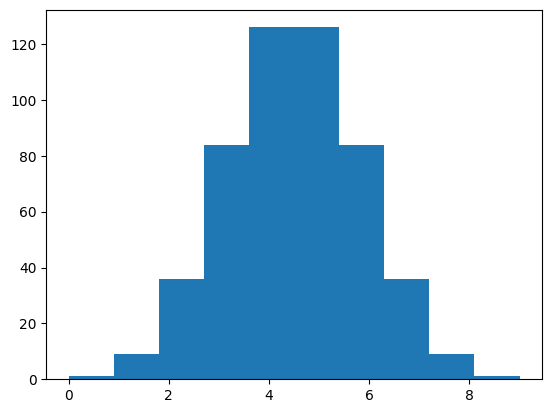

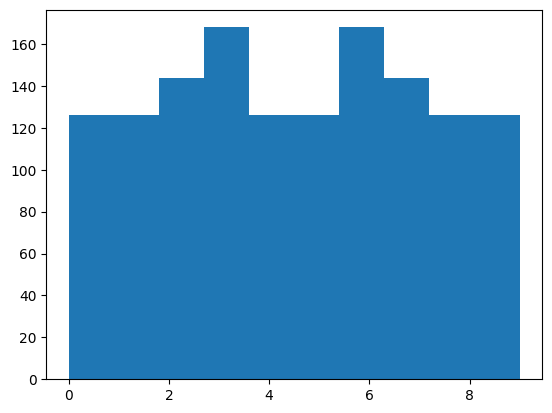

In [10]:
# @title compensate frequencies
sums = []
for b in X_train:
  sums.append(sum(sum(b)))
frequencies = plt.hist(sums)
plt.show()
frequencies = zip(
    (frequencies[1] + 0.5).round().astype(int), frequencies[0].astype(int))
frequencies = {key: value for key, value in frequencies}

max_freq = max(frequencies.values())
reverse_frequencies = {}
for val, freq in frequencies.items():
  reverse_frequencies[val] = int(round(max_freq/freq))

X_train_flattened = []
for b in X_train:
  sum_ = sum(sum(b))
  for _ in range(reverse_frequencies[sum_]):
    X_train_flattened.append(b)
X_train_flattened = np.array(X_train_flattened)

sums = []
for b in X_train_flattened:
  sums.append(sum(sum(b)))
plt.hist(sums)
X_train = X_train_flattened

## b) compose data

In [11]:
bantik1 = np.array([
    [0,0,0,0,0],
    [0,0,1,0,0],
    [0,1,0,1,0],
    [0,0,1,0,0],
    [0,0,0,0,0],
])
bantik2 = np.array([
    [0,0,0,0,0],
    [0,1,0,1,0],
    [0,0,0,0,0],
    [0,1,0,1,0],
    [0,0,0,0,0],
])
bantik3 = np.array([
    [0,0,0,0,0],
    [0,0,1,0,0],
    [0,1,1,1,0],
    [0,0,1,0,0],
    [0,0,0,0,0],
])
bantik4 = np.array([
    [0,0,0,0,0],
    [0,1,0,1,0],
    [0,0,1,0,0],
    [0,1,0,1,0],
    [0,0,0,0,0],
])
palka = np.array([
    [0,0,0,0,0],
    [0,0,0,0,0],
    [0,1,1,1,0],
    [0,0,0,0,0],
    [0,0,0,0,0],
])
alive1 = np.array([
    [1,0,0,0,1],
    [0,1,0,1,0],
    [1,0,0,0,1],
    [0,1,0,1,0],
    [1,0,0,0,1],
])
alive2 = np.array([
    [1,0,1,0,1],
    [0,1,0,1,0],
    [1,0,0,0,1],
    [0,1,0,1,0],
    [1,0,1,0,1],
])
alive3 = np.array([
    [0,1,0,1,0],
    [1,0,0,0,1],
    [0,1,0,1,0],
    [1,0,1,0,1],
    [0,0,1,0,0],
])
dotted1 = np.array([
    [0,1,0,1,0],
    [1,0,1,0,1],
    [0,1,0,1,0],
    [1,0,1,0,1],
    [0,1,0,1,0],
])
dotted2 = np.array(
    [
      [1,0,1,0,1],
      [0,1,0,1,0],
      [1,0,1,0,1],
      [0,1,0,1,0],
      [1,0,1,0,1],
    ]
)
infinistick = np.array(
    [
      [1,1,0,1,1],
      [0,0,0,0,0],
      [1,1,1,1,1],
      [0,0,0,0,0],
      [1,1,0,1,1],
    ]
)
extra = np.array(
    [
      [0,1,1,1,1],
      [1,0,1,0,1],
      [1,1,0,1,1],
      [1,0,0,0,1],
      [1,1,1,1,0],
    ]
)

In [32]:
X_train = np.concatenate(
    [
      list(np.tile(bantik1, (4, 1, 1))),
      [bantik2],
      [bantik3],
      [bantik4],
      # [palka],
      # [palka.T],
      [alive1],
      [alive2],
      [alive3],
      [dotted1],
      [dotted2],
      [infinistick],
      [infinistick.T],
      [extra],
      [extra.T]
    ]
)

In [ ]:
# for _ in range(500):
#   X_train = np.concatenate([X_train, [bantik]])

In [34]:
np.random.shuffle(X_train)

In [35]:
n_steps = 2
padding = 1 - n_steps
y_train = [
    play_n_steps(pd.DataFrame(i), n_steps, padding=padding) for i in X_train
]

In [36]:
X_train_ready = np.pad(X_train, 2)[2:-2]
y_train_ready = np.array(y_train)

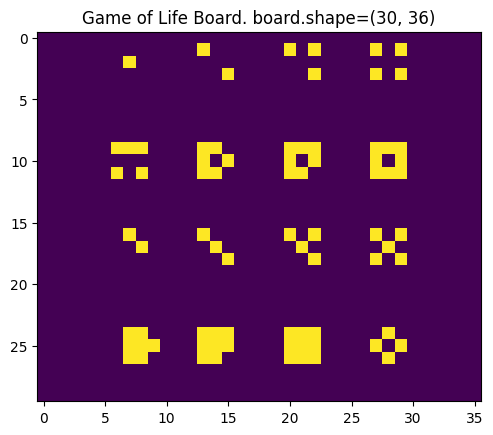

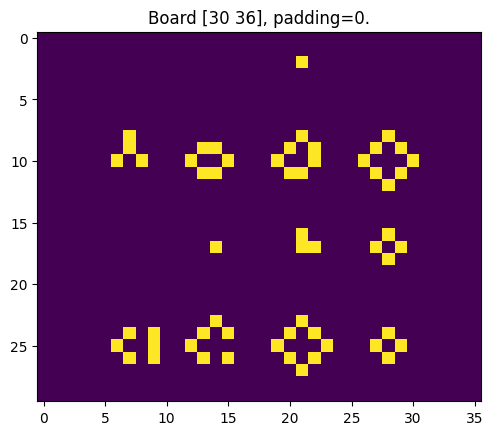

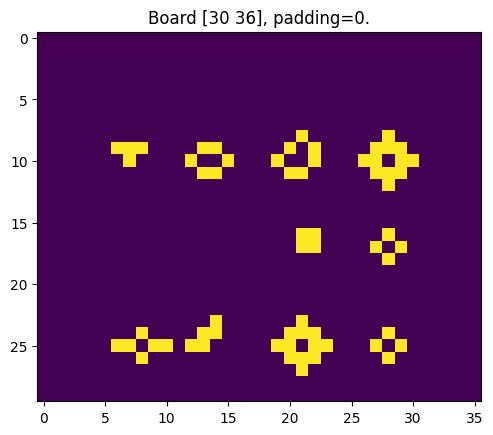

In [37]:
X_test = load_board(sheet_name='Test_Board5', show=True)
y_test = play(X_test, show=True)
y_test2 = play(y_test, show=True)

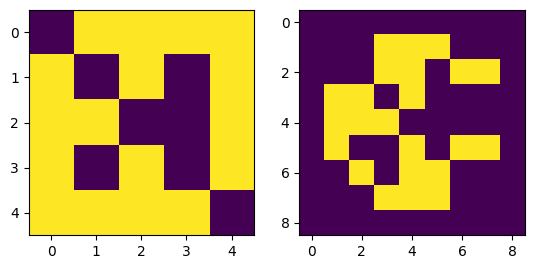

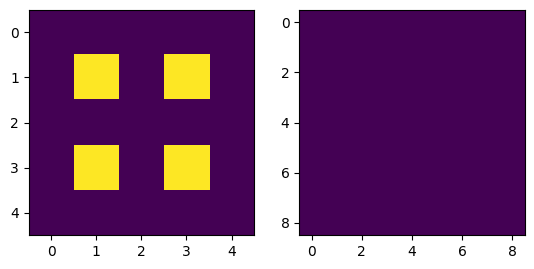

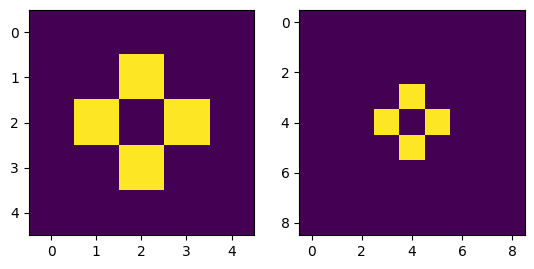

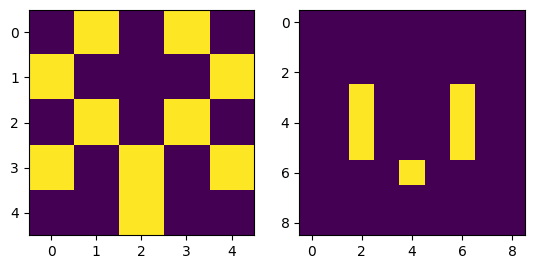

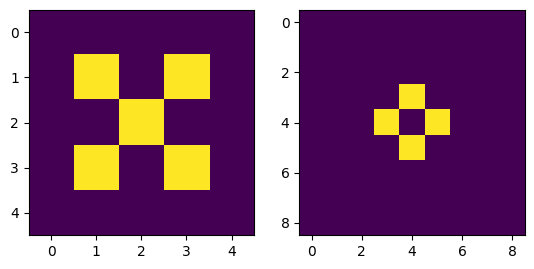

...

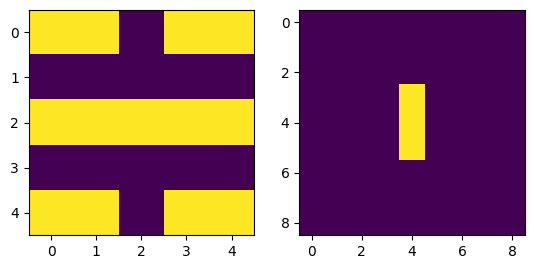

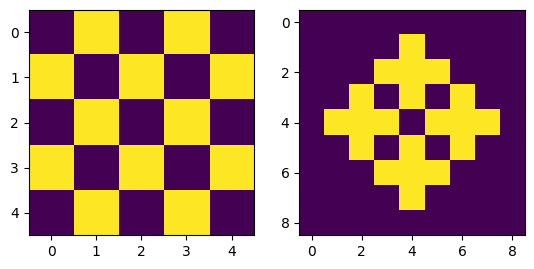

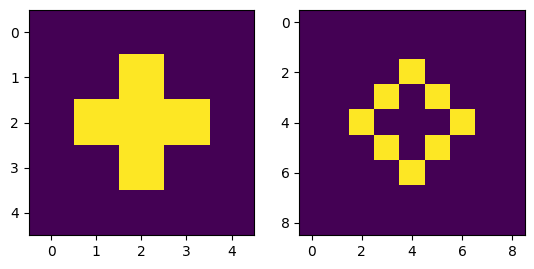

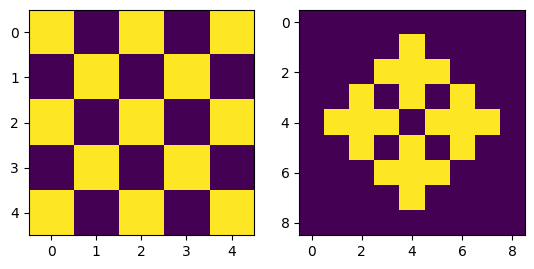

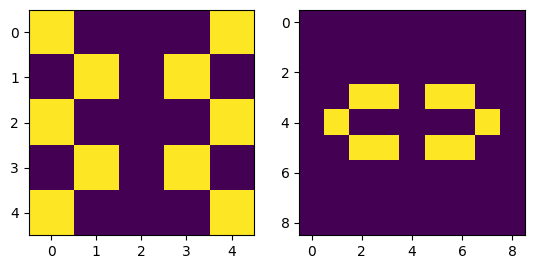

In [39]:
for xi, yi in zip(X_train, y_train):
  fig, axes = plt.subplots(1,2)
  axes[0].imshow(xi)
  axes[1].imshow(yi)
  plt.show()

## Building the model

In [40]:
class RecursiveModel(tf.keras.models.Model):
    def __init__(self, core_model, n_times, **kwargs):
        super().__init__(**kwargs)
        self.core_model = core_model
        self.n_times = n_times

    def call(self, inputs):
        x = inputs
        for _ in range(self.n_times):
            x = self.core_model(x)
        return x

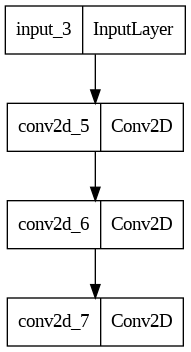

In [52]:
n_steps = 2
n_filters = 8
kernel_size = (3, 3)
n_categories = kernel_size[0] * kernel_size[1] * n_filters
input_shape = (None, None, 1)


input_layer = tf.keras.layers.Input(shape=input_shape)

conv2d_layer = tf.keras.layers.Conv2D(
    filters=n_filters,
    kernel_size=kernel_size,
    activation='sigmoid',
    padding='same',
    use_bias=True
    )(input_layer)


intermediate_conv2d_layer = tf.keras.layers.Conv2D(
    filters=n_categories,
    kernel_size=(1,1),
    activation='sigmoid',
    padding='same',
    use_bias=True
    )(conv2d_layer)


output_layer = tf.keras.layers.Conv2D(
    filters=1,
    kernel_size=(1,1),
    activation='sigmoid',
    use_bias=True
    )(intermediate_conv2d_layer)

model = tf.keras.models.Model(inputs=input_layer, outputs=output_layer)

# rmsprop = tf.keras.optimizers.RMSprop(learning_rate=0.025)
# adam = tf.keras.optimizers.Adam(learning_rate=0.025)
# model.compile(optimizer=adam, loss='mse')
tf.keras.utils.plot_model(model)

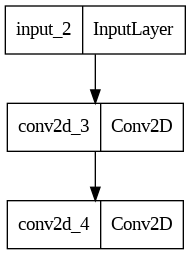

In [42]:
n_steps = 2
n_filters = 2
kernel_size = (3, 3)
input_shape = (None, None, 1)


input_layer = tf.keras.layers.Input(shape=input_shape)

conv2d_layer = tf.keras.layers.Conv2D(
    filters=n_filters,
    kernel_size=kernel_size,
    activation='sigmoid',
    padding='same',
    use_bias=True
    )(input_layer)

output_layer = tf.keras.layers.Conv2D(
    filters=1,
    kernel_size=(1,1),
    activation='sigmoid',
    use_bias=True
    )(conv2d_layer)

model = tf.keras.models.Model(inputs=input_layer, outputs=output_layer)

# rmsprop = tf.keras.optimizers.RMSprop(learning_rate=0.025)
# adam = tf.keras.optimizers.Adam(learning_rate=0.025)
# model.compile(optimizer=adam, loss='mse')
tf.keras.utils.plot_model(model)

In [53]:
recursive_model = RecursiveModel(core_model=model, n_times=2)

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

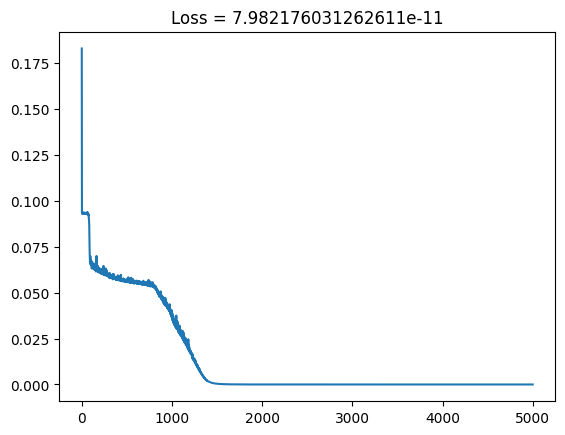

In [54]:
adam = tf.keras.optimizers.Adam(learning_rate=0.0025)
recursive_model.compile(optimizer=adam, loss='mse')

history = recursive_model.fit(
    X_train_ready,
    y_train_ready,
    epochs=5000,
    batch_size=1,
    verbose=False,
    callbacks=[TqdmCallback(verbose=True)]
)

losses = history.history['loss']
plt.title(f'Loss = {losses[-1]}')
plt.plot(losses)

1/1 [==============================] - 0s 47ms/step


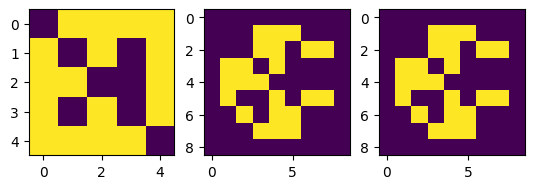

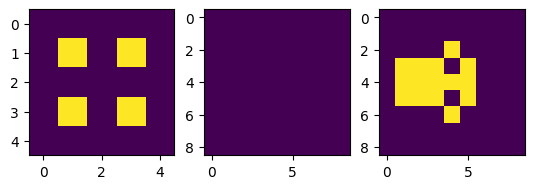

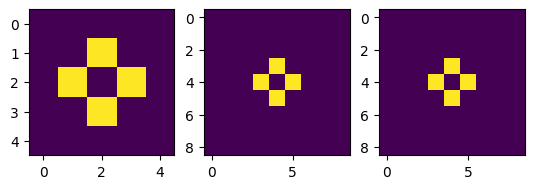

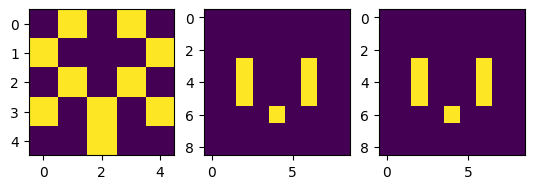

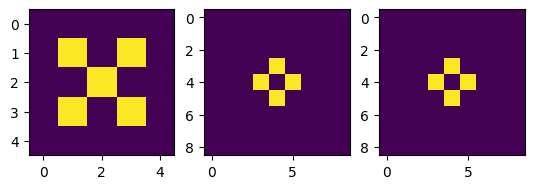

...

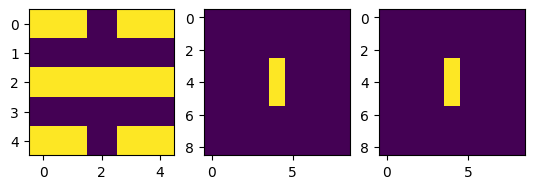

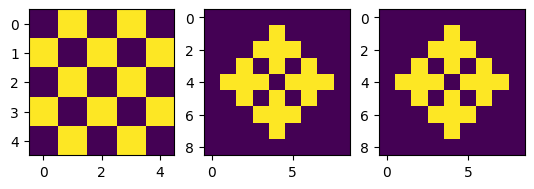

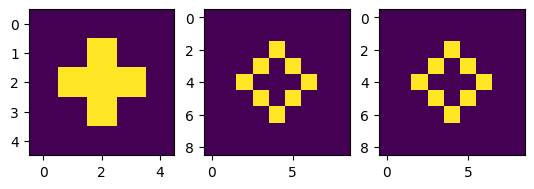

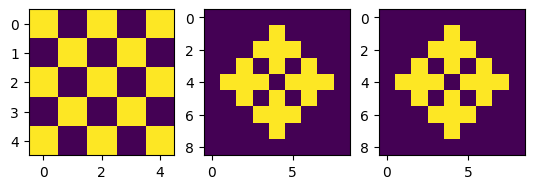

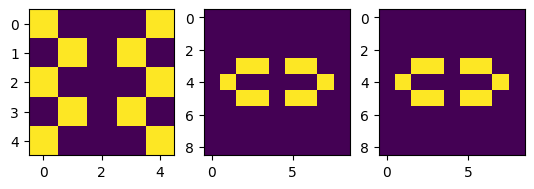

In [56]:
y_train_pred = recursive_model.predict(X_train_ready)
for xti, yti, ytpi in zip(X_train, y_train, y_train_pred):
  fig, axes = plt.subplots(1,3)
  axes[0].imshow(xti)
  axes[1].imshow(yti)
  axes[2].imshow(ytpi)
  plt.show()

1/1 [==============================] - 0s 140ms/step


<Figure size 2500x2500 with 0 Axes>

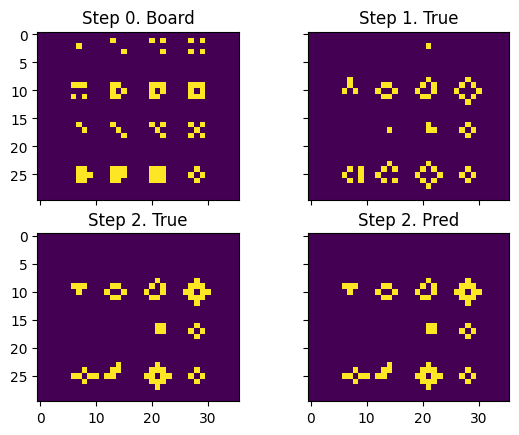

In [57]:
y_pred2 = recursive_model.predict(np.array(X_test)[None, ..., None])

plt.figure(figsize=(25,25))
fig, axes = plt.subplots(2, 2, sharey=True, sharex=True)

axes[0][0].set_title('Step 0. Board')
axes[0][0].imshow(X_test)

axes[0][1].set_title('Step 1. True')
axes[0][1].imshow(y_test)

axes[1][0].set_title('Step 2. True')
axes[1][0].imshow(y_test2)

axes[1][1].set_title('Step 2. Pred')
axes[1][1].imshow(
    y_pred2.reshape(X_test.shape[0], X_test.shape[1]))

plt.show()

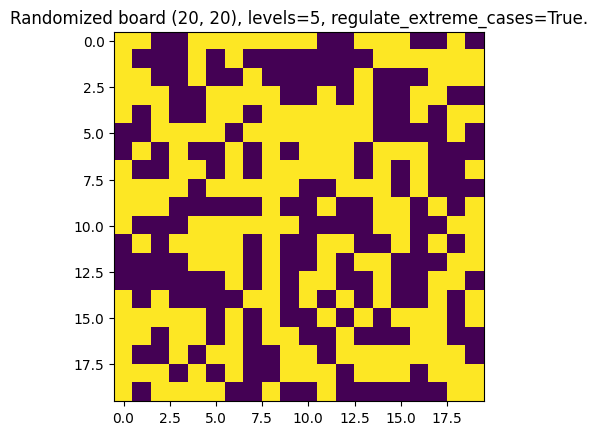

In [61]:
X_test = generate_board((20, 20), show=True, regulate_extreme_cases=True)

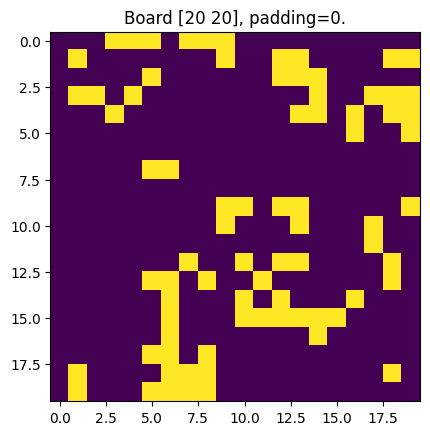

In [62]:
y_test = play(play(X_test), show=True)

1/1 [==============================] - 0s 120ms/step


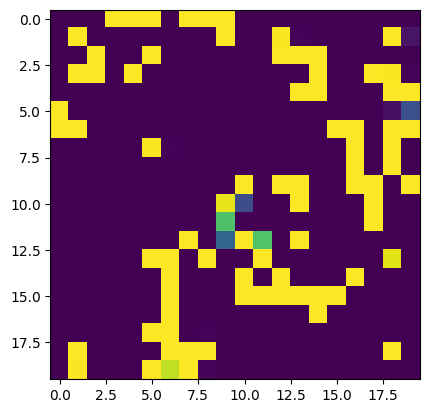

In [63]:
y_pred = recursive_model.predict(np.array(X_test)[None, ..., None])
y_pred = y_pred.squeeze()  # y_pred.reshape(X_test.shape[0], X_test.shape[1])
plt.imshow(y_pred)

# Re-check Recursive CLEAN: 9) Conv Minimal

##❌ x8 ReLU Conv with intermediate conv (instead of categorical)

In [ ]:
class RecursiveModel(tf.keras.models.Model):
    def __init__(self, core_model, n_times, **kwargs):
        super().__init__(**kwargs)
        self.core_model = core_model
        self.n_times = n_times

    def call(self, inputs):
        x = inputs
        for _ in range(self.n_times):
            x = self.core_model(x)
        return x

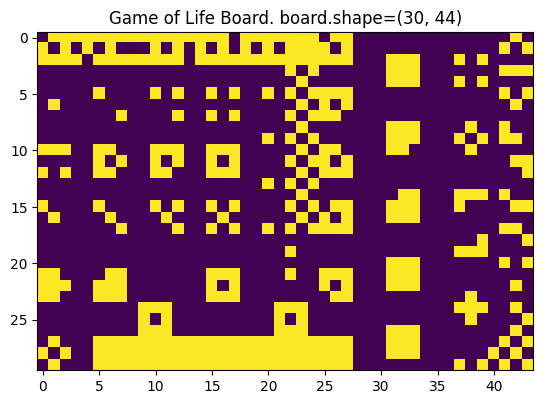

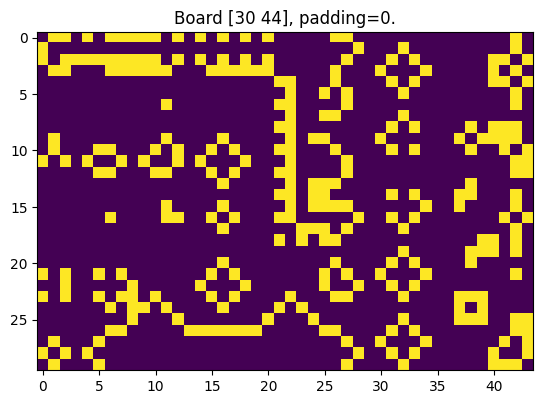

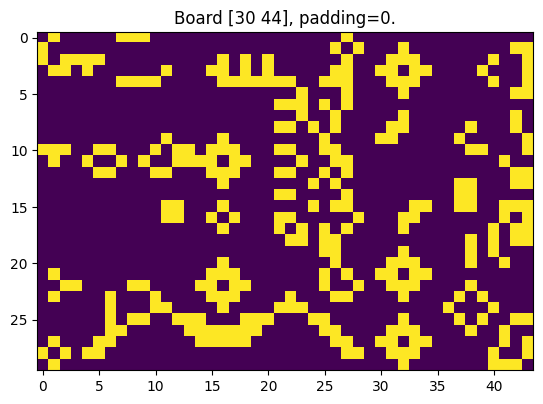

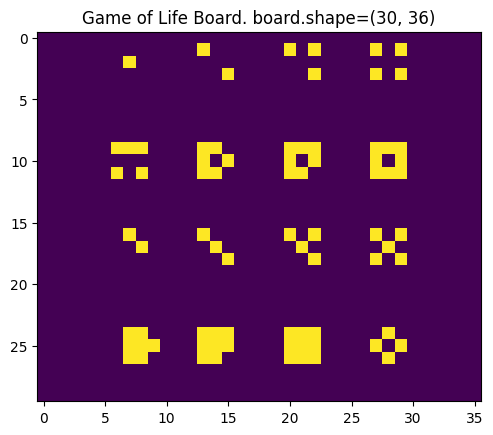

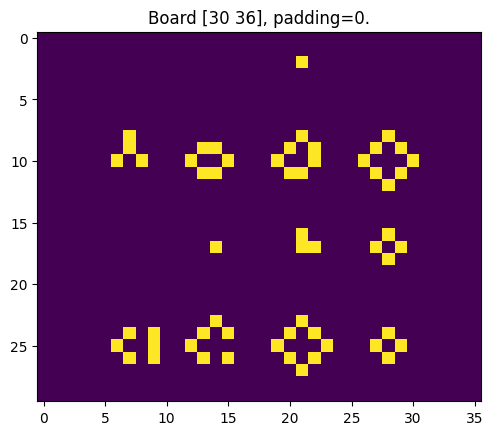

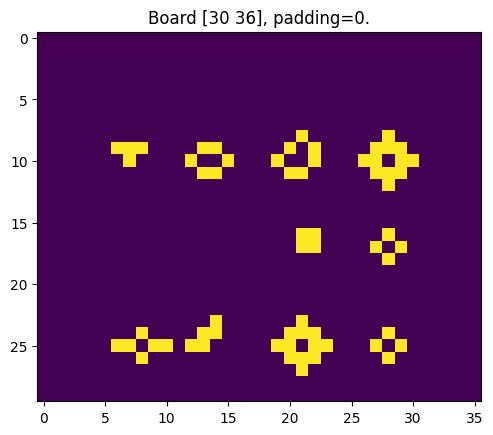

In [ ]:
X_train = load_board(sheet_name='Training_Board7', show=True)
y_train2 = play_n_steps(X_train, 2, show=True)
X_test = load_board(sheet_name='Test_Board5', show=True)
y_test = play(X_test)
y_test2 = play_n_steps(X_test, 2, show=True)

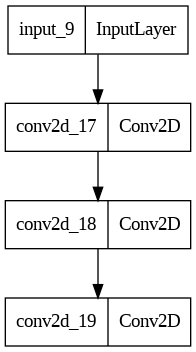

In [ ]:
n_steps = 2
n_filters = 8
kernel_size = (3, 3)
n_categories = kernel_size[0] * kernel_size[1] * n_filters
input_shape = (None, None, 1)


input_layer = tf.keras.layers.Input(shape=input_shape)

conv2d_layer = tf.keras.layers.Conv2D(
    filters=n_filters,
    kernel_size=kernel_size,
    activation='relu',
    padding='same',
    )(input_layer)

intermediate_conv2d_layer = tf.keras.layers.Conv2D(
    filters=n_categories,
    kernel_size=(1,1),
    activation='relu',
    padding='same',
    )(conv2d_layer)

output_layer = tf.keras.layers.Conv2D(
    filters=1,
    kernel_size=(1,1),
    activation='relu',
    use_bias=True
    )(intermediate_conv2d_layer)

model = tf.keras.models.Model(inputs=input_layer, outputs=output_layer)

# rmsprop = tf.keras.optimizers.RMSprop(learning_rate=0.025)
# adam = tf.keras.optimizers.Adam(learning_rate=0.025)
# model.compile(optimizer=adam, loss='mse')
tf.keras.utils.plot_model(model)

In [ ]:
model.summary()

Model: "model_8"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_9 (InputLayer)        [(None, None, None, 1)]   0         
                                                                 
 conv2d_17 (Conv2D)          (None, None, None, 8)     80        
                                                                 
 conv2d_18 (Conv2D)          (None, None, None, 72)    648       
                                                                 
 conv2d_19 (Conv2D)          (None, None, None, 1)     73        
                                                                 
Total params: 801
Trainable params: 801
Non-trainable params: 0
_________________________________________________________________


In [ ]:
recursive_model = RecursiveModel(core_model=model, n_times=2)

In [ ]:
X_train_ready = np.array(X_train)[None, ..., None]
y_train2_ready = np.array(y_train2)[None, ...]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

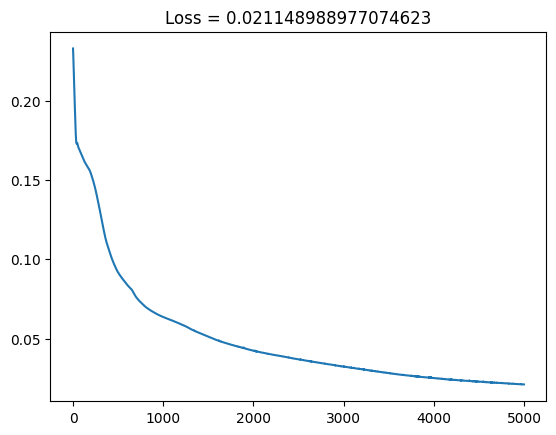

In [ ]:
adam = tf.keras.optimizers.Adam(learning_rate=0.0005)
recursive_model.compile(optimizer=adam, loss='mse')

history = recursive_model.fit(
    X_train_ready,
    y_train2_ready,
    epochs=5000,
    batch_size=1,
    verbose=False,
    callbacks=[TqdmCallback(verbose=True)]
)

losses = history.history['loss']
plt.title(f'Loss = {losses[-1]}')
plt.plot(losses)

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

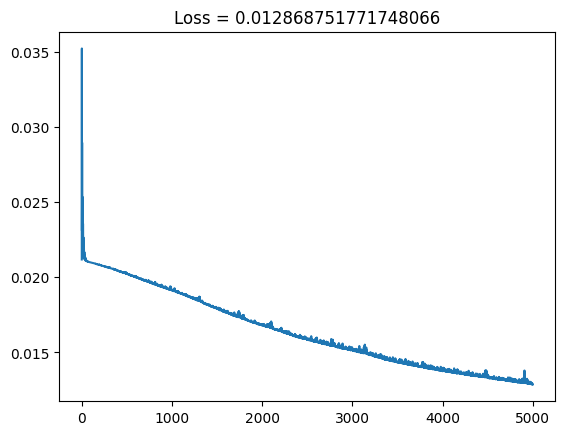

In [ ]:
adam = tf.keras.optimizers.Adam(learning_rate=0.0005)
recursive_model.compile(optimizer=adam, loss='mse')

history = recursive_model.fit(
    X_train_ready,
    y_train2_ready,
    epochs=5000,
    batch_size=1,
    verbose=False,
    callbacks=[TqdmCallback(verbose=True)]
)

losses = history.history['loss']
plt.title(f'Loss = {losses[-1]}')
plt.plot(losses)

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

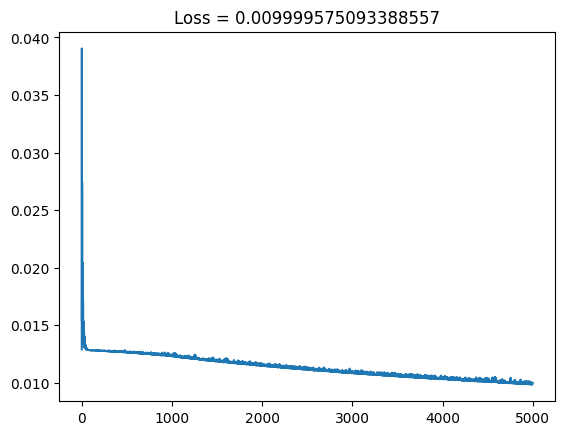

In [ ]:
adam = tf.keras.optimizers.Adam(learning_rate=0.0005)
recursive_model.compile(optimizer=adam, loss='mse')

history = recursive_model.fit(
    X_train_ready,
    y_train2_ready,
    epochs=5000,
    batch_size=1,
    verbose=False,
    callbacks=[TqdmCallback(verbose=True)]
)

losses = history.history['loss']
plt.title(f'Loss = {losses[-1]}')
plt.plot(losses)

1/1 [==============================] - 0s 81ms/step


<Figure size 2500x2500 with 0 Axes>

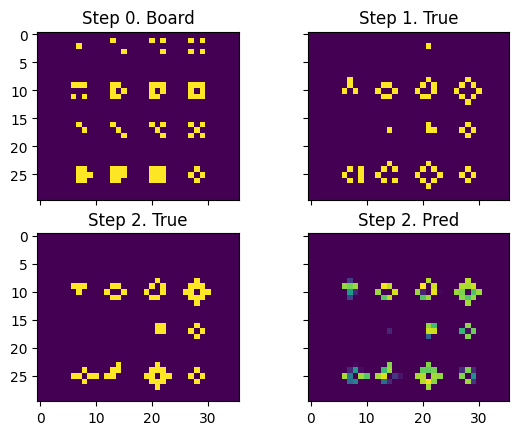

In [ ]:
y_pred2 = recursive_model.predict(np.array(X_test)[None, ..., None])
y_test2 = play_n_steps(X_test, 2, show=False)

plt.figure(figsize=(25,25))
fig, axes = plt.subplots(2, 2, sharey=True, sharex=True)

axes[0][0].set_title('Step 0. Board')
axes[0][0].imshow(X_test)

axes[0][1].set_title('Step 1. True')
axes[0][1].imshow(y_test)

axes[1][0].set_title('Step 2. True')
axes[1][0].imshow(y_test2)

axes[1][1].set_title('Step 2. Pred')
axes[1][1].imshow(
    y_pred2.reshape(X_test.shape[0], X_test.shape[1]))

plt.show()

In [ ]:
recursive_model.summary()

Model: "recursive_model_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 model_8 (Functional)        (None, None, None, 1)     801       
                                                                 
Total params: 801
Trainable params: 801
Non-trainable params: 0
_________________________________________________________________


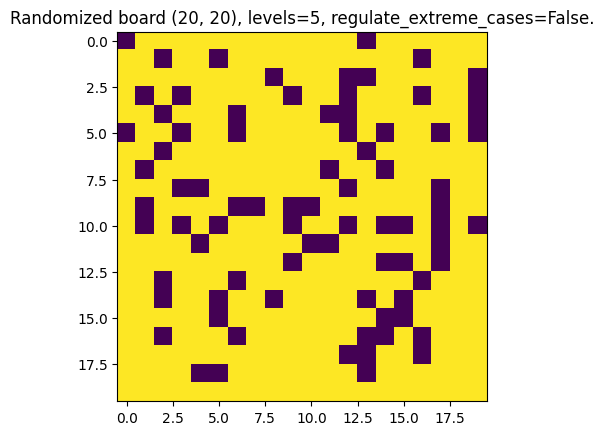

In [ ]:
X_test = generate_board((20, 20), show=True)

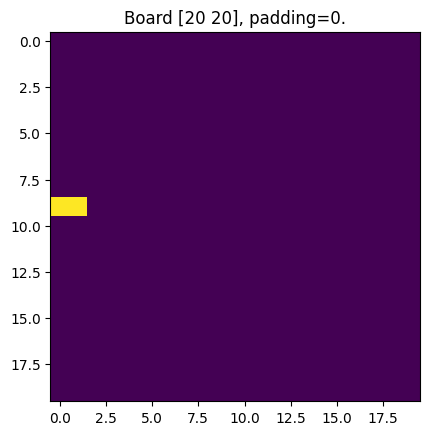

In [ ]:
y_test = play(play(X_test), show=True)

1/1 [==============================] - 0s 165ms/step


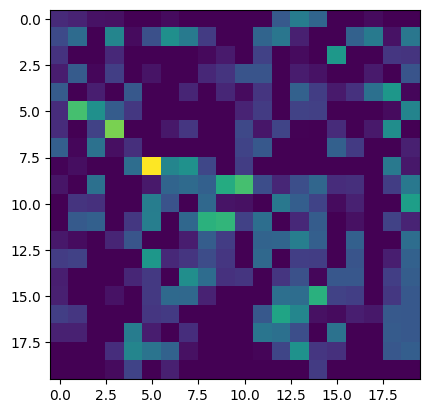

In [ ]:
y_pred = recursive_model.predict(np.array(X_test)[None, ..., None])
y_pred = y_pred.squeeze()  # y_pred.reshape(X_test.shape[0], X_test.shape[1])
plt.imshow(y_pred)

## ✅ x8 Sigmoid Conv with intermediate conv (instead of categorical)

In [ ]:
class RecursiveModel(tf.keras.models.Model):
    def __init__(self, core_model, n_times, **kwargs):
        super().__init__(**kwargs)
        self.core_model = core_model
        self.n_times = n_times

    def call(self, inputs):
        x = inputs
        for _ in range(self.n_times):
            x = self.core_model(x)
        return x

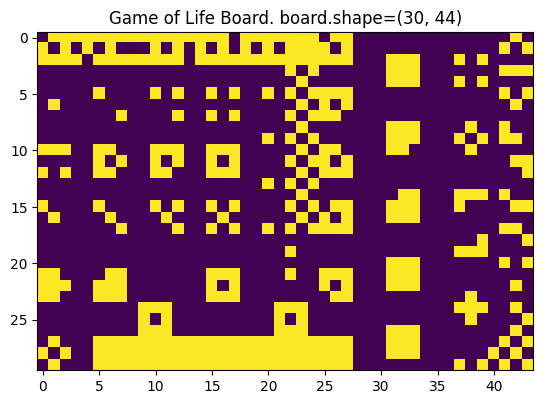

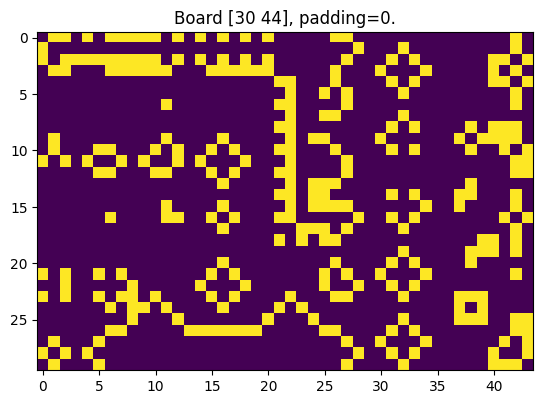

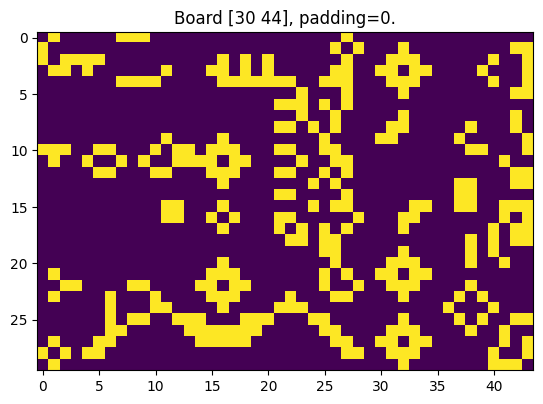

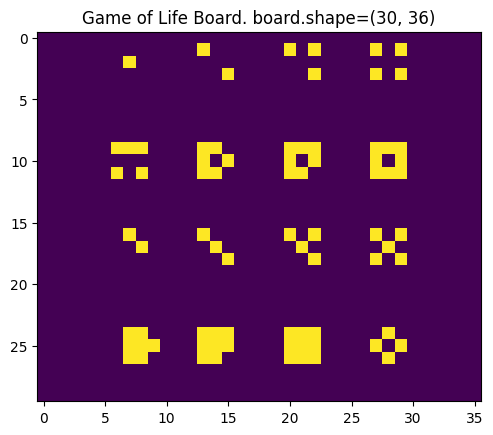

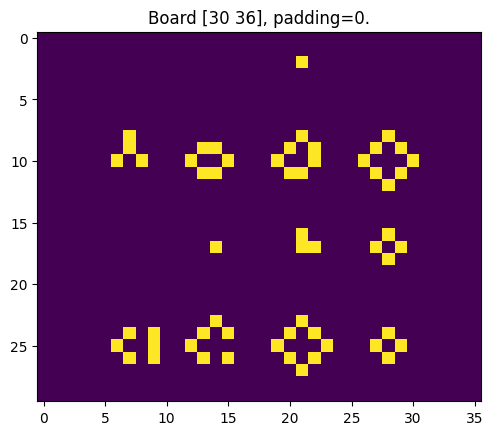

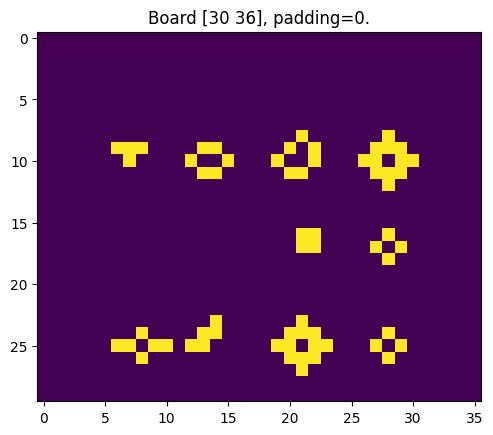

In [ ]:
X_train = load_board(sheet_name='Training_Board7', show=True)
y_train2 = play_n_steps(X_train, 2, show=True)
X_test = load_board(sheet_name='Test_Board5', show=True)
y_test = play(X_test)
y_test2 = play_n_steps(X_test, 2, show=True)

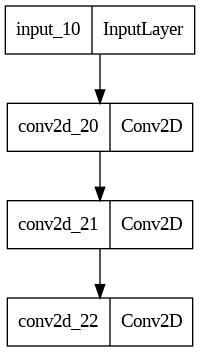

In [ ]:
n_steps = 2
n_filters = 8
kernel_size = (3, 3)
n_categories = kernel_size[0] * kernel_size[1] * n_filters
input_shape = (None, None, 1)


input_layer = tf.keras.layers.Input(shape=input_shape)

conv2d_layer = tf.keras.layers.Conv2D(
    filters=n_filters,
    kernel_size=kernel_size,
    activation='sigmoid',
    padding='same',
    )(input_layer)

intermediate_conv2d_layer = tf.keras.layers.Conv2D(
    filters=n_categories,
    kernel_size=(1,1),
    activation='sigmoid',
    padding='same',
    )(conv2d_layer)

output_layer = tf.keras.layers.Conv2D(
    filters=1,
    kernel_size=(1,1),
    activation='sigmoid',
    use_bias=True
    )(intermediate_conv2d_layer)

model = tf.keras.models.Model(inputs=input_layer, outputs=output_layer)

# rmsprop = tf.keras.optimizers.RMSprop(learning_rate=0.025)
# adam = tf.keras.optimizers.Adam(learning_rate=0.025)
# model.compile(optimizer=adam, loss='mse')
tf.keras.utils.plot_model(model)

In [ ]:
model.summary()

Model: "model_9"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_10 (InputLayer)       [(None, None, None, 1)]   0         
                                                                 
 conv2d_20 (Conv2D)          (None, None, None, 8)     80        
                                                                 
 conv2d_21 (Conv2D)          (None, None, None, 72)    648       
                                                                 
 conv2d_22 (Conv2D)          (None, None, None, 1)     73        
                                                                 
Total params: 801
Trainable params: 801
Non-trainable params: 0
_________________________________________________________________


In [ ]:
recursive_model = RecursiveModel(core_model=model, n_times=2)

In [ ]:
X_train_ready = np.array(X_train)[None, ..., None]
y_train2_ready = np.array(y_train2)[None, ...]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

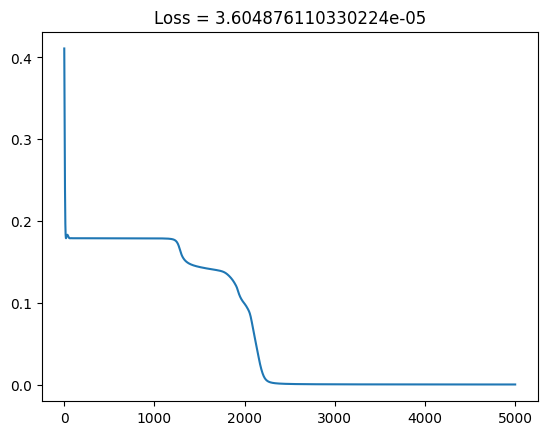

In [ ]:
adam = tf.keras.optimizers.Adam(learning_rate=0.0025)
recursive_model.compile(optimizer=adam, loss='mse')

history = recursive_model.fit(
    X_train_ready,
    y_train2_ready,
    epochs=5000,
    batch_size=1,
    verbose=False,
    callbacks=[TqdmCallback(verbose=True)]
)

losses = history.history['loss']
plt.title(f'Loss = {losses[-1]}')
plt.plot(losses)

1/1 [==============================] - 0s 88ms/step


<Figure size 2500x2500 with 0 Axes>

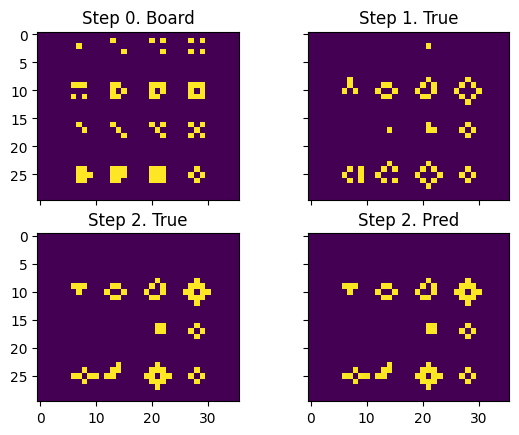

In [ ]:
y_pred2 = recursive_model.predict(np.array(X_test)[None, ..., None])
y_test2 = play_n_steps(X_test, 2, show=False)

plt.figure(figsize=(25,25))
fig, axes = plt.subplots(2, 2, sharey=True, sharex=True)

axes[0][0].set_title('Step 0. Board')
axes[0][0].imshow(X_test)

axes[0][1].set_title('Step 1. True')
axes[0][1].imshow(y_test)

axes[1][0].set_title('Step 2. True')
axes[1][0].imshow(y_test2)

axes[1][1].set_title('Step 2. Pred')
axes[1][1].imshow(
    y_pred2.reshape(X_test.shape[0], X_test.shape[1]))

plt.show()

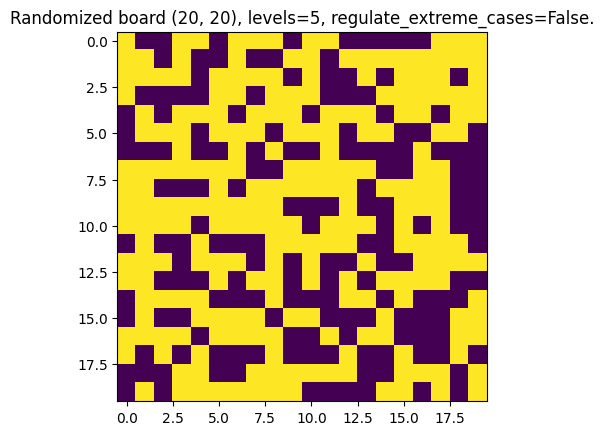

In [ ]:
X_test = generate_board((20, 20), show=True)

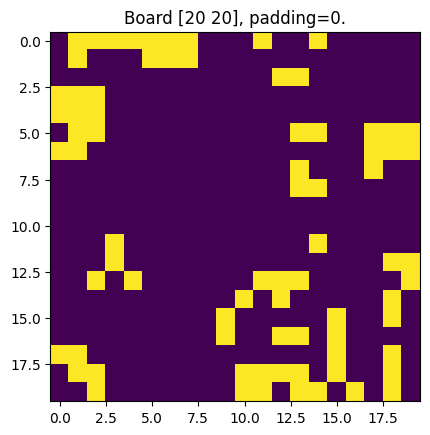

In [ ]:
y_test = play(play(X_test), show=True)

1/1 [==============================] - 0s 81ms/step


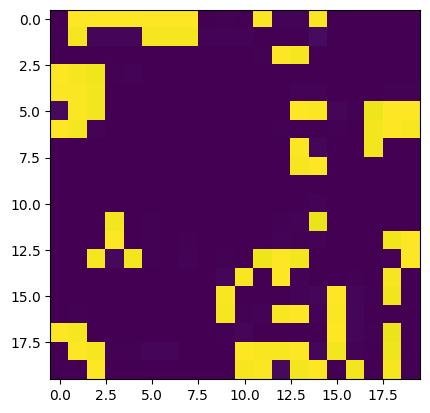

In [ ]:
y_pred = recursive_model.predict(np.array(X_test)[None, ..., None])
y_pred = y_pred.squeeze()  # y_pred.reshape(X_test.shape[0], X_test.shape[1])
plt.imshow(y_pred)

##❌ x2 Sigmoid Conv with intermediate conv (instead of categorical)

In [ ]:
class RecursiveModel(tf.keras.models.Model):
    def __init__(self, core_model, n_times, **kwargs):
        super().__init__(**kwargs)
        self.core_model = core_model
        self.n_times = n_times

    def call(self, inputs):
        x = inputs
        for _ in range(self.n_times):
            x = self.core_model(x)
        return x

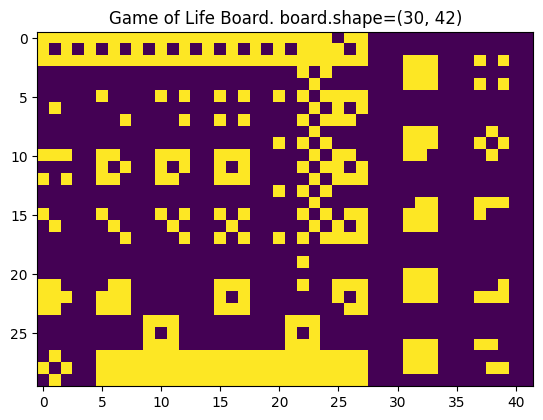

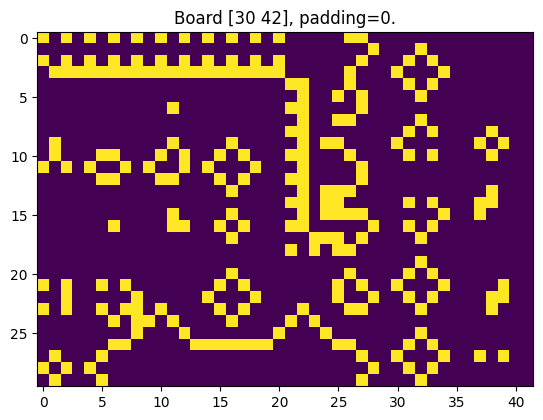

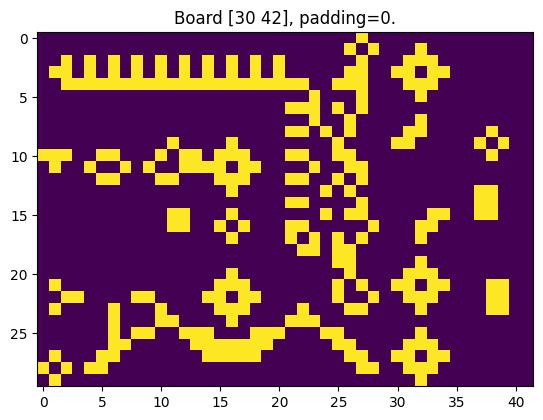

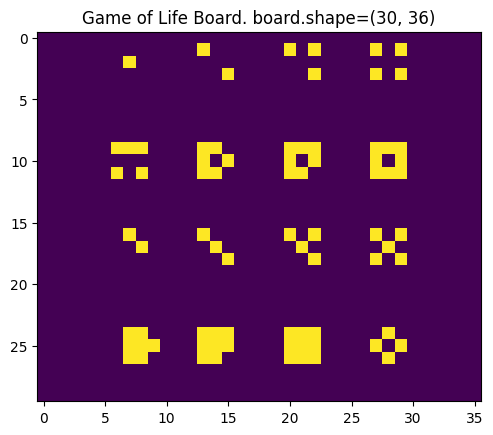

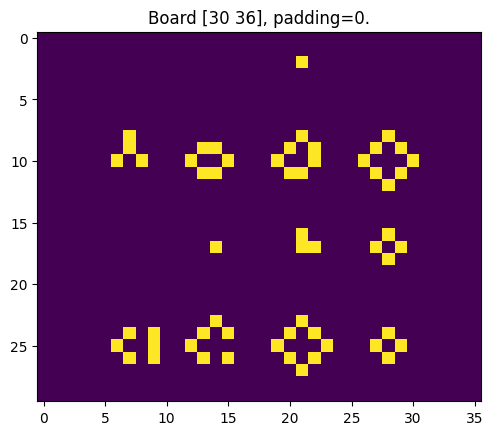

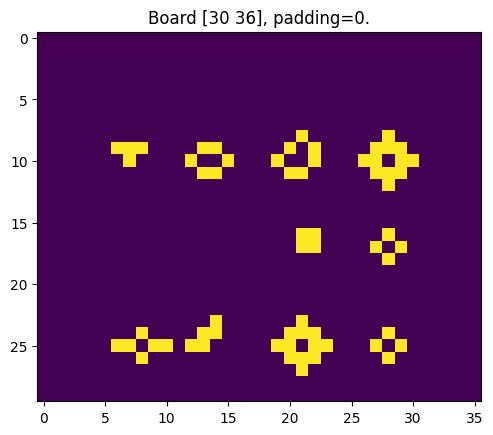

In [ ]:
X_train = load_board(sheet_name='Training_Board6', show=True)
y_train2 = play_n_steps(X_train, 2, show=True)
X_test = load_board(sheet_name='Test_Board5', show=True)
y_test = play(X_test)
y_test2 = play_n_steps(X_test, 2, show=True)

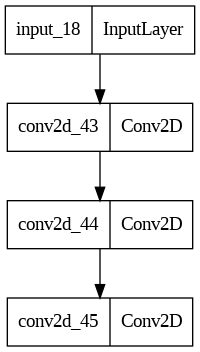

In [ ]:
n_steps = 2
n_filters = 2
kernel_size = (3, 3)
n_categories = kernel_size[0] * kernel_size[1] * n_filters
input_shape = (None, None, 1)


input_layer = tf.keras.layers.Input(shape=input_shape)

conv2d_layer = tf.keras.layers.Conv2D(
    filters=n_filters,
    kernel_size=kernel_size,
    activation='sigmoid',
    padding='same',
    )(input_layer)

intermediate_conv2d_layer = tf.keras.layers.Conv2D(
    filters=n_categories,
    kernel_size=(1,1),
    activation='sigmoid',
    padding='same',
    )(conv2d_layer)

output_layer = tf.keras.layers.Conv2D(
    filters=1,
    kernel_size=(1,1),
    activation='sigmoid',
    use_bias=True
    )(intermediate_conv2d_layer)

model = tf.keras.models.Model(inputs=input_layer, outputs=output_layer)

# rmsprop = tf.keras.optimizers.RMSprop(learning_rate=0.025)
# adam = tf.keras.optimizers.Adam(learning_rate=0.025)
# model.compile(optimizer=adam, loss='mse')
tf.keras.utils.plot_model(model)

In [ ]:
model.summary()

Model: "model_16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_18 (InputLayer)       [(None, None, None, 1)]   0         
                                                                 
 conv2d_43 (Conv2D)          (None, None, None, 2)     20        
                                                                 
 conv2d_44 (Conv2D)          (None, None, None, 18)    54        
                                                                 
 conv2d_45 (Conv2D)          (None, None, None, 1)     19        
                                                                 
Total params: 93
Trainable params: 93
Non-trainable params: 0
_________________________________________________________________


In [ ]:
recursive_model = RecursiveModel(core_model=model, n_times=2)

In [ ]:
X_train_ready = np.array(X_train)[None, ..., None]
y_train2_ready = np.array(y_train2)[None, ...]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

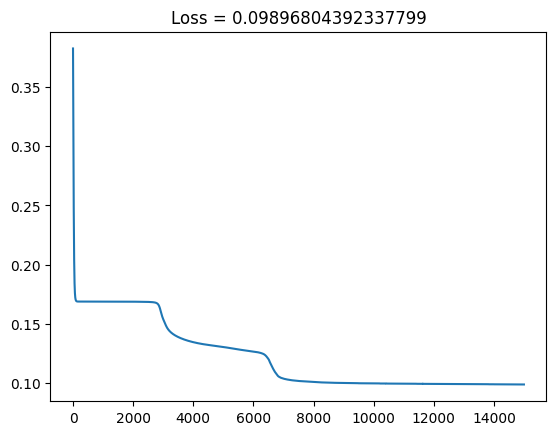

In [ ]:
adam = tf.keras.optimizers.Adam(learning_rate=0.0025)
recursive_model.compile(optimizer=adam, loss='mse')

history = recursive_model.fit(
    X_train_ready,
    y_train2_ready,
    epochs=15000,
    batch_size=1,
    verbose=False,
    callbacks=[TqdmCallback(verbose=True)]
)

losses = history.history['loss']
plt.title(f'Loss = {losses[-1]}')
plt.plot(losses)

1/1 [==============================] - 0s 100ms/step


<Figure size 2500x2500 with 0 Axes>

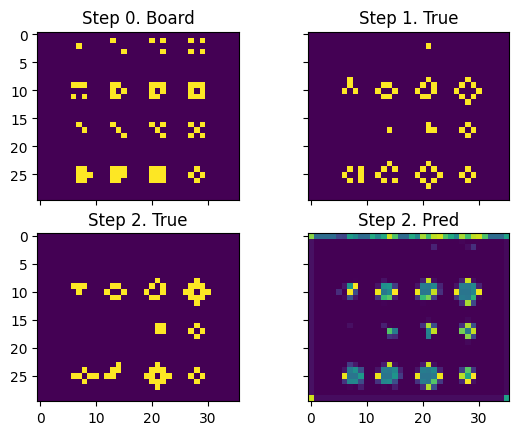

In [ ]:
y_pred2 = recursive_model.predict(np.array(X_test)[None, ..., None])
y_test2 = play_n_steps(X_test, 2, show=False)

plt.figure(figsize=(25,25))
fig, axes = plt.subplots(2, 2, sharey=True, sharex=True)

axes[0][0].set_title('Step 0. Board')
axes[0][0].imshow(X_test)

axes[0][1].set_title('Step 1. True')
axes[0][1].imshow(y_test)

axes[1][0].set_title('Step 2. True')
axes[1][0].imshow(y_test2)

axes[1][1].set_title('Step 2. Pred')
axes[1][1].imshow(
    y_pred2.reshape(X_test.shape[0], X_test.shape[1]))

plt.show()

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

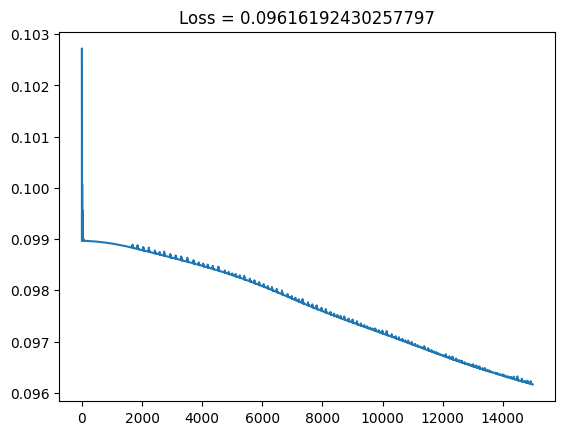

In [ ]:
adam = tf.keras.optimizers.Adam(learning_rate=0.0025)
recursive_model.compile(optimizer=adam, loss='mse')

history = recursive_model.fit(
    X_train_ready,
    y_train2_ready,
    epochs=15000,
    batch_size=1,
    verbose=False,
    callbacks=[TqdmCallback(verbose=True)]
)

losses = history.history['loss']
plt.title(f'Loss = {losses[-1]}')
plt.plot(losses)

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

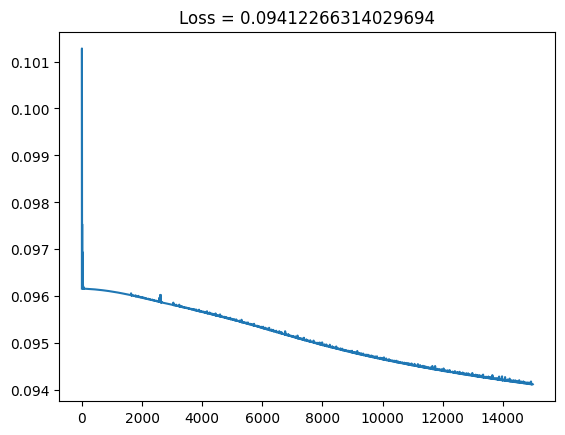

In [ ]:
adam = tf.keras.optimizers.Adam(learning_rate=0.0025)
recursive_model.compile(optimizer=adam, loss='mse')

history = recursive_model.fit(
    X_train_ready,
    y_train2_ready,
    epochs=15000,
    batch_size=1,
    verbose=False,
    callbacks=[TqdmCallback(verbose=True)]
)

losses = history.history['loss']
plt.title(f'Loss = {losses[-1]}')
plt.plot(losses)

1/1 [==============================] - 0s 84ms/step


<Figure size 2500x2500 with 0 Axes>

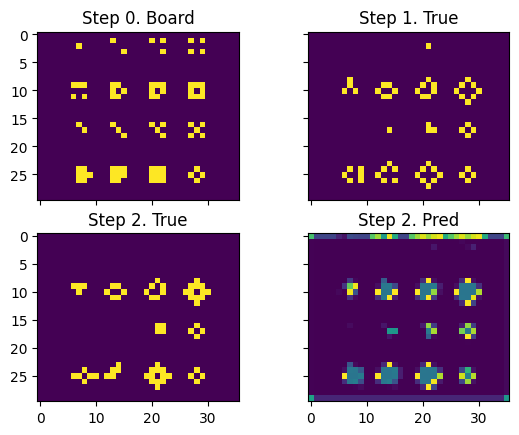

In [ ]:
y_pred2 = recursive_model.predict(np.array(X_test)[None, ..., None])
y_test2 = play_n_steps(X_test, 2, show=False)

plt.figure(figsize=(25,25))
fig, axes = plt.subplots(2, 2, sharey=True, sharex=True)

axes[0][0].set_title('Step 0. Board')
axes[0][0].imshow(X_test)

axes[0][1].set_title('Step 1. True')
axes[0][1].imshow(y_test)

axes[1][0].set_title('Step 2. True')
axes[1][0].imshow(y_test2)

axes[1][1].set_title('Step 2. Pred')
axes[1][1].imshow(
    y_pred2.reshape(X_test.shape[0], X_test.shape[1]))

plt.show()

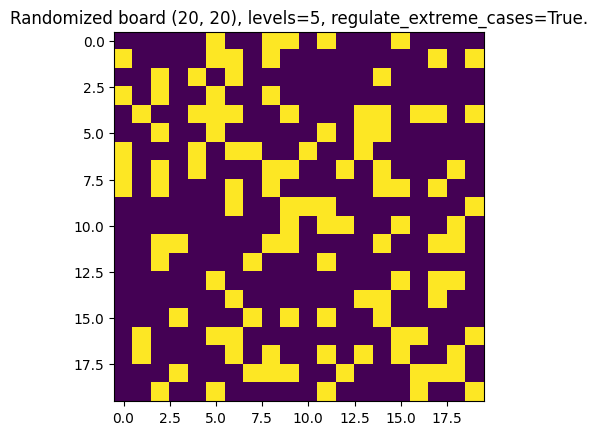

In [ ]:
X_test = generate_board((20, 20), show=True, regulate_extreme_cases=True)

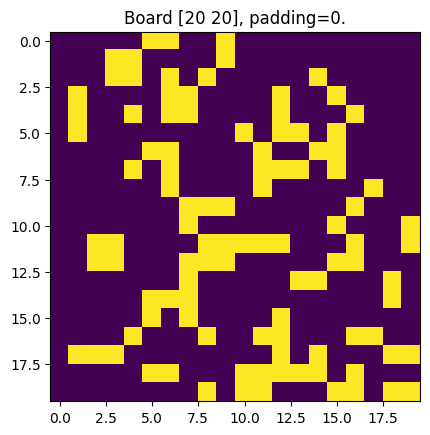

In [ ]:
y_test = play(play(X_test), show=True)

1/1 [==============================] - 0s 82ms/step


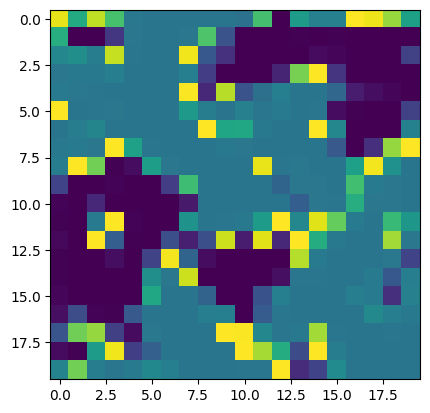

In [ ]:
y_pred = recursive_model.predict(np.array(X_test)[None, ..., None])
y_pred = y_pred.squeeze()  # y_pred.reshape(X_test.shape[0], X_test.shape[1])
plt.imshow(y_pred)

##✅ x4 Sigmoid Conv with intermediate conv (instead of categorical)

In [ ]:
class RecursiveModel(tf.keras.models.Model):
    def __init__(self, core_model, n_times, **kwargs):
        super().__init__(**kwargs)
        self.core_model = core_model
        self.n_times = n_times

    def call(self, inputs):
        x = inputs
        for _ in range(self.n_times):
            x = self.core_model(x)
        return x

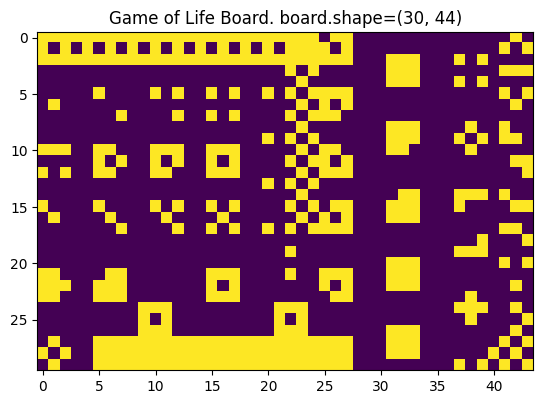

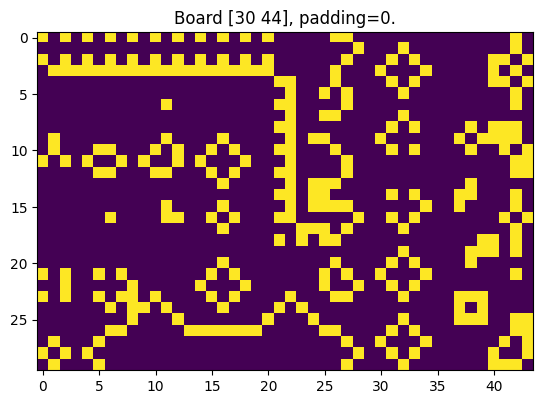

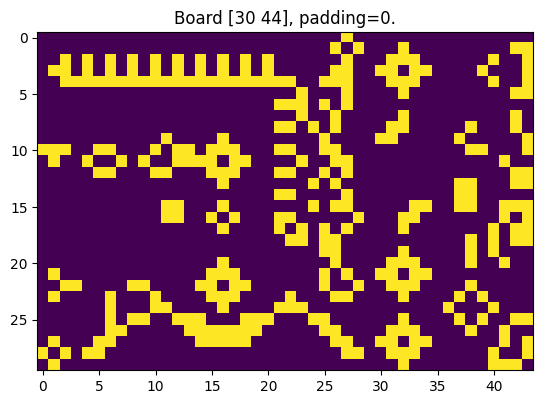

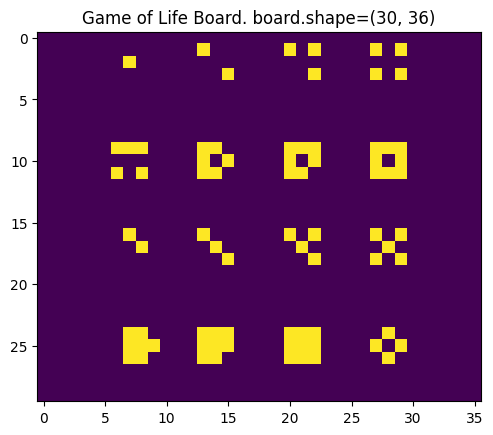

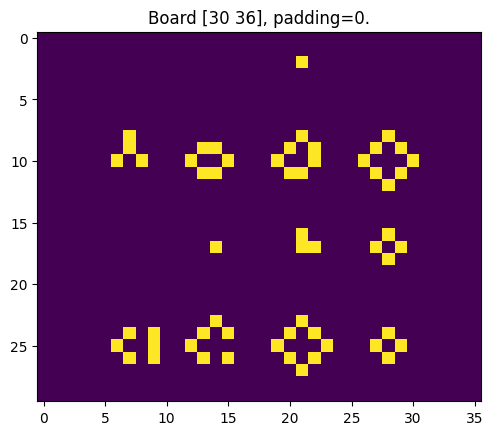

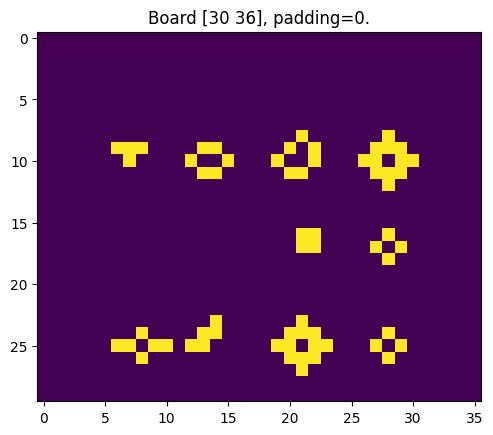

In [ ]:
X_train = load_board(sheet_name='Training_Board7', show=True)
y_train2 = play_n_steps(X_train, 2, show=True)
X_test = load_board(sheet_name='Test_Board5', show=True)
y_test = play(X_test)
y_test2 = play_n_steps(X_test, 2, show=True)

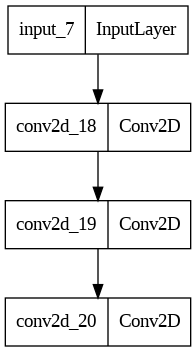

In [ ]:
n_steps = 2
n_filters = 4
kernel_size = (3, 3)
n_categories = kernel_size[0] * kernel_size[1] * n_filters
input_shape = (None, None, 1)


input_layer = tf.keras.layers.Input(shape=input_shape)
zero_padding_layer = tf.keras.layers.ZeroPadding2D()(input_layer)

conv2d_layer = tf.keras.layers.Conv2D(
    filters=n_filters,
    kernel_size=kernel_size,
    activation='sigmoid',
    padding='same',
    )(input_layer)

intermediate_conv2d_layer = tf.keras.layers.Conv2D(
    filters=n_categories,
    kernel_size=(1,1),
    activation='sigmoid',
    padding='same',
    )(conv2d_layer)

output_layer = tf.keras.layers.Conv2D(
    filters=1,
    kernel_size=(1,1),
    activation='sigmoid',
    use_bias=True
    )(intermediate_conv2d_layer)

model = tf.keras.models.Model(inputs=input_layer, outputs=output_layer)

# rmsprop = tf.keras.optimizers.RMSprop(learning_rate=0.025)
# adam = tf.keras.optimizers.Adam(learning_rate=0.025)
# model.compile(optimizer=adam, loss='mse')
tf.keras.utils.plot_model(model)

In [ ]:
model.summary()

Model: "model_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_7 (InputLayer)        [(None, None, None, 1)]   0         
                                                                 
 conv2d_18 (Conv2D)          (None, None, None, 4)     40        
                                                                 
 conv2d_19 (Conv2D)          (None, None, None, 36)    180       
                                                                 
 conv2d_20 (Conv2D)          (None, None, None, 1)     37        
                                                                 
Total params: 257
Trainable params: 257
Non-trainable params: 0
_________________________________________________________________


In [ ]:
recursive_model = RecursiveModel(core_model=model, n_times=2)

In [ ]:
X_train_ready = np.array(X_train)[None, ..., None]
y_train2_ready = np.array(y_train2)[None, ...]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

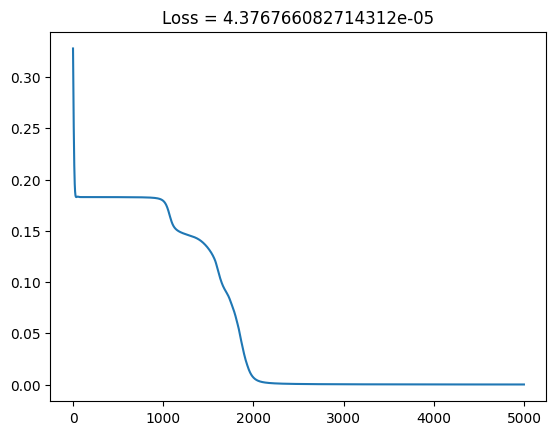

In [ ]:
adam = tf.keras.optimizers.Adam(learning_rate=0.0025)
recursive_model.compile(optimizer=adam, loss='mse')

history = recursive_model.fit(
    X_train_ready,
    y_train2_ready,
    epochs=5000,
    batch_size=1,
    verbose=False,
    callbacks=[TqdmCallback(verbose=True)]
)

losses = history.history['loss']
plt.title(f'Loss = {losses[-1]}')
plt.plot(losses)

1/1 [==============================] - 1s 669ms/step


<Figure size 2500x2500 with 0 Axes>

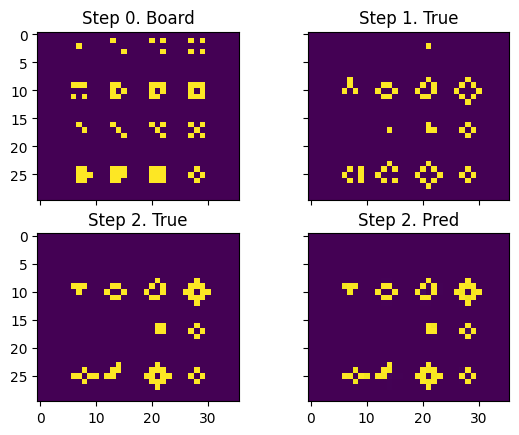

In [ ]:
y_pred2 = recursive_model.predict(np.array(X_test)[None, ..., None])
y_test2 = play_n_steps(X_test, 2, show=False)

plt.figure(figsize=(25,25))
fig, axes = plt.subplots(2, 2, sharey=True, sharex=True)

axes[0][0].set_title('Step 0. Board')
axes[0][0].imshow(X_test)

axes[0][1].set_title('Step 1. True')
axes[0][1].imshow(y_test)

axes[1][0].set_title('Step 2. True')
axes[1][0].imshow(y_test2)

axes[1][1].set_title('Step 2. Pred')
axes[1][1].imshow(
    y_pred2.reshape(X_test.shape[0], X_test.shape[1]))

plt.show()

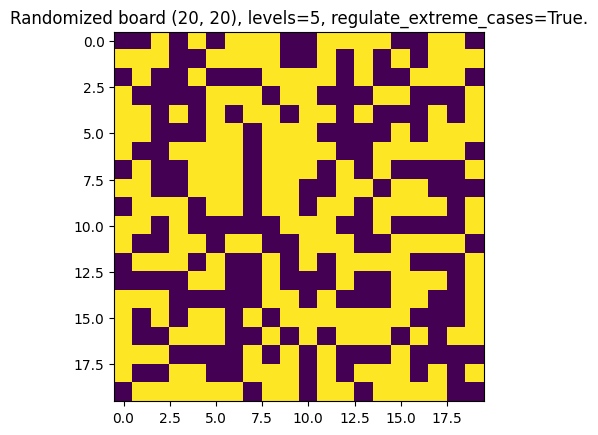

In [ ]:
X_test = generate_board((20, 20), show=True, regulate_extreme_cases=True)

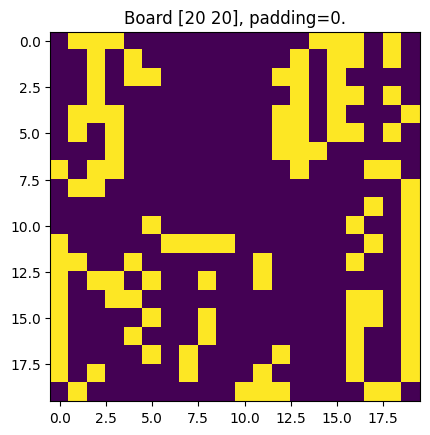

In [ ]:
y_test = play(play(X_test), show=True)

1/1 [==============================] - 0s 347ms/step


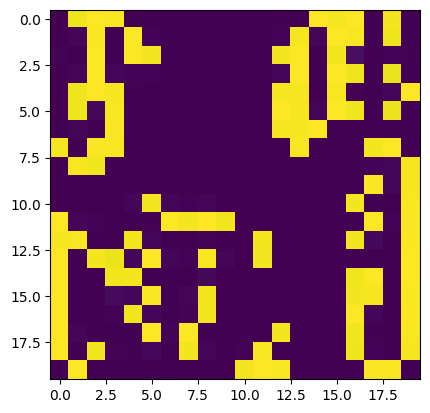

In [ ]:
y_pred = recursive_model.predict(np.array(X_test)[None, ..., None])
y_pred = y_pred.squeeze()  # y_pred.reshape(X_test.shape[0], X_test.shape[1])
plt.imshow(y_pred)

##✅ x2 Sigmoid Conv with intermediate 3x3 conv (instead of categorical)

In [ ]:
class RecursiveModel(tf.keras.models.Model):
    def __init__(self, core_model, n_times, **kwargs):
        super().__init__(**kwargs)
        self.core_model = core_model
        self.n_times = n_times

    def call(self, inputs):
        x = inputs
        for _ in range(self.n_times):
            x = self.core_model(x)
        return x

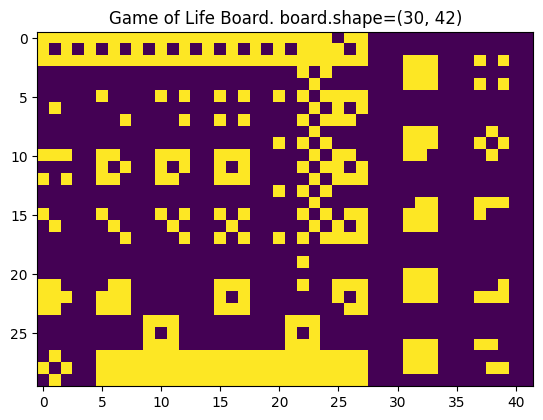

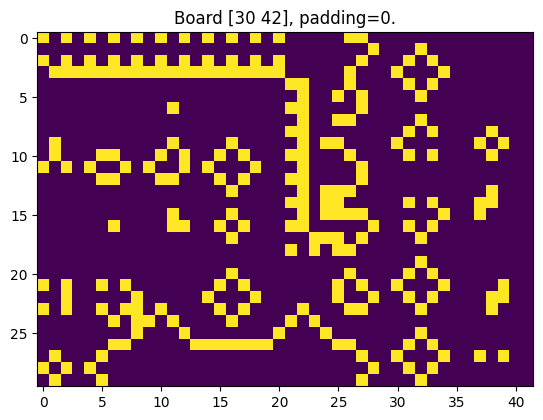

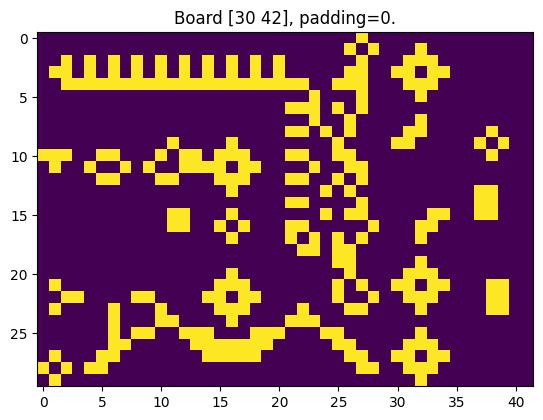

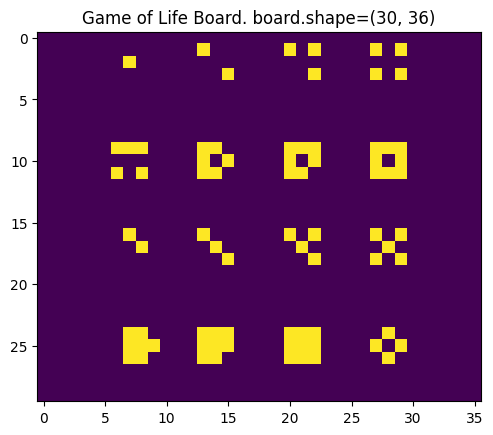

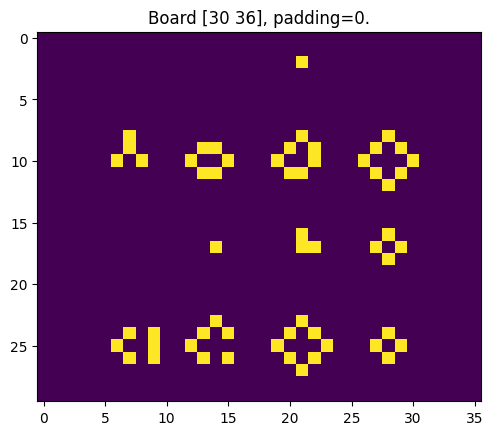

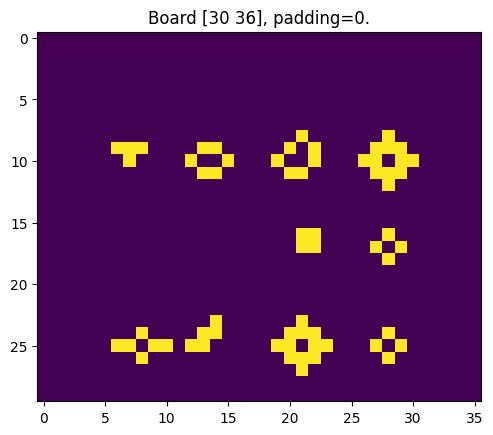

In [ ]:
X_train = load_board(sheet_name='Training_Board6', show=True)
y_train2 = play_n_steps(X_train, 2, show=True)
X_test = load_board(sheet_name='Test_Board5', show=True)
y_test = play(X_test)
y_test2 = play_n_steps(X_test, 2, show=True)

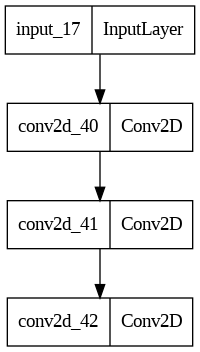

In [ ]:
n_steps = 2
n_filters = 2
kernel_size = (3, 3)
n_categories = kernel_size[0] * kernel_size[1] * n_filters
input_shape = (None, None, 1)


input_layer = tf.keras.layers.Input(shape=input_shape)
zero_padding_layer = tf.keras.layers.ZeroPadding2D()(input_layer)

conv2d_layer = tf.keras.layers.Conv2D(
    filters=n_filters,
    kernel_size=kernel_size,
    activation='sigmoid',
    padding='same',
    )(input_layer)

intermediate_conv2d_layer = tf.keras.layers.Conv2D(
    filters=n_categories,
    kernel_size=kernel_size,
    activation='sigmoid',
    padding='same',
    )(conv2d_layer)

output_layer = tf.keras.layers.Conv2D(
    filters=1,
    kernel_size=(1, 1),
    activation='sigmoid',
    use_bias=True
    )(intermediate_conv2d_layer)

model = tf.keras.models.Model(inputs=input_layer, outputs=output_layer)

# rmsprop = tf.keras.optimizers.RMSprop(learning_rate=0.025)
# adam = tf.keras.optimizers.Adam(learning_rate=0.025)
# model.compile(optimizer=adam, loss='mse')
tf.keras.utils.plot_model(model)

In [ ]:
model.summary()

Model: "model_15"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_17 (InputLayer)       [(None, None, None, 1)]   0         
                                                                 
 conv2d_40 (Conv2D)          (None, None, None, 2)     20        
                                                                 
 conv2d_41 (Conv2D)          (None, None, None, 18)    342       
                                                                 
 conv2d_42 (Conv2D)          (None, None, None, 1)     19        
                                                                 
Total params: 381
Trainable params: 381
Non-trainable params: 0
_________________________________________________________________


In [ ]:
recursive_model = RecursiveModel(core_model=model, n_times=2)

In [ ]:
X_train_ready = np.array(X_train)[None, ..., None]
y_train2_ready = np.array(y_train2)[None, ...]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

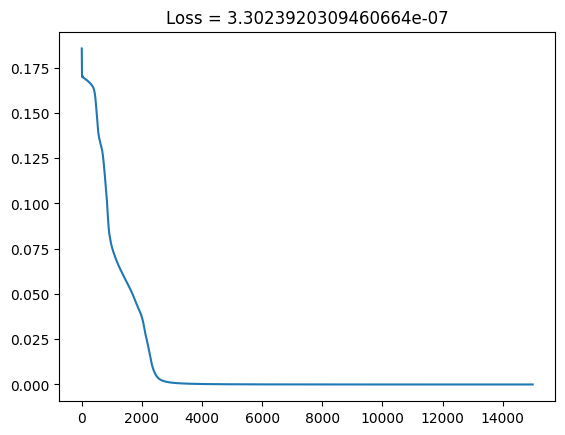

In [ ]:
adam = tf.keras.optimizers.Adam(learning_rate=0.0025)
recursive_model.compile(optimizer=adam, loss='mse')

history = recursive_model.fit(
    X_train_ready,
    y_train2_ready,
    epochs=15000,
    batch_size=1,
    verbose=False,
    callbacks=[TqdmCallback(verbose=True)]
)

losses = history.history['loss']
plt.title(f'Loss = {losses[-1]}')
plt.plot(losses)

1/1 [==============================] - 0s 185ms/step


<Figure size 2500x2500 with 0 Axes>

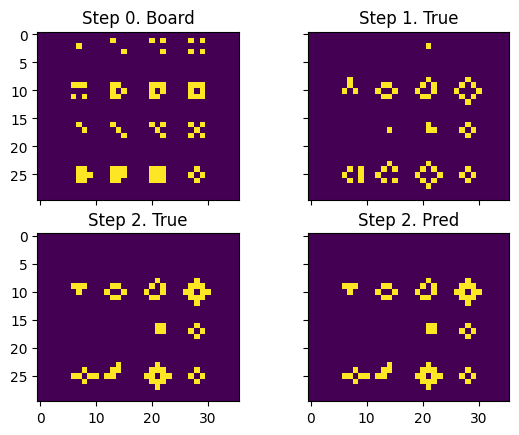

In [ ]:
y_pred2 = recursive_model.predict(np.array(X_test)[None, ..., None])
y_test2 = play_n_steps(X_test, 2, show=False)

plt.figure(figsize=(25,25))
fig, axes = plt.subplots(2, 2, sharey=True, sharex=True)

axes[0][0].set_title('Step 0. Board')
axes[0][0].imshow(X_test)

axes[0][1].set_title('Step 1. True')
axes[0][1].imshow(y_test)

axes[1][0].set_title('Step 2. True')
axes[1][0].imshow(y_test2)

axes[1][1].set_title('Step 2. Pred')
axes[1][1].imshow(
    y_pred2.reshape(X_test.shape[0], X_test.shape[1]))

plt.show()

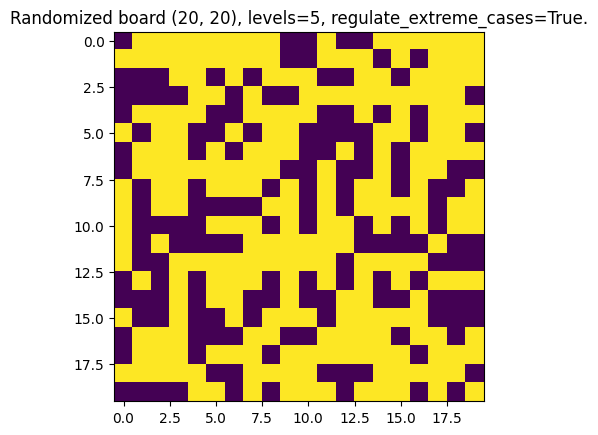

In [ ]:
X_test = generate_board((20, 20), show=True, regulate_extreme_cases=True)

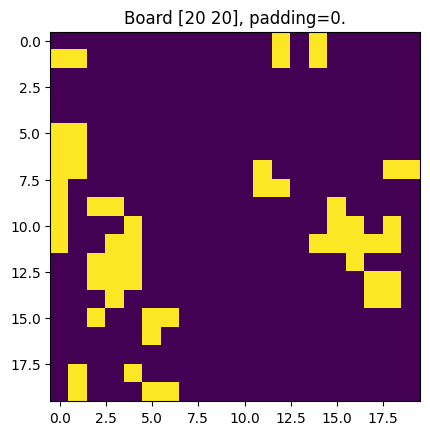

In [ ]:
y_test = play(play(X_test), show=True)

1/1 [==============================] - 0s 124ms/step


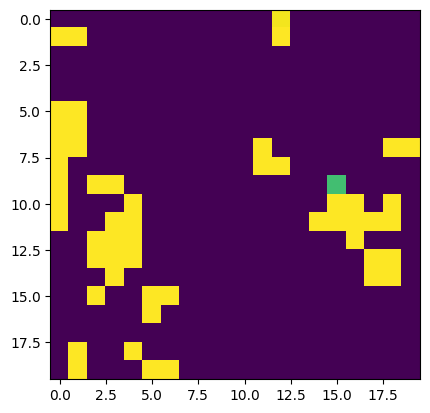

In [ ]:
y_pred = recursive_model.predict(np.array(X_test)[None, ..., None])
y_pred = y_pred.squeeze()  # y_pred.reshape(X_test.shape[0], X_test.shape[1])
plt.imshow(y_pred)

## x2 ReLU Conv Minimal

In [ ]:
class RecursiveModel(tf.keras.models.Model):
    def __init__(self, core_model, n_times, **kwargs):
        super().__init__(**kwargs)
        self.core_model = core_model
        self.n_times = n_times

    def call(self, inputs):
        x = inputs
        for _ in range(self.n_times):
            x = self.core_model(x)
        return x

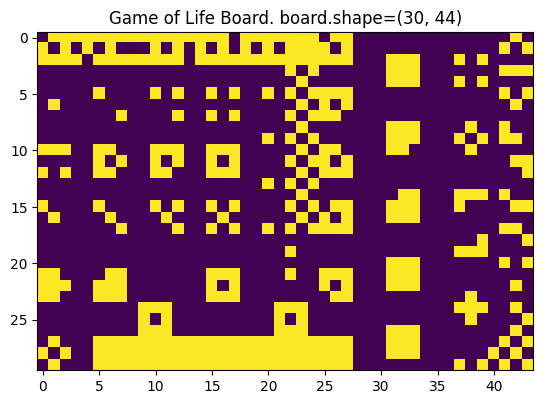

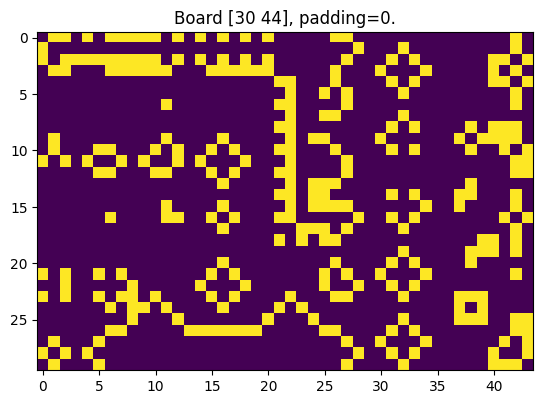

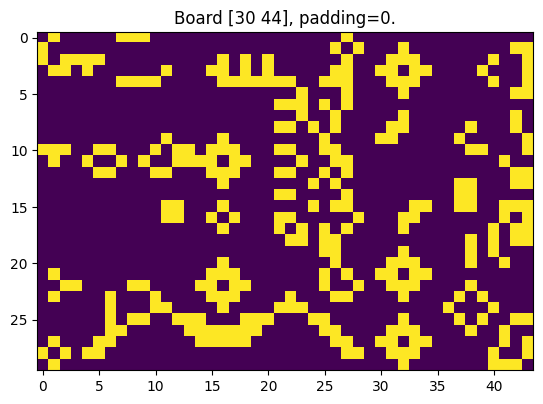

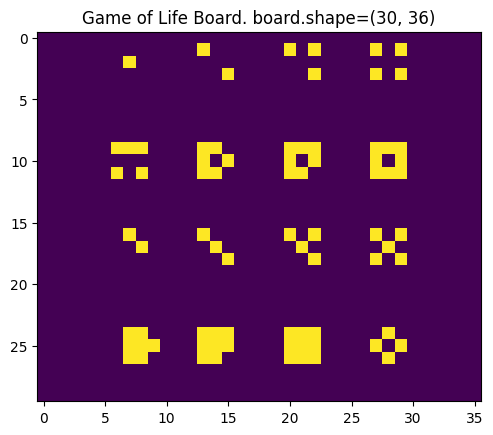

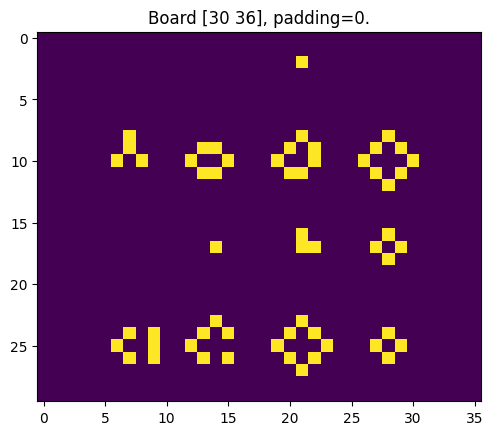

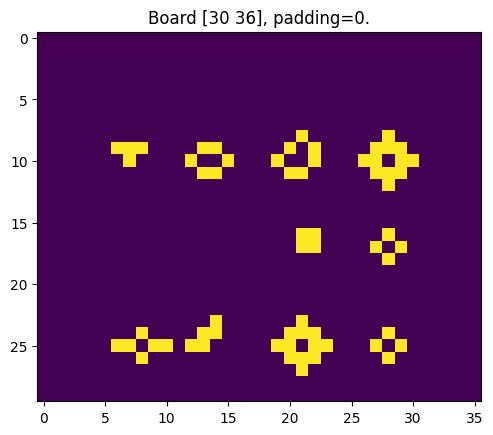

In [ ]:
X_train = load_board(sheet_name='Training_Board7', show=True)
y_train2 = play_n_steps(X_train, 2, show=True)
X_test = load_board(sheet_name='Test_Board5', show=True)
y_test = play(X_test)
y_test2 = play_n_steps(X_test, 2, show=True)

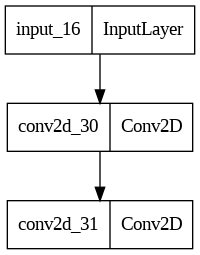

In [ ]:
# @title Minimal model
n_steps = 2
n_filters = 2
kernel_size = (3, 3)
input_shape = (None, None, 1)


input_layer = tf.keras.layers.Input(shape=input_shape)

conv2d_layer = tf.keras.layers.Conv2D(
    filters=n_filters,
    kernel_size=kernel_size,
    kernel_initializer=tf.keras.initializers.HeNormal(),
    bias_initializer=tf.keras.initializers.Constant(0),
    activation='relu',
    padding='same',
    )(input_layer)

output_layer = tf.keras.layers.Conv2D(
    filters=1,
    kernel_size=(1, 1),
    activation='relu',
    use_bias=True
    )(conv2d_layer)

model = tf.keras.models.Model(inputs=input_layer, outputs=output_layer)

# adam = tf.keras.optimizers.Adam(learning_rate=0.0025)
# model.compile(optimizer=adam, loss='mse')
tf.keras.utils.plot_model(model)

In [ ]:
model.summary()

Model: "model_15"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_16 (InputLayer)       [(None, None, None, 1)]   0         
                                                                 
 conv2d_30 (Conv2D)          (None, None, None, 2)     20        
                                                                 
 conv2d_31 (Conv2D)          (None, None, None, 1)     3         
                                                                 
Total params: 23
Trainable params: 23
Non-trainable params: 0
_________________________________________________________________


In [ ]:
recursive_model = RecursiveModel(core_model=model, n_times=2)

In [ ]:
X_train_ready = np.array(X_train)[None, ..., None]
y_train2_ready = np.array(y_train2)[None, ...]

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

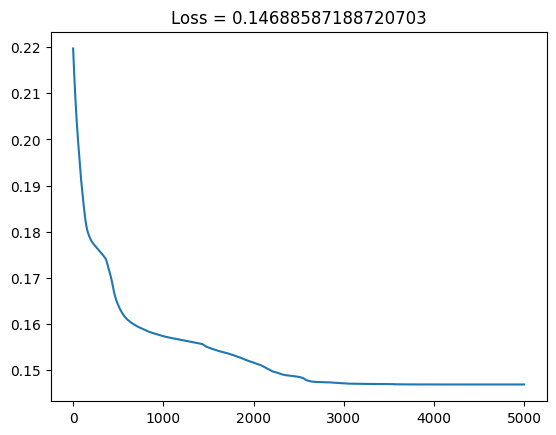

In [ ]:
tf.random.set_seed(0)
adam = tf.keras.optimizers.Adam(learning_rate=0.001)
recursive_model.compile(optimizer=adam, loss='mse')

history = recursive_model.fit(
    X_train_ready,
    y_train2_ready,
    epochs=5000,
    batch_size=1,
    verbose=False,
    callbacks=[TqdmCallback(verbose=True)]
)

losses = history.history['loss']
plt.title(f'Loss = {losses[-1]}')
plt.plot(losses)

1/1 [==============================] - 0s 67ms/step


<Figure size 2500x2500 with 0 Axes>

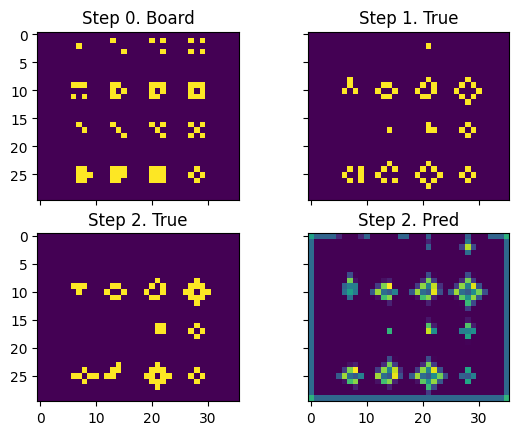

In [ ]:
y_pred2 = recursive_model.predict(np.array(X_test)[None, ..., None])
y_test2 = play_n_steps(X_test, 2, show=False)

plt.figure(figsize=(25,25))
fig, axes = plt.subplots(2, 2, sharey=True, sharex=True)

axes[0][0].set_title('Step 0. Board')
axes[0][0].imshow(X_test)

axes[0][1].set_title('Step 1. True')
axes[0][1].imshow(y_test)

axes[1][0].set_title('Step 2. True')
axes[1][0].imshow(y_test2)

axes[1][1].set_title('Step 2. Pred')
axes[1][1].imshow(
    y_pred2.reshape(X_test.shape[0], X_test.shape[1]))

plt.show()

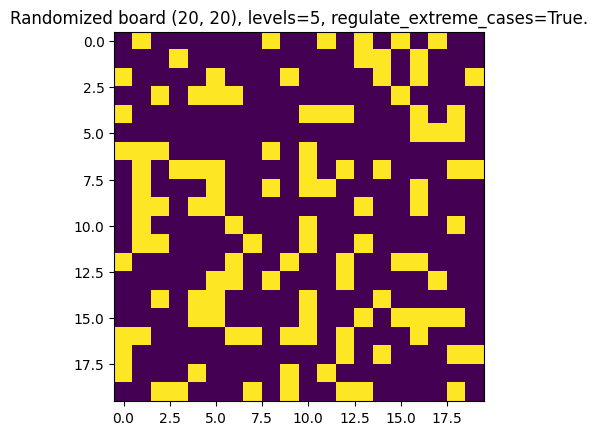

In [ ]:
X_test = generate_board((20, 20), show=True, regulate_extreme_cases=True)

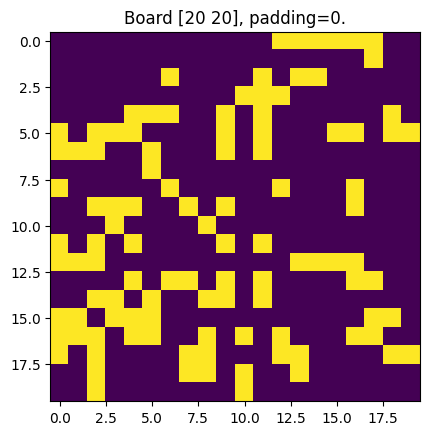

In [ ]:
y_test = play(play(X_test), show=True)

1/1 [==============================] - 0s 80ms/step


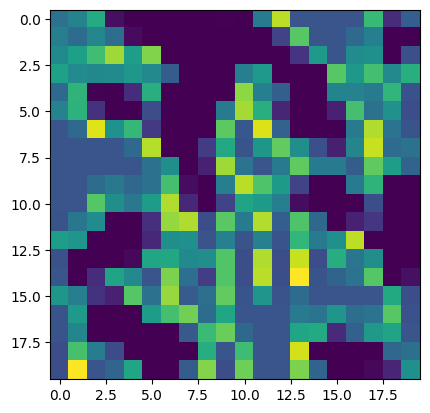

In [ ]:
y_pred = recursive_model.predict(np.array(X_test)[None, ..., None])
y_pred = y_pred.squeeze()  # y_pred.reshape(X_test.shape[0], X_test.shape[1])
plt.imshow(y_pred)

# ##